<a href="https://colab.research.google.com/github/abdallahoismail/Time-Series-Modeling/blob/main/Store_sales_forecasting_kaggle_competition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Store Sales Forecasting

# Setting Up Kaggle API

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()  # This will prompt you to upload kaggle.json

In [ ]:
import os
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                            title                                             size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
anandshaw2001/netflix-movies-and-tv-shows                      Netflix Movies and TV Shows                        1MB  2025-01-03 10:33:01           2774         76  1.0              
stealthtechnologies/predict-student-performance-dataset        Predict Student Performance                       12KB  2024-12-26 12:57:04           3659         85  1.0              
sebastianwillmann/beverage-sales                               Beverage Sales                                   119MB  2025-01-02 21:00:53           1033         23  1.0              
suvroo/credit-card-behaviour-score                             Credit Card Behav

In [ ]:
!kaggle competitions list

ref                                                                                deadline             category                reward  teamCount  userHasEntered  
---------------------------------------------------------------------------------  -------------------  ---------------  -------------  ---------  --------------  
https://www.kaggle.com/competitions/ai-mathematical-olympiad-progress-prize-2      2025-04-01 23:59:00  Featured         2,117,152 Usd        992           False  
https://www.kaggle.com/competitions/konwinski-prize                                2025-03-12 23:59:00  Featured         1,225,000 Usd        161           False  
https://www.kaggle.com/competitions/gemma-language-tuning                          2025-01-15 00:59:00  Analytics          150,000 Usd          0           False  
https://www.kaggle.com/competitions/jane-street-real-time-market-data-forecasting  2025-01-13 23:59:00  Featured           120,000 Usd       3683           False  
https://www.kagg

In [ ]:
!kaggle competitions download -c Store-Sales-Time-Series-Forecasting

 94% 20.0M/21.4M [00:01<00:00, 23.2MB/s]
100% 21.4M/21.4M [00:01<00:00, 13.1MB/s]


In [ ]:
!unzip Store-Sales-Time-Series-Forecasting.zip

Archive:  Store-Sales-Time-Series-Forecasting.zip
  inflating: holidays_events.csv     
  inflating: oil.csv                 
  inflating: sample_submission.csv   
  inflating: stores.csv              
  inflating: test.csv                
  inflating: train.csv               
  inflating: transactions.csv        


# Importing Dependencies

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg')

In [ ]:
test = pd.read_csv('test.csv')
transactions = pd.read_csv('transactions.csv')
oil = pd.read_csv('oil.csv')
holidays_events = pd.read_csv('holidays_events.csv')
stores = pd.read_csv('stores.csv')

In [ ]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [ ]:
holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [ ]:
stores

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


# Reading in the Training set

In [ ]:
train = pd.read_csv('train.csv', parse_dates=['date'], infer_datetime_format=True,
                    index_col='date',
                    dtype={'store_nbr':np.int16,
                        'onpromotion':np.int16,
                        'sales':np.float16})
train.head()

<ipython-input-7-1c529d4a5f74>:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  train = pd.read_csv('train.csv', parse_dates=['date'], infer_datetime_format=True,
/usr/local/lib/python3.10/dist-packages/pandas/io/parsers/c_parser_wrapper.py:234: RuntimeWarning: overflow encountered in cast
  chunks = self._reader.read_low_memory(nrows)


,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0
2013-01-01,1,1,BABY CARE,0.0,0
2013-01-01,2,1,BEAUTY,0.0,0
2013-01-01,3,1,BEVERAGES,0.0,0
2013-01-01,4,1,BOOKS,0.0,0


In [ ]:
train.drop('id', axis=1, inplace=True)

In [ ]:
print(train.dtypes)

store_nbr        int16
family          object
sales          float16
onpromotion      int16
dtype: object


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3000888 entries, 2013-01-01 to 2017-08-15
Data columns (total 4 columns):
 #   Column       Dtype  
---  ------       -----  
 0   store_nbr    int16  
 1   family       object 
 2   sales        float16
 3   onpromotion  int16  
dtypes: float16(1), int16(2), object(1)
memory usage: 63.0+ MB


In [ ]:
train.head()

,store_nbr,family,sales,onpromotion
date,,,,
2013-01-01,1,AUTOMOTIVE,0.0,0
2013-01-01,1,BABY CARE,0.0,0
2013-01-01,1,BEAUTY,0.0,0
2013-01-01,1,BEVERAGES,0.0,0
2013-01-01,1,BOOKS,0.0,0


# Notes about the data:
- we have 33 unique product categories
- 54 stores
- Daily frequency


In [ ]:
train['store_nbr'].nunique(), train['family'].nunique()

(54, 33)

In [ ]:
train['family'].unique(), train['store_nbr'].unique()

(array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
        'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
        'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
        'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
        'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
        'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
        'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
        'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
        'SEAFOOD'], dtype=object),
 array([ 1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,  2, 20, 21, 22, 23, 24,
        25, 26, 27, 28, 29,  3, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,  4,
        40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  5, 50, 51, 52, 53, 54,  6,
         7,  8,  9], dtype=int16))

In [ ]:
train[(train['store_nbr']==1) & (train['family']=='AUTOMOTIVE') & (train['sales']>0)].groupby('date').sum()

,store_nbr,family,sales,onpromotion
date,,,,
2013-01-02,1,AUTOMOTIVE,2.0,0
2013-01-03,1,AUTOMOTIVE,3.0,0
2013-01-04,1,AUTOMOTIVE,3.0,0
2013-01-05,1,AUTOMOTIVE,5.0,0
2013-01-06,1,AUTOMOTIVE,2.0,0
...,...,...,...,...
2017-08-11,1,AUTOMOTIVE,1.0,0
2017-08-12,1,AUTOMOTIVE,6.0,0
2017-08-13,1,AUTOMOTIVE,1.0,0


In [ ]:
train[(train['store_nbr'] == 2) & (train['family'] == 'PRODUCE') & train['sales'] > 0]

,store_nbr,family,sales,onpromotion
date,,,,
2013-03-16,2,PRODUCE,10.0,0
2013-03-17,2,PRODUCE,9.0,0
2013-03-19,2,PRODUCE,31.0,0
2013-03-21,2,PRODUCE,1.0,0
2013-03-22,2,PRODUCE,1.0,0
...,...,...,...,...
2017-08-11,2,PRODUCE,2029.0,8
2017-08-12,2,PRODUCE,2160.0,9
2017-08-13,2,PRODUCE,2476.0,8


In [ ]:
# grouping the data by the date and family to change the frequency to daily
train_grouped = train.groupby(['family', 'date']).agg({'sales':'sum'}).reset_index().sort_values(['family', 'date'])
train_grouped.head()

,family,date,sales
0,AUTOMOTIVE,2013-01-01,0.0
1,AUTOMOTIVE,2013-01-02,255.0
2,AUTOMOTIVE,2013-01-03,161.0
3,AUTOMOTIVE,2013-01-04,169.0
4,AUTOMOTIVE,2013-01-05,342.0


In [ ]:
train_pivot = train_grouped.pivot_table(index='date', columns='family',
                                values='sales', aggfunc='sum')
train_pivot.head()

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.0,0.0,2.0,810.0,0.0,180.625,0.0,186.0,143.0,71.0625,...,0.0,110.812500,25.0,0.0,0.0,42.625000,37.843750,0.0,0.0,0.000000
2013-01-02,255.0,0.0,207.0,72091.0,0.0,26247.750,0.0,74627.0,23380.0,15755.4375,...,0.0,20871.132812,17204.0,0.0,0.0,13975.636719,5338.062500,0.0,0.0,1526.898438
2013-01-03,161.0,0.0,125.0,52106.0,0.0,18456.750,0.0,55891.0,18001.0,11172.9375,...,0.0,16597.125000,12568.0,0.0,0.0,10674.710938,3591.296875,0.0,0.0,1094.335938
2013-01-04,169.0,0.0,133.0,54168.0,0.0,16723.000,0.0,52064.0,18148.0,10143.1250,...,0.0,21625.734375,11303.0,0.0,0.0,10772.054688,4473.171875,0.0,0.0,1293.070312
2013-01-05,342.0,0.0,191.0,77815.0,0.0,22368.000,0.0,70128.0,23083.0,13735.1250,...,0.0,20879.062500,16819.0,0.0,0.0,13475.457031,5829.718750,0.0,0.0,1245.679688


In [ ]:
# plotting
for col in train_pivot.columns:
    plt.plot(train_pivot.index, train_pivot[col], label=col)
    plt.legend()
    plt.show()

In [ ]:
len(train_pivot)

1684

In [ ]:
# most sales before '2015-08-15' is zero so I cut it out
total_sales_df = train_pivot[train_pivot.index >= '2015-08-15']
total_sales_df.head()

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2015-08-15,454.0,18.0,251.0,217120.0,0.0,32510.750,1157.0,75839.0,48578.0,19946.8125,...,153.0,20402.9375,19398.0,370.0,1250.0,24718.09375,6854.53125,128143.750,701.0,1507.191406
2015-08-16,413.0,11.0,313.0,208211.0,0.0,34852.250,724.0,75825.0,50929.0,21178.0000,...,157.0,20615.0625,21048.0,359.0,913.0,25481.31250,6640.75000,131494.500,793.0,1448.710938
2015-08-17,289.0,14.0,175.0,149740.0,0.0,26360.750,593.0,59720.0,38359.0,15755.3125,...,125.0,16725.3750,14854.0,263.0,593.0,18550.43750,5212.34375,102775.875,458.0,1166.179688
2015-08-18,295.0,10.0,166.0,132609.0,0.0,23916.375,709.0,52749.0,33273.0,14119.3125,...,102.0,15377.4375,13064.0,193.0,519.0,15722.12500,4757.90625,106463.750,494.0,951.652344
2015-08-19,314.0,5.0,176.0,131369.0,0.0,23994.250,599.0,51158.0,35760.0,13250.0000,...,102.0,15654.3750,12581.0,257.0,535.0,16361.46875,5275.18750,132457.250,545.0,996.742188


In [ ]:
def missing_data(df):
  total = df.isnull().sum().sort_values(ascending = False)
  percent = (df.isnull().sum()/df.isnull().count()*100).\
  sort_values(ascending = False)
  missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
  return missing_data

In [ ]:
print(missing_data(total_sales_df))

                            Total  Percent
family                                    
AUTOMOTIVE                      0      0.0
HOME APPLIANCES                 0      0.0
SCHOOL AND OFFICE SUPPLIES      0      0.0
PRODUCE                         0      0.0
PREPARED FOODS                  0      0.0
POULTRY                         0      0.0
PLAYERS AND ELECTRONICS         0      0.0
PET SUPPLIES                    0      0.0
PERSONAL CARE                   0      0.0
MEATS                           0      0.0
MAGAZINES                       0      0.0
LIQUOR,WINE,BEER                0      0.0
LINGERIE                        0      0.0
LAWN AND GARDEN                 0      0.0
LADIESWEAR                      0      0.0
HOME CARE                       0      0.0
HOME AND KITCHEN II             0      0.0
BABY CARE                       0      0.0
HOME AND KITCHEN I              0      0.0
HARDWARE                        0      0.0
GROCERY II                      0      0.0
GROCERY I  

# Category Groupings

Let's group these different categories by the volume of data. The higher volume data the better for forecasting since you can forecast past the noise and end up with lower error bars. This will also let us visualize the forecasts on similar scales so that we can figure out if timeseries modeling will work for the categories since timeseries highly depends on seasonal data of a certain variation (addtitive, multiplicative).

In [ ]:
# Calculate the mean daily sales for each product family
avg_sales_df = total_sales_df.apply(np.mean, axis=0).sort_values()
avg_sales_df.round(0)

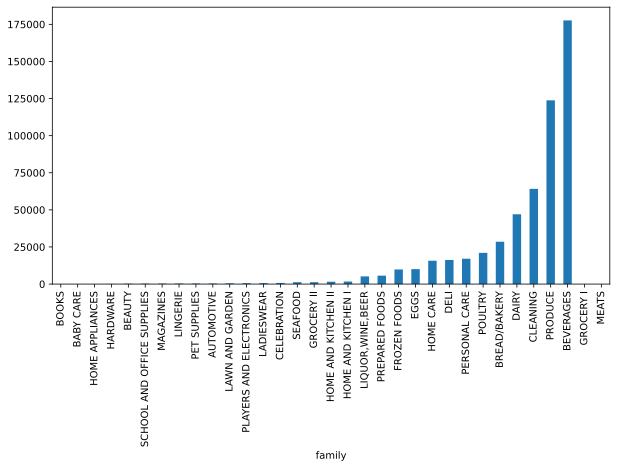

In [ ]:
avg_sales_df.plot(kind='bar', figsize=(10,5))
plt.show()

In [ ]:
#low, mid = np.percentile(total_sales_df.apply(np.mean, axis=0).sort_values(),[33,66])

In [ ]:
# Divide the product categories into low, mid, high average daily sales
low = np.percentile(avg_sales_df, 33)
mid = np.percentile(avg_sales_df, 66)

In [ ]:
mid

10749.089375000005

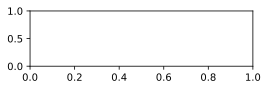

In [ ]:
low_vol_products = avg_sales_df[avg_sales_df <= low].index
mid_vol_products = avg_sales_df[(avg_sales_df > low) & (avg_sales_df < mid)].index
high_vol_products = avg_sales_df[avg_sales_df >= mid].index

In [ ]:
low_vol_products, mid_vol_products, high_vol_products

(Index(['BOOKS', 'BABY CARE', 'HOME APPLIANCES', 'HARDWARE', 'BEAUTY',
        'SCHOOL AND OFFICE SUPPLIES', 'MAGAZINES', 'LINGERIE', 'PET SUPPLIES',
        'AUTOMOTIVE', 'LAWN AND GARDEN'],
       dtype='object', name='family'),
 Index(['PLAYERS AND ELECTRONICS', 'LADIESWEAR', 'CELEBRATION', 'SEAFOOD',
        'GROCERY II', 'HOME AND KITCHEN II', 'HOME AND KITCHEN I',
        'LIQUOR,WINE,BEER', 'PREPARED FOODS', 'FROZEN FOODS', 'EGGS'],
       dtype='object', name='family'),
 Index(['HOME CARE', 'DELI', 'PERSONAL CARE', 'POULTRY', 'BREAD/BAKERY',
        'DAIRY', 'CLEANING', 'PRODUCE', 'BEVERAGES', 'GROCERY I', 'MEATS'],
       dtype='object', name='family'))

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(total_sales_df.index, total_sales_df[high_vol_products])
plt.legend(high_vol_products)
plt.show()

# Training Prophet on the 'PRODUCE' data

In [ ]:
# extracting columns using one set of square brackets returns a pandas series
type(total_sales_df['AUTOMOTIVE'])

In [ ]:
# extracting columns using TWO sets of square brackets returns a pandas Dataframe which required by prophet
type(total_sales_df[['AUTOMOTIVE']])

In [ ]:
total_sales_df

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2015-08-15,454.0,18.0,251.0,217120.0,0.0,32510.750,1157.0,75839.0,48578.0,19946.81250,...,153.0,20402.937500,19398.0,370.0,1250.0,24718.093750,6854.531250,128143.750,701.0,1507.191406
2015-08-16,413.0,11.0,313.0,208211.0,0.0,34852.250,724.0,75825.0,50929.0,21178.00000,...,157.0,20615.062500,21048.0,359.0,913.0,25481.312500,6640.750000,131494.500,793.0,1448.710938
2015-08-17,289.0,14.0,175.0,149740.0,0.0,26360.750,593.0,59720.0,38359.0,15755.31250,...,125.0,16725.375000,14854.0,263.0,593.0,18550.437500,5212.343750,102775.875,458.0,1166.179688
2015-08-18,295.0,10.0,166.0,132609.0,0.0,23916.375,709.0,52749.0,33273.0,14119.31250,...,102.0,15377.437500,13064.0,193.0,519.0,15722.125000,4757.906250,106463.750,494.0,951.652344
2015-08-19,314.0,5.0,176.0,131369.0,0.0,23994.250,599.0,51158.0,35760.0,13250.00000,...,102.0,15654.375000,12581.0,257.0,535.0,16361.468750,5275.187500,132457.250,545.0,996.742188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,441.0,7.0,351.0,189117.0,0.0,28204.375,870.0,55683.0,44907.0,18680.18750,...,500.0,26943.328125,15978.0,587.0,654.0,25316.937500,5199.500000,118736.875,3523.0,1272.625000
2017-08-12,403.0,3.0,369.0,182311.0,0.0,27403.875,849.0,57935.0,42854.0,15690.00000,...,483.0,17775.375000,15903.0,508.0,712.0,19136.437500,4573.640625,111780.250,3644.0,1028.054688
2017-08-13,481.0,9.0,433.0,202345.0,1.0,33262.500,544.0,61756.0,50114.0,17592.78125,...,469.0,18631.875000,18188.0,541.0,741.0,20508.937500,4941.375000,125917.375,3718.0,1118.007812


In [ ]:
feaure = 'PRODUCE'


# prophet requires that the set be in the 'ds, y' format
# extracted feature (using double []) as a dataframe and not as a series so I can rename the columns right away
produce_df = total_sales_df[[feaure]].reset_index().rename(columns={'date':'ds', feaure:'y'})
produce_df.head()

family,ds,y
0,2015-08-15,128143.750
1,2015-08-16,131494.500
2,2015-08-17,102775.875
3,2015-08-18,106463.750
4,2015-08-19,132457.250


In [ ]:
produce_df.tail(46) # the data ends on 2017-08-15,
# so I am gonna train on the data up to 2017-07-01 then do back testing on the
# remaining 45 daya %%

family,ds,y
684,2017-07-01,155486.7500
685,2017-07-02,172895.8750
686,2017-07-03,130380.3750
687,2017-07-04,131539.0000
688,2017-07-05,163807.3750
689,2017-07-06,99397.8750
690,2017-07-07,114344.8750
691,2017-07-08,139289.7500
692,2017-07-09,156639.2500
693,2017-07-10,118864.6250


In [ ]:
print(produce_df.dtypes)

family
ds    datetime64[ns]
y            float32
dtype: object


In [ ]:
# create a train test partition
import datetime
from datetime import date

forecast_start_date = date(2017,7,1).strftime("%Y-%m-%d")
produce_train = produce_df[produce_df['ds'] < forecast_start_date]
produce_test = produce_df[produce_df['ds'] >= forecast_start_date]

In [ ]:
forecast_start_date

'2017-07-01'

In [ ]:
# importing dependencies for the prophet model
from prophet import Prophet
from prophet.diagnostics import performance_metrics
from prophet.diagnostics import cross_validation
from prophet.plot import plot_cross_validation_metric

import holidays
import warnings
warnings.filterwarnings('ignore')

In [ ]:
model = Prophet()
model.fit(produce_train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c4_4x5rh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m1taosz_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61018', 'data', 'file=/tmp/tmpp38mwhql/c4_4x5rh.json', 'init=/tmp/tmpp38mwhql/m1taosz_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr7vxuuxa/prophet_model-20250114170949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:09:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:09:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
future_df = model.make_future_dataframe(periods=len(produce_test), freq='D')
future_df.tail()

,ds
725,2017-08-11
726,2017-08-12
727,2017-08-13
728,2017-08-14
729,2017-08-15


In [ ]:
yhat = model.predict(future_df)
yhat = yhat[['ds', 'yhat']]
yhat

,ds,yhat
0,2015-08-15,130453.320299
1,2015-08-16,141187.255124
2,2015-08-17,108244.332200
3,2015-08-18,113513.358115
4,2015-08-19,146132.683502
...,...,...
725,2017-08-11,117351.522947
726,2017-08-12,146195.439523
727,2017-08-13,156921.524111
728,2017-08-14,123970.750951


In [ ]:
yhat_df = yhat[yhat['ds'] >= forecast_start_date]

In [ ]:
# df pf ytrue and yhat
result = pd.DataFrame()
result['ds'] = produce_test['ds']
result['y'] = produce_test['y']
result['yhat'] = yhat_df['yhat']
result

,ds,y,yhat
684,2017-07-01,155486.7500,144636.472029
685,2017-07-02,172895.8750,155362.556618
686,2017-07-03,130380.3750,122411.783457
687,2017-07-04,131539.0000,127672.959135
688,2017-07-05,163807.3750,160284.434286
689,2017-07-06,99397.8750,102701.612496
690,2017-07-07,114344.8750,116052.383369
691,2017-07-08,139289.7500,144896.299944
692,2017-07-09,156639.2500,155622.384533
693,2017-07-10,118864.6250,122671.611373


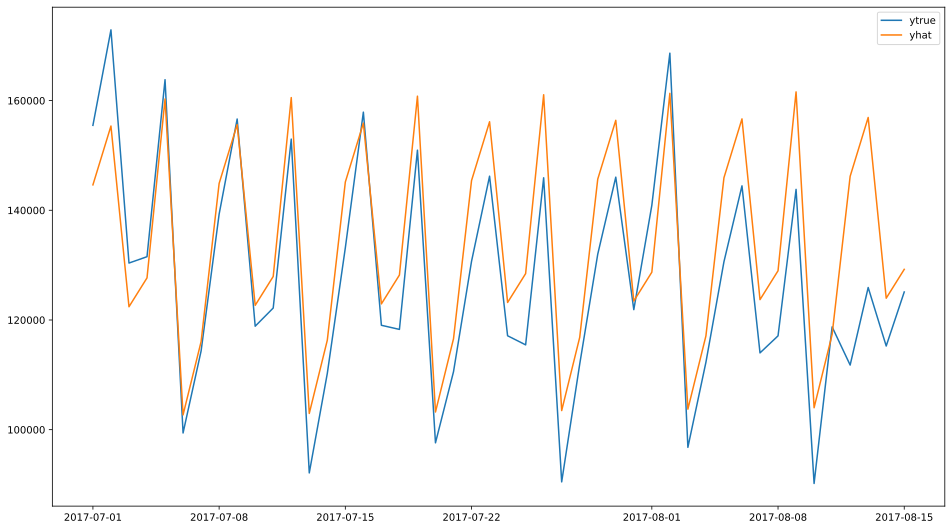

In [ ]:
# plot ytrue vs yhat
plt.figure(figsize=(16,9))
plt.plot(result['ds'], result['y'], label='ytrue')
plt.plot(result['ds'], result['yhat'], label='yhat')
plt.legend()
plt.show()

# Evaluating the model

In [ ]:
# performance metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

mse = mean_squared_error(result['y'], result['yhat'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(result['y'], result['yhat'])
mape = mean_absolute_percentage_error(result['y'], result['yhat'])

In [ ]:
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'MAPE: {mape*100:.2f}%')

MSE: 133210750.19379485
RMSE: 11541.696157575578
MAE: 9405.96676712135
MAPE: 7.57%


# Retraining the model while accounting for holidays

In [ ]:
import holidays
holiday_df = pd.DataFrame([])

ecuador_holidays = holidays.country_holidays('EC', years=[2015, 2016, 2017, 2018])
# returns a dictionary, the ddata is from Ecuador

# now I want to create a time window around each holiday to account for the
# seasonal effect %%
for date_, name in ecuador_holidays.items():
    holiday_df = pd.concat([holiday_df, pd.DataFrame({'ds': [date_], 'holiday':[name],
                                    'lower_window':-2, 'upper_window':1},
                                    index=[0])], ignore_index=True)

In [ ]:
holiday_df.sort_values('ds').reset_index(drop=True)

,ds,holiday,lower_window,upper_window
0,2015-01-01,New Year's Day,-2,1
1,2015-02-16,Carnival,-2,1
2,2015-02-17,Carnival,-2,1
3,2015-04-03,Good Friday,-2,1
4,2015-05-01,Labor Day,-2,1
5,2015-05-24,The Battle of Pichincha,-2,1
6,2015-08-10,Declaration of Independence of Quito,-2,1
7,2015-10-09,Independence of Guayaquil,-2,1
8,2015-11-02,All Souls' Day,-2,1
9,2015-11-03,Independence of Cuenca,-2,1


In [ ]:
model2 = Prophet(holidays=holiday_df)
model2.fit(produce_train)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d5b2m_q0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mxdu0sn9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20344', 'data', 'file=/tmp/tmpp38mwhql/d5b2m_q0.json', 'init=/tmp/tmpp38mwhql/mxdu0sn9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model6ux9elxg/prophet_model-20250114171114.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:11:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:11:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
future_df2 = model2.make_future_dataframe(periods=len(produce_test), freq='D')
future_df2.tail()

,ds
725,2017-08-11
726,2017-08-12
727,2017-08-13
728,2017-08-14
729,2017-08-15


In [ ]:
yhat = model2.predict(future_df2)
yhat = yhat[['ds', 'yhat']]
yhat_df2 = yhat[yhat['ds'] >= forecast_start_date]

In [ ]:
result2 = produce_test.merge(yhat_df2, on='ds', how='left')
result2

,ds,y,yhat
0,2017-07-01,155486.7500,143111.889778
1,2017-07-02,172895.8750,156132.024640
2,2017-07-03,130380.3750,120511.984172
3,2017-07-04,131539.0000,125071.485769
4,2017-07-05,163807.3750,157747.403216
5,2017-07-06,99397.8750,99261.472738
6,2017-07-07,114344.8750,114237.618204
7,2017-07-08,139289.7500,143214.189037
8,2017-07-09,156639.2500,156234.323899
9,2017-07-10,118864.6250,120614.283432


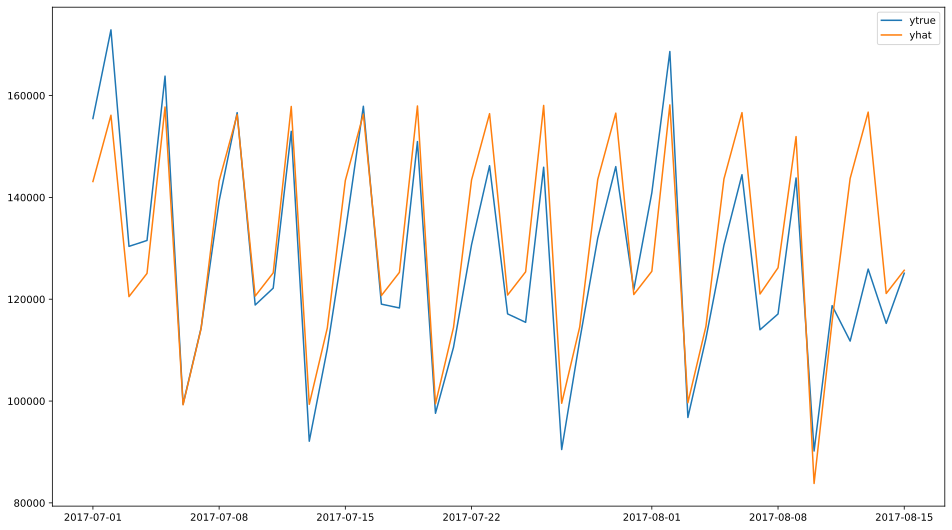

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(result2['ds'], result2['y'], label='ytrue')
plt.plot(result2['ds'], result2['yhat'], label='yhat')
plt.legend()
plt.show()

In [ ]:
# performance metrics

mse = mean_squared_error(result2['y'], result2['yhat'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(result2['y'], result2['yhat'])
mape = mean_absolute_percentage_error(result2['y'], result2['yhat'])

In [ ]:
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'MAPE: {mape*100:.2f}%')

MSE: 103205576.73687351
RMSE: 10159.014555402187
MAE: 7669.344294571606
MAPE: 6.00%


# Cross Validation

In [ ]:
model_cv = Prophet(holidays=holiday_df)
model_cv.fit(produce_train)
cv = cross_validation(model_cv, initial='365 days', period='30 days',
                      horizon='30 days')

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pfkh1oop.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uwg52bd2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20619', 'data', 'file=/tmp/tmpp38mwhql/pfkh1oop.json', 'init=/tmp/tmpp38mwhql/uwg52bd2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5ko6veea/prophet_model-20250114171147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:11:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:11:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 10 forecasts with cu

  0%|          | 0/10 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b1636kq0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zclomfji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6943', 'data', 'file=/tmp/tmpp38mwhql/b1636kq0.json', 'init=/tmp/tmpp38mwhql/zclomfji.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxua41wzw/prophet_model-20250114171147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:11:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:11:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3wjqqvbk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nubq1k8t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

In [ ]:
cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2016-09-04,138007.426365,127261.858247,148934.578442,144967.7500,2016-09-03
1,2016-09-05,104181.846249,94095.338444,116332.888650,110099.8750,2016-09-03
2,2016-09-06,107053.193710,96176.747964,117408.285415,115899.7500,2016-09-03
3,2016-09-07,138452.717488,128509.240074,150021.121484,142813.3125,2016-09-03
4,2016-09-08,81136.694487,70780.417261,92850.406453,85676.0000,2016-09-03
...,...,...,...,...,...,...
294,2017-06-26,119760.887186,108184.909398,131773.857207,113859.6250,2017-05-31
295,2017-06-27,124231.729252,112325.980975,135417.578499,118272.6250,2017-05-31
296,2017-06-28,156765.042994,144760.119947,168811.916809,154669.6250,2017-05-31
297,2017-06-29,98547.683732,87203.862609,110024.032410,92484.6250,2017-05-31


In [ ]:
performance_metrics(cv)['mape'].values[0]

0.09480439386078861

In [ ]:
round(performance_metrics(cv),2)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,3.861451e+08,19650.58,13433.25,0.09,0.08,0.10,0.60
1,4 days,2.725931e+08,16510.39,11405.76,0.08,0.05,0.09,0.60
2,5 days,1.408370e+08,11867.48,8955.39,0.07,0.05,0.07,0.66
3,6 days,1.079198e+08,10388.45,8525.30,0.07,0.06,0.07,0.67
4,7 days,9.005265e+07,9489.61,7924.08,0.06,0.05,0.07,0.73
5,8 days,7.674651e+07,8760.51,7332.84,0.06,0.06,0.06,0.83
6,9 days,7.281776e+07,8533.33,6525.86,0.05,0.04,0.05,0.87
7,10 days,4.549723e+07,6745.16,5008.93,0.04,0.04,0.04,0.93
8,11 days,6.332278e+07,7957.56,5835.55,0.05,0.04,0.05,0.87
9,12 days,7.505550e+07,8663.46,6379.43,0.05,0.04,0.05,0.87


df_p gives you the overall MAPE, but if you want to get more granular and calculate the daily differences using the mape metric, the code is below. This allows you to detect issues in predicting certain time periods, which are inherent issues in the data that you may or may not be able to fix. Timeseries is the prime example that garbage in is going to be garbage out.

In [ ]:
cv['mape'] = (cv['y'] - cv['yhat'])/(cv['y'])*100
cv['overestimate'] = cv['yhat'] > cv['y']
#cv['underestimate'] = cv['yhat'] < cv['y']

cv.sort_values('mape', ascending=False)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff,mape,overestimate
58,2016-11-01,67502.454819,56827.040360,78582.534339,110846.000,2016-10-03,39.102489,False
109,2016-12-22,86592.014706,75480.978672,96565.987339,140441.875,2016-12-02,38.343165,False
120,2017-01-03,122801.769100,111669.306591,134024.252895,183305.250,2017-01-01,33.006955,False
115,2016-12-29,86766.340696,76091.254704,98170.787100,126651.000,2016-12-02,31.491784,False
119,2017-01-02,129054.071667,117604.430162,140502.231270,184112.500,2017-01-01,29.904775,False
...,...,...,...,...,...,...,...,...
231,2017-04-24,126901.646358,114689.632476,138930.699484,105016.750,2017-04-01,-20.839434,True
237,2017-04-30,168974.334228,157642.415080,181243.781042,136310.500,2017-04-01,-23.962816,True
60,2016-11-03,121709.223611,110833.442646,132265.904147,97012.625,2016-11-02,-25.457098,True
167,2017-02-19,161973.333973,150351.100228,173342.394726,123459.250,2017-01-31,-31.195786,True


Note: the model underestimates around the end of the year. From the plot, we can see that on January 1, sales is 0. This can be impurity in the data or an empty inventory

In [ ]:
cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff,mape,overestimate
0,2016-09-04,138007.426365,127261.858247,148934.578442,144967.7500,2016-09-03,4.801291,False
1,2016-09-05,104181.846249,94095.338444,116332.888650,110099.8750,2016-09-03,5.375146,False
2,2016-09-06,107053.193710,96176.747964,117408.285415,115899.7500,2016-09-03,7.632938,False
3,2016-09-07,138452.717488,128509.240074,150021.121484,142813.3125,2016-09-03,3.053353,False
4,2016-09-08,81136.694487,70780.417261,92850.406453,85676.0000,2016-09-03,5.298223,False
...,...,...,...,...,...,...,...,...
294,2017-06-26,119760.887186,108184.909398,131773.857207,113859.6250,2017-05-31,-5.182928,True
295,2017-06-27,124231.729252,112325.980975,135417.578499,118272.6250,2017-05-31,-5.038448,True
296,2017-06-28,156765.042994,144760.119947,168811.916809,154669.6250,2017-05-31,-1.354770,True
297,2017-06-29,98547.683732,87203.862609,110024.032410,92484.6250,2017-05-31,-6.555748,True


# Hyperparameter Tuning

In [ ]:
param_grid = {'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
              'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
              'seasonality_mode': ['additive', 'multiplicative']}

import itertools
from itertools import product
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
all_params

[{'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 0.01,
  'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 0.01,
  'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 0.1,
  'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 0.1,
  'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 1.0,
  'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 1.0,
  'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 10.0,
  'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001,
  'seasonality_prior_scale': 10.0,
  'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.01,
  'seasonality_prior_scale': 0.01,
  'seasonality_mode': 'additive'},
 {'changepoint_prior_scale'

In [ ]:
rmses=[]

for params in all_params:
    model = Prophet(**params, holidays=holiday_df).fit(produce_train)
    df_cv = cross_validation(model, initial='365 days', period='30 days',
                             horizon = '30 days', parallel='processes')
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/877o5ad6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/waqe47od.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62959', 'data', 'file=/tmp/tmpp38mwhql/877o5ad6.json', 'init=/tmp/tmpp38mwhql/waqe47od.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelaf89wv6f/prophet_model-20250114171311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:13:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:13:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 10 forecasts with cu

In [ ]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
tuning_results.sort_values('rmse', ascending=True)

,changepoint_prior_scale,seasonality_prior_scale,seasonality_mode,rmse
20,0.100,1.00,additive,13437.669290
22,0.100,10.00,additive,13448.154431
18,0.100,0.10,additive,13488.594108
16,0.100,0.01,additive,13513.895569
21,0.100,1.00,multiplicative,13556.279264
19,0.100,0.10,multiplicative,13569.855215
23,0.100,10.00,multiplicative,13577.989124
30,0.500,10.00,additive,13590.505814
28,0.500,1.00,additive,13597.166731
26,0.500,0.10,additive,13609.960090


In [ ]:
tuning_results.sort_values('rmse', ascending=True).reset_index(drop=True).iloc[0]

,0
changepoint_prior_scale,0.1
seasonality_prior_scale,1.0
seasonality_mode,additive
rmse,13437.66929


In [ ]:
dict(tuning_results.sort_values('rmse', ascending=True).reset_index(drop=True).iloc[0])

{'changepoint_prior_scale': 0.1,
 'seasonality_prior_scale': 1.0,
 'seasonality_mode': 'additive',
 'rmse': 13437.66928956409}

In [ ]:
best_params_dictionary = dict(tuning_results.sort_values('rmse').\
                         reset_index(drop=True).\
                         drop('rmse',axis='columns').iloc[0])

In [ ]:
model_final = Prophet(changepoint_prior_scale = best_params_dictionary['changepoint_prior_scale'],
                     seasonality_prior_scale = best_params_dictionary['seasonality_prior_scale'],
                     seasonality_mode=best_params_dictionary['seasonality_mode'], holidays=holiday_df).\
                     fit(produce_train)


future = model_final.make_future_dataframe(periods=len(produce_test))
model_final_yhat = model_final.predict(future)

#adding filter to only add the forecasted data into predicted_df
filter = model_final_yhat['ds']>=forecast_start_date
predicted_df = model_final_yhat[filter][['ds','yhat']]

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o1az_018.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nk2jsxa2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64918', 'data', 'file=/tmp/tmpp38mwhql/o1az_018.json', 'init=/tmp/tmpp38mwhql/nk2jsxa2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modell5z8oc3a/prophet_model-20250114172415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:24:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:24:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
predicted_df

,ds,yhat
684,2017-07-01,142112.581335
685,2017-07-02,155099.677328
686,2017-07-03,119453.282053
687,2017-07-04,124018.478511
688,2017-07-05,156664.287155
689,2017-07-06,98144.924139
690,2017-07-07,113131.599846
691,2017-07-08,142116.989482
692,2017-07-09,155104.085475
693,2017-07-10,119457.690199


In [ ]:
final_result = produce_test.merge(predicted_df, on='ds', how='left')
final_result

,ds,y,yhat
0,2017-07-01,155486.7500,142112.581335
1,2017-07-02,172895.8750,155099.677328
2,2017-07-03,130380.3750,119453.282053
3,2017-07-04,131539.0000,124018.478511
4,2017-07-05,163807.3750,156664.287155
5,2017-07-06,99397.8750,98144.924139
6,2017-07-07,114344.8750,113131.599846
7,2017-07-08,139289.7500,142116.989482
8,2017-07-09,156639.2500,155104.085475
9,2017-07-10,118864.6250,119457.690199


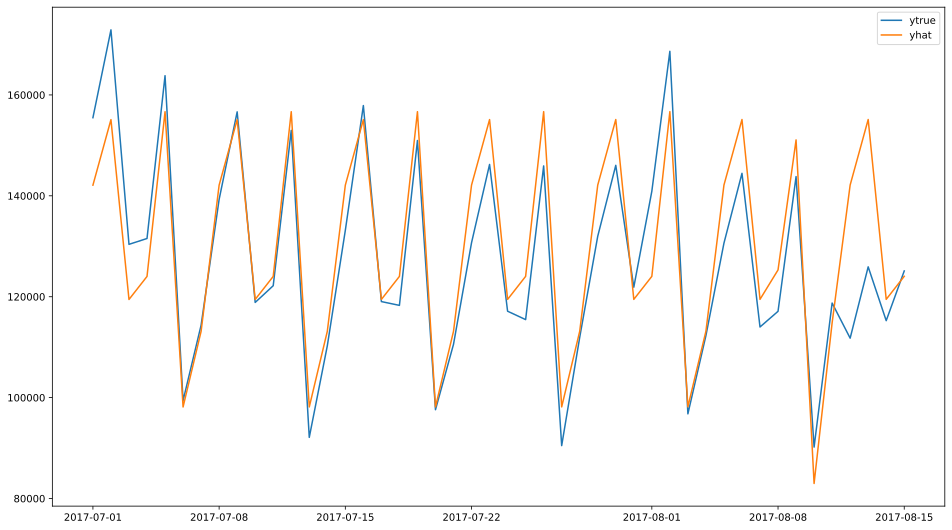

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(final_result['ds'], final_result['y'], label='ytrue')
plt.plot(final_result['ds'], final_result['yhat'], label='yhat')
plt.legend()
plt.show()

In [ ]:
mape = mean_absolute_percentage_error(final_result['y'], final_result['yhat'])
print(f'MAPE: {mape*100:.2f}%')

MAPE: 5.53%


# Insight into the Model
## the model underpredicts around January 1 of every year which is causing the high errors: (Note graph below)

<function matplotlib.pyplot.show(close=None, block=None)>

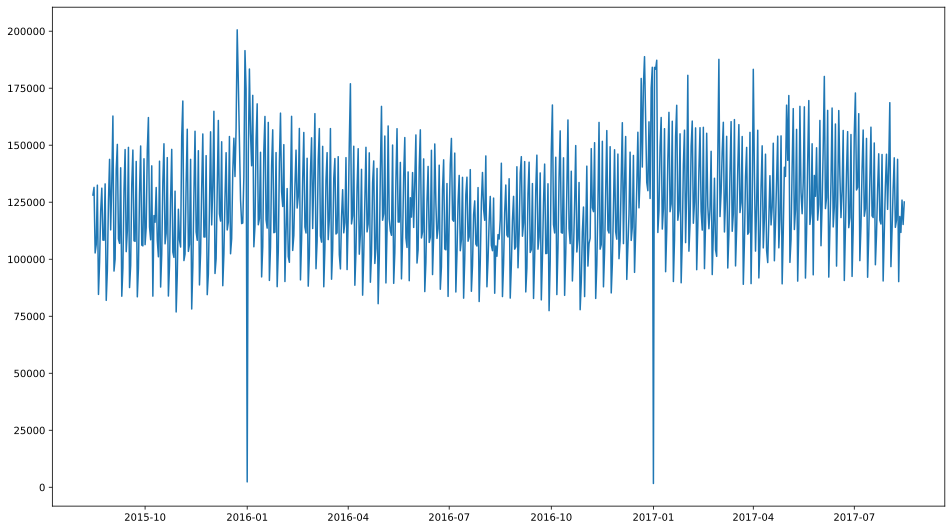

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(produce_df['ds'], produce_df['y'], label='ytrue')
plt.show

# Forecasting Pipeline for All Product Categories

# DATA CLEANING REQUIREMENTS
- Remove low-volume data that can't be predicted.
Remove situations where there's not enough data. (i.e. by visual inspection or by number of '0' daily sales counts.
- Remove outliers (automated by calculating z-score and just removing it and having Prophet impute those values). This will remove the outliers near 0 for all categories.
- Check if more data needs to be removed after filtering to 08/15/15 - 08/15/17. If not, then we can move throughout the pipeline.

In [ ]:
total_sales_df.apply(np.mean, axis=0) > 1000

,0
family,
AUTOMOTIVE,False
BABY CARE,False
BEAUTY,False
BEVERAGES,True
BOOKS,False
BREAD/BAKERY,True
CELEBRATION,False
CLEANING,True
DAIRY,True


In [ ]:
total_sales_df.columns[total_sales_df.apply(np.mean, axis=0) > 1000]

Index(['BEVERAGES', 'BREAD/BAKERY', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HOME AND KITCHEN I',
       'HOME AND KITCHEN II', 'HOME CARE', 'LIQUOR,WINE,BEER', 'MEATS',
       'PERSONAL CARE', 'POULTRY', 'PREPARED FOODS', 'PRODUCE', 'SEAFOOD'],
      dtype='object', name='family')

In [ ]:
total_sales_df[total_sales_df.columns[total_sales_df.apply(np.mean, axis=0) > 1000]]

family,BEVERAGES,BREAD/BAKERY,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME CARE,"LIQUOR,WINE,BEER",MEATS,PERSONAL CARE,POULTRY,PREPARED FOODS,PRODUCE,SEAFOOD
date,,,,,,,,,,,,,,,,,,,
2015-08-15,217120.0,32510.750,75839.0,48578.0,19946.81250,11232.0,10075.093750,280490.0,1552.0,1899.0,1526.0,18924.0,9423.0,20402.937500,19398.0,24718.093750,6854.531250,128143.750,1507.191406
2015-08-16,208211.0,34852.250,75825.0,50929.0,21178.00000,11977.0,7526.000000,266670.0,1441.0,1418.0,1850.0,19757.0,0.0,20615.062500,21048.0,25481.312500,6640.750000,131494.500,1448.710938
2015-08-17,149740.0,26360.750,59720.0,38359.0,15755.31250,10713.0,5145.375000,205154.0,1161.0,1143.0,1343.0,14120.0,2968.0,16725.375000,14854.0,18550.437500,5212.343750,102775.875,1166.179688
2015-08-18,132609.0,23916.375,52749.0,33273.0,14119.31250,8123.0,5050.781250,181026.0,955.0,1181.0,1320.0,12202.0,2984.0,15377.437500,13064.0,15722.125000,4757.906250,106463.750,951.652344
2015-08-19,131369.0,23994.250,51158.0,35760.0,13250.00000,8001.0,5372.312500,178555.0,1011.0,1132.0,1249.0,12042.0,3786.0,15654.375000,12581.0,16361.468750,5275.187500,132457.250,996.742188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,189117.0,28204.375,55683.0,44907.0,18680.18750,9428.0,9473.312500,238217.0,1653.0,2189.0,1504.0,13747.0,11033.0,26943.328125,15978.0,25316.937500,5199.500000,118736.875,1272.625000
2017-08-12,182311.0,27403.875,57935.0,42854.0,15690.00000,9560.0,9077.812500,238618.0,1555.0,2046.0,1504.0,14692.0,10058.0,17775.375000,15903.0,19136.437500,4573.640625,111780.250,1028.054688
2017-08-13,202345.0,33262.500,61756.0,50114.0,17592.78125,11478.0,6476.140625,258448.0,1504.0,1874.0,1625.0,16564.0,4294.0,18631.875000,18188.0,20508.937500,4941.375000,125917.375,1118.007812


In [ ]:
# extracting the columns with high daily volume of sales and saving as a new df
new_sales_df = total_sales_df[total_sales_df.columns[total_sales_df.apply(np.mean, axis=0) > 1000]]

In [ ]:
old_len=len(total_sales_df.columns)
new_len=len(new_sales_df.columns)

print(f'We removed {old_len-new_len} columns as they have low sales volume')

We removed 14 columns as they have low sales volume


In [ ]:
# in the new set, examine the proportion of days where we have zero sales
print((new_sales_df == 0).sum(axis=0) / new_sales_df.sum(axis=0))

family
BEVERAGES              0.000000
BREAD/BAKERY           0.000000
CLEANING               0.000000
DAIRY                  0.000000
DELI                   0.000000
EGGS                   0.000000
FROZEN FOODS           0.000000
GROCERY I              0.000000
GROCERY II             0.000000
HOME AND KITCHEN I     0.000000
HOME AND KITCHEN II    0.000000
HOME CARE              0.000000
LIQUOR,WINE,BEER       0.000011
MEATS                  0.000000
PERSONAL CARE          0.000000
POULTRY                0.000000
PREPARED FOODS         0.000000
PRODUCE                0.000000
SEAFOOD                0.000000
dtype: float64


In [ ]:
import scipy.stats as stats

In [ ]:
#Breaking out each priduct family into it's own dataframe for prediction since each will have different rows affected
prediction_df_list = []

#Cleaning up dataframe using z-score to remove outliers which heavily bias the model (underprediction)
for column in new_sales_df.columns:
    df_clean = new_sales_df[[column]].reset_index()

    z = np.abs(stats.zscore(df_clean[column]))
    outlier_index = np.where(z > 2.7)[0] #As 99.7% of the data points lie within 3 standard deviations (Gaussian Distribution)
    print("Dropping "+str(len(outlier_index))+" rows for following category: "+column)
    df_clean.drop(index=outlier_index,inplace=True)
    df_clean.set_index('date', inplace=True)
    prediction_df_list.append(df_clean)

Dropping 7 rows for following category: BEVERAGES
Dropping 11 rows for following category: BREAD/BAKERY
Dropping 10 rows for following category: CLEANING
Dropping 10 rows for following category: DAIRY
Dropping 9 rows for following category: DELI
Dropping 12 rows for following category: EGGS
Dropping 22 rows for following category: FROZEN FOODS
Dropping 0 rows for following category: GROCERY I
Dropping 15 rows for following category: GROCERY II
Dropping 23 rows for following category: HOME AND KITCHEN I
Dropping 15 rows for following category: HOME AND KITCHEN II
Dropping 13 rows for following category: HOME CARE
Dropping 11 rows for following category: LIQUOR,WINE,BEER
Dropping 0 rows for following category: MEATS
Dropping 14 rows for following category: PERSONAL CARE
Dropping 5 rows for following category: POULTRY
Dropping 3 rows for following category: PREPARED FOODS
Dropping 4 rows for following category: PRODUCE
Dropping 4 rows for following category: SEAFOOD


In [ ]:
for i in range(len(prediction_df_list)):
    plt.figure(figsize=(16,9))
    plt.plot(prediction_df_list[i])
    plt.title(prediction_df_list[i].columns[0]+'- Average Daily Sales: '+str(prediction_df_list[i].mean()))
    plt.ylim(ymin=0)
    plt.show()

In [ ]:
import time
import itertools

In [ ]:
changepoint_prior_scale_range = np.linspace(0.001, 0.5, num=5).tolist()
print(changepoint_prior_scale_range)

[0.001, 0.12575, 0.2505, 0.37525, 0.5]


In [ ]:
seasonality_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()
holidays_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()

In [ ]:
start_time = time.time()

dicts = {}

for feature in new_sales_df.columns:

    category_df = new_sales_df[feature].copy().reset_index()
    category_df.columns = ["ds", "y"] # renaming columns
    # first time I ran this I got an error due to np.inf in y
    category_df['y'].replace([np.inf, -np.inf], np.nan, inplace=True)


    # rnsuring correct dtypes
    category_df[["y"]] = category_df[["y"]].apply(pd.to_numeric)
    category_df["ds"] = pd.to_datetime(category_df["ds"])

    param_grid = {
        "changepoint_prior_scale": changepoint_prior_scale_range,
        "seasonality_prior_scale": seasonality_prior_scale_range}
        #'holidays_prior_scale': holidays_prior_scale_range,
        #'seasonality_mode': seasonality_mode_options,
        #'changepoint_range': changepoint_range_range,

    # Generate all combinations of parameters
    all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
    rmses = []

    # Use cross validation to evaluate all parameters
    for params in all_params:
        m = Prophet(**params).fit(category_df)  # Fit model with given params
        df_cv = cross_validation(m, initial="365 days", period="30 days", horizon = "30 days") #took parallel out
        df_p = performance_metrics(df_cv, rolling_window=1)
        print(df_p)
        rmses.append(df_p['rmse'].values[0])

    # Find the best parameters
    tuning_results = pd.DataFrame(all_params)
    tuning_results["rmse"] = rmses

    print(feature)
    print(tuning_results.head())

    params_dict = dict(tuning_results.sort_values("rmse").reset_index(drop=True).iloc[0])
    params_dict["column"] = feature

    dicts[feature] = params_dict

print("--- %s seconds ---" % (time.time() - start_time)) #about 18 minutes

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_u9jy7an.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mjhe0hy8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69206', 'data', 'file=/tmp/tmpp38mwhql/_u9jy7an.json', 'init=/tmp/tmpp38mwhql/mjhe0hy8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeld9c60x4f/prophet_model-20250114185146.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:51:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:51:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p426f_z8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o86zgx_v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90628', 'data', 'file=/tmp/tmpp38mwhql/p426f_z8.json', 'init=/tmp/tmpp38mwhql/o86zgx_v.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljudq0vke/prophet_model-20250114185147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:51:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:51:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:51:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wctmt5gk.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.923696e+09  43859.959122  32471.861761  0.323583  0.140419   

      smape  coverage  
0  0.186441  0.649025  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/er692xcq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ieppo3m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7737', 'data', 'file=/tmp/tmpp38mwhql/er692xcq.json', 'init=/tmp/tmpp38mwhql/4ieppo3m.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzoiqqcvr/prophet_model-20250114185155.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:51:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:51:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:51:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tahwv7g4.json
DEB

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  2.137599e+09  46234.180148  36068.815148  0.364788  0.169758   

      smape  coverage  
0  0.220119  0.562674  


18:52:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m566n9oh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/084vzgnx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36024', 'data', 'file=/tmp/tmpp38mwhql/m566n9oh.json', 'init=/tmp/tmpp38mwhql/084vzgnx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellk9hqma_/prophet_model-20250114185204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:52:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ik7r3he.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  2.174422e+09  46630.703052  36480.461285  0.366878  0.172761   

      smape  coverage  
0  0.223151  0.562674  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d1u4y9ps.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qu5k95ci.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51451', 'data', 'file=/tmp/tmpp38mwhql/d1u4y9ps.json', 'init=/tmp/tmpp38mwhql/qu5k95ci.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelivl6wbcm/prophet_model-20250114185213.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:52:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6yz4zb8v.json
DE

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.165510e+09  46535.038162  36454.10227  0.366637  0.173667   

      smape  coverage  
0  0.222621  0.559889  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zfzcia7r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7xpaoc6e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76296', 'data', 'file=/tmp/tmpp38mwhql/zfzcia7r.json', 'init=/tmp/tmpp38mwhql/7xpaoc6e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkpertovg/prophet_model-20250114185223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:52:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zmm81983.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  2.156120e+09  46434.036337  36181.048763  0.364765  0.172501   

      smape  coverage  
0  0.220625  0.571031  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aemg5xr1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zd3h_sef.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89425', 'data', 'file=/tmp/tmpp38mwhql/aemg5xr1.json', 'init=/tmp/tmpp38mwhql/zd3h_sef.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyoxw5ijk/prophet_model-20250114185231.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kdtrzsho.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g59_35oh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.031283e+09  32113.598973  22307.074741  0.294019  0.092957   

     smape  coverage  
0  0.11926  0.763231  


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sxctgmxx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bcr32s84.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14256', 'data', 'file=/tmp/tmpp38mwhql/sxctgmxx.json', 'init=/tmp/tmpp38mwhql/bcr32s84.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelap4abmor/prophet_model-20250114185235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6nxuhzdm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vv19m1qh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27378', 'data', 'file=/tmp/tmpp38mwhql/6nxuhzdm.json', 'init=/tmp/tmpp38mwhql/vv19m1qh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkrv5kjrk/prophet_model-20250114185235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_3ffx1rk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y2q_45ge.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.015862e+09  31872.586781  21647.040093  0.302177  0.084932   

      smape  coverage  
0  0.116602   0.78273  


18:52:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_oyr16w5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ixl98r_d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86791', 'data', 'file=/tmp/tmpp38mwhql/_oyr16w5.json', 'init=/tmp/tmpp38mwhql/ixl98r_d.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model04fdds8n/prophet_model-20250114185239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1xy3xz49.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v389auif.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.009939e+09  31779.536258  21569.537294  0.301722  0.085944   

      smape  coverage  
0  0.116241  0.791086  


18:52:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k41z8kfs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b9bybgnp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18874', 'data', 'file=/tmp/tmpp38mwhql/k41z8kfs.json', 'init=/tmp/tmpp38mwhql/b9bybgnp.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeltzfg2ytf/prophet_model-20250114185242.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y8ln2nr8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hxiyo4e8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.014095e+09  31844.858138  21604.979782  0.302311  0.085754   

      smape  coverage  
0  0.116482  0.791086  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gdog39t4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k1qb_3pu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78618', 'data', 'file=/tmp/tmpp38mwhql/gdog39t4.json', 'init=/tmp/tmpp38mwhql/k1qb_3pu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellu08n4_e/prophet_model-20250114185245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0xcrg58l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sktkbqy4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.021441e+09  31959.983078  21768.713931  0.302447  0.086368   

      smape  coverage  
0  0.117349  0.785515  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6byp_7cf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z5zruo_t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54282', 'data', 'file=/tmp/tmpp38mwhql/6byp_7cf.json', 'init=/tmp/tmpp38mwhql/z5zruo_t.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeledvwe1hv/prophet_model-20250114185249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q0idp_56.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h2pvh2c7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.055066e+09  32481.785357  22330.193409  0.296764  0.089707   

      smape  coverage  
0  0.119378  0.766017  


18:52:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mferg87w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nmsw214t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32247', 'data', 'file=/tmp/tmpp38mwhql/mferg87w.json', 'init=/tmp/tmpp38mwhql/nmsw214t.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelh8sb3oe5/prophet_model-20250114185253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:52:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:52:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lzuj0sxp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gvyrzcfk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.074942e+09  32786.309012  22250.17596  0.307851  0.086947   

      smape  coverage  
0  0.120648  0.763231  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bp_04yme.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vb3r4934.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98778', 'data', 'file=/tmp/tmpp38mwhql/bp_04yme.json', 'init=/tmp/tmpp38mwhql/vb3r4934.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelz_u4613_/prophet_model-20250114185301.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d8k5zmdp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/52qmr34y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.068838e+09  32693.084968  22201.683159  0.307426  0.087936   

      smape  coverage  
0  0.120571   0.75766  


18:53:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9f8_et6u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6ylfrzxb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97603', 'data', 'file=/tmp/tmpp38mwhql/9f8_et6u.json', 'init=/tmp/tmpp38mwhql/6ylfrzxb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb6pmffb4/prophet_model-20250114185305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9q5xcu2h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t2lvpciu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.075747e+09  32798.575425  22266.820926  0.308458  0.089596   

      smape  coverage  
0  0.121092   0.75766  


18:53:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9ki8hzrz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/by8u0x7z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62606', 'data', 'file=/tmp/tmpp38mwhql/9ki8hzrz.json', 'init=/tmp/tmpp38mwhql/by8u0x7z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellxnhnq0_/prophet_model-20250114185309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jxpcvzq6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wheyq_69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.072078e+09  32742.598667  22220.268206  0.308151  0.090382   

      smape  coverage  
0  0.120752  0.768802  


18:53:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_xr1wu69.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oyulhotd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44052', 'data', 'file=/tmp/tmpp38mwhql/_xr1wu69.json', 'init=/tmp/tmpp38mwhql/oyulhotd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelvu96olbv/prophet_model-20250114185313.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/16hrv1ci.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n4jq4sxo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.042730e+09  32291.336964  22096.257963  0.298036  0.085117   

      smape  coverage  
0  0.118172  0.793872  


18:53:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qdb8_0zd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y15s0du_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39981', 'data', 'file=/tmp/tmpp38mwhql/qdb8_0zd.json', 'init=/tmp/tmpp38mwhql/y15s0du_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnwsfarp6/prophet_model-20250114185317.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a8d2rnht.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uq7a0c3l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape    mdape  \
0 30 days  1.110633e+09  33326.157489  23020.110193  0.314429  0.09828   

      smape  coverage  
0  0.125718   0.75766  


18:53:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/73_nvgeo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u_6g67yr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15945', 'data', 'file=/tmp/tmpp38mwhql/73_nvgeo.json', 'init=/tmp/tmpp38mwhql/u_6g67yr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzedaelwu/prophet_model-20250114185320.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l1zh71p0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/605azxzv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse         mae      mape     mdape  \
0 30 days  1.120659e+09  33476.251074  23148.5579  0.315399  0.098026   

     smape  coverage  
0  0.12661  0.752089  


18:53:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ki5_8fpu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sjhwtrw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77829', 'data', 'file=/tmp/tmpp38mwhql/ki5_8fpu.json', 'init=/tmp/tmpp38mwhql/sjhwtrw8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1_3ks8v5/prophet_model-20250114185324.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ptpw9yon.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bk0he8ok.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.111970e+09  33346.209749  23053.63614  0.314296  0.100861   

      smape  coverage  
0  0.126066  0.752089  


18:53:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5q9ca8g7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w677lqg7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36648', 'data', 'file=/tmp/tmpp38mwhql/5q9ca8g7.json', 'init=/tmp/tmpp38mwhql/w677lqg7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9kut4s91/prophet_model-20250114185329.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gk_23lg9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9jy7qta8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse           mae      mape   mdape     smape  \
0 30 days  1.109925e+09  33315.5439  22953.073327  0.316185  0.0954  0.125395   

   coverage  
0  0.766017  


18:53:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sm_ew_fl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/57wr4lyi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28285', 'data', 'file=/tmp/tmpp38mwhql/sm_ew_fl.json', 'init=/tmp/tmpp38mwhql/57wr4lyi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhil9y7ij/prophet_model-20250114185332.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/exijmrf6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rvx5sx5n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae     mape     mdape  \
0 30 days  1.027846e+09  32060.030518  21863.941904  0.29768  0.088418   

      smape  coverage  
0  0.116679  0.788301  


18:53:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1ouxulhz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nc4j3ih_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4479', 'data', 'file=/tmp/tmpp38mwhql/1ouxulhz.json', 'init=/tmp/tmpp38mwhql/nc4j3ih_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln2nx1zz2/prophet_model-20250114185336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g1nmiej_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p2mxgpr3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.157121e+09  34016.478834  23827.81229  0.318502  0.103189   

      smape  coverage  
0  0.131035  0.740947  


18:53:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8sn0w28_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ix15t5hv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5899', 'data', 'file=/tmp/tmpp38mwhql/8sn0w28_.json', 'init=/tmp/tmpp38mwhql/ix15t5hv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkqfaf08k/prophet_model-20250114185340.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4r4rijao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5zykz2h5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.155623e+09  33994.462338  23805.399674  0.319835  0.106905   

      smape  coverage  
0  0.131129  0.732591  


18:53:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0_3t7xc2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qany6a1k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54597', 'data', 'file=/tmp/tmpp38mwhql/0_3t7xc2.json', 'init=/tmp/tmpp38mwhql/qany6a1k.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnzzyhve2/prophet_model-20250114185345.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a0bmtont.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4rg62qsn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape    mdape  \
0 30 days  1.165758e+09  34143.202121  23954.346825  0.321085  0.10722   

      smape  coverage  
0  0.132143  0.732591  


18:53:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ukwwsyt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g1g_os_0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23578', 'data', 'file=/tmp/tmpp38mwhql/4ukwwsyt.json', 'init=/tmp/tmpp38mwhql/g1g_os_0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelsm7fyid0/prophet_model-20250114185349.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/emxg4e6b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7ukei7kx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.158201e+09  34032.347144  23869.539021  0.319606  0.106356   

      smape  coverage  
0  0.131399  0.749304  
BEVERAGES
   changepoint_prior_scale  seasonality_prior_scale          rmse
0                    0.001                   0.0100  43859.959122
1                    0.001                   2.5075  46234.180148
2                    0.001                   5.0050  46630.703052
3                    0.001                   7.5025  46535.038162
4                    0.001                  10.0000  46434.036337


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ucd3g6xi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sck3cbav.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76006', 'data', 'file=/tmp/tmpp38mwhql/ucd3g6xi.json', 'init=/tmp/tmpp38mwhql/sck3cbav.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelj515abxp/prophet_model-20250114185353.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:53:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:53:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xnyoiog0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lbcwlv00.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape   smape  \
0 30 days  1.949850e+07  4415.710608  3060.975531  0.298508  0.079418  0.1048   

   coverage  
0  0.752089  


18:54:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xmeludcd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zrs2ro_h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39005', 'data', 'file=/tmp/tmpp38mwhql/xmeludcd.json', 'init=/tmp/tmpp38mwhql/zrs2ro_h.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb5bisf15/prophet_model-20250114185401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lqza22pi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ilh30ig.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.226227e+07  4718.291456  3374.963534  0.316217  0.093559   

      smape  coverage  
0  0.120793  0.704735  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wg27qegt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c0w9u0vu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29116', 'data', 'file=/tmp/tmpp38mwhql/wg27qegt.json', 'init=/tmp/tmpp38mwhql/c0w9u0vu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model50jvszf6/prophet_model-20250114185409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pxf6_1pc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/49wsr9q7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.451077e+07  4950.834823  3618.820275  0.325107  0.101869   

      smape  coverage  
0  0.130922  0.651811  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ailjgnak.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m375unxj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49999', 'data', 'file=/tmp/tmpp38mwhql/ailjgnak.json', 'init=/tmp/tmpp38mwhql/m375unxj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljlzn9qkm/prophet_model-20250114185422.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y6kn4v1n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2lqnsmzv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.019498e+07  4493.882522  3265.360178  0.313744  0.092665   

      smape  coverage  
0  0.116141  0.704735  


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rajo1lxi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c_tlk1mz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72641', 'data', 'file=/tmp/tmpp38mwhql/rajo1lxi.json', 'init=/tmp/tmpp38mwhql/c_tlk1mz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrvzp6gup/prophet_model-20250114185437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fx9p20_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fu27xf40.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  2.115457e+07  4599.410185  3295.845843  0.314388  0.09312   

      smape  coverage  
0  0.117902  0.721448  


18:54:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c1ywoh4x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/11nlqjgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90209', 'data', 'file=/tmp/tmpp38mwhql/c1ywoh4x.json', 'init=/tmp/tmpp38mwhql/11nlqjgy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyzqpiif1/prophet_model-20250114185451.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_gg4k7vy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6byn55y0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.443688e+07  3799.589519  2579.450198  0.292754  0.072169   

      smape  coverage  
0  0.087601  0.799443  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u3lo169q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7s_lwybw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62489', 'data', 'file=/tmp/tmpp38mwhql/u3lo169q.json', 'init=/tmp/tmpp38mwhql/7s_lwybw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeleie01vso/prophet_model-20250114185455.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6aouj_61.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dvb6ebv0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.475422e+07  3841.122751  2513.104275  0.297327  0.065555   

      smape  coverage  
0  0.085623  0.805014  


18:54:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0pxbsq_v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6qu9n9aw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56546', 'data', 'file=/tmp/tmpp38mwhql/0pxbsq_v.json', 'init=/tmp/tmpp38mwhql/6qu9n9aw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnrfm1vn5/prophet_model-20250114185458.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:54:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:54:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pvubmlyk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u86xkk5e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.472039e+07  3836.716272  2511.930821  0.297459  0.065321   

      smape  coverage  
0  0.085615  0.799443  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y61ntlg9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gcbye9u8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60790', 'data', 'file=/tmp/tmpp38mwhql/y61ntlg9.json', 'init=/tmp/tmpp38mwhql/gcbye9u8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model357_835b/prophet_model-20250114185502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rn9ypvwd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cd3kq_2o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.464701e+07  3827.140705  2488.039145  0.296601  0.063357   

      smape  coverage  
0  0.084754  0.807799  


18:55:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/de4w82v_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lwodd1ox.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89651', 'data', 'file=/tmp/tmpp38mwhql/de4w82v_.json', 'init=/tmp/tmpp38mwhql/lwodd1ox.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfsyd_xwr/prophet_model-20250114185506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s4hsxjts.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m0xgh1b0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape    mdape     smape  \
0 30 days  1.466368e+07  3829.31882  2495.836406  0.296694  0.06465  0.085025   

   coverage  
0  0.799443  


18:55:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8i5djwa5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j6c6srvg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57977', 'data', 'file=/tmp/tmpp38mwhql/8i5djwa5.json', 'init=/tmp/tmpp38mwhql/j6c6srvg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model137i6exw/prophet_model-20250114185511.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dt_v31l3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/feh2grgp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.404379e+07  3747.503872  2478.550024  0.288015  0.067361   

      smape  coverage  
0  0.083955  0.818942  


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7xrcd_f4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w2s_m8ym.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76359', 'data', 'file=/tmp/tmpp38mwhql/7xrcd_f4.json', 'init=/tmp/tmpp38mwhql/w2s_m8ym.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnrc08ec8/prophet_model-20250114185515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j9f2dji6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ktpymiqh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape   smape  \
0 30 days  1.449550e+07  3807.295434  2450.900395  0.296909  0.064372  0.0836   

   coverage  
0   0.81337  


18:55:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/db38t39l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/17a4or7x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33471', 'data', 'file=/tmp/tmpp38mwhql/db38t39l.json', 'init=/tmp/tmpp38mwhql/17a4or7x.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelz0iecn4o/prophet_model-20250114185519.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fbem_5pp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4wiwvzuk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.447728e+07  3804.901602  2444.503344  0.296951  0.065008   

      smape  coverage  
0  0.083346  0.827298  


18:55:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_q7cmn45.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4iwxwnuy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89812', 'data', 'file=/tmp/tmpp38mwhql/_q7cmn45.json', 'init=/tmp/tmpp38mwhql/4iwxwnuy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp9gibqm1/prophet_model-20250114185522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/201llhak.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/02zfvppz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mape     mdape     smape  \
0 30 days  1.449143e+07  3806.761128  2443.46792  0.29673  0.065442  0.083293   

   coverage  
0  0.824513  


18:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/javan0pc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1reopa1r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24281', 'data', 'file=/tmp/tmpp38mwhql/javan0pc.json', 'init=/tmp/tmpp38mwhql/1reopa1r.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5q39lbqi/prophet_model-20250114185527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/llti6q6n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ik7tvm7c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.452500e+07  3811.167354  2450.699983  0.297016  0.064695   

      smape  coverage  
0  0.083585  0.824513  


18:55:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0n9h9qlq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pvq2h312.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94541', 'data', 'file=/tmp/tmpp38mwhql/0n9h9qlq.json', 'init=/tmp/tmpp38mwhql/pvq2h312.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4tsztull/prophet_model-20250114185532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rjv0hhmz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bi06c5wo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.382445e+07  3718.12462  2427.026071  0.286473  0.066941   

      smape  coverage  
0  0.082083  0.835655  


18:55:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tpl8qycp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u4xeqavw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70817', 'data', 'file=/tmp/tmpp38mwhql/tpl8qycp.json', 'init=/tmp/tmpp38mwhql/u4xeqavw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelze8njpyd/prophet_model-20250114185536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2wl701pd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/46l9oo00.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.440878e+07  3795.889667  2424.669351  0.296867  0.063393   

      smape  coverage  
0  0.082657  0.830084  


18:55:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tsa5pw2k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cwwaqzoi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95096', 'data', 'file=/tmp/tmpp38mwhql/tsa5pw2k.json', 'init=/tmp/tmpp38mwhql/cwwaqzoi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelksao_rvo/prophet_model-20250114185539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o1jlfr88.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/68x28hfc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.441261e+07  3796.394877  2423.607814  0.296987  0.063545   

     smape  coverage  
0  0.08263  0.824513  


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46281', 'data', 'file=/tmp/tmpp38mwhql/aw2rux2y.json', 'init=/tmp/tmpp38mwhql/5vyaiz6s.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_017ejuh/prophet_model-20250114185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eoy1_7u6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uoxuduj5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58657', 'data', 'file=/tmp/tmpp38mwhql/eoy1_7u6.json', 'init=/tmp/tmpp38mwhql/uoxuduj5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxkgsfcwq/prophet_model-20250114185544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/df_zxsmy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3kd2m7pn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.442086e+07  3797.480862  2424.958472  0.297071  0.063163   

      smape  coverage  
0  0.082682  0.830084  


18:55:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jbfw9mli.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w7odwn50.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30767', 'data', 'file=/tmp/tmpp38mwhql/jbfw9mli.json', 'init=/tmp/tmpp38mwhql/w7odwn50.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeltu5dpwy8/prophet_model-20250114185550.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p4u1x168.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/116u20oh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.444209e+07  3800.275171  2429.190448  0.297448  0.062632   

      smape  coverage  
0  0.082799  0.830084  


18:55:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/45j1ur5y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qq0jjq7n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23945', 'data', 'file=/tmp/tmpp38mwhql/45j1ur5y.json', 'init=/tmp/tmpp38mwhql/qq0jjq7n.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrr4eyjg4/prophet_model-20250114185553.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x5kg5szk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vht_63_0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.369645e+07  3700.871957  2395.248025  0.285736  0.066231   

      smape  coverage  
0  0.080921  0.832869  


18:55:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ac795tjd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gj0vr0z7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7071', 'data', 'file=/tmp/tmpp38mwhql/ac795tjd.json', 'init=/tmp/tmpp38mwhql/gj0vr0z7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelf_b69gqo/prophet_model-20250114185557.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:55:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:55:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ys13270k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s34h51r1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.431938e+07  3784.095437  2400.496515  0.296693  0.057143   

      smape  coverage  
0  0.081712  0.810585  


18:56:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/07hepc74.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4kztckur.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81241', 'data', 'file=/tmp/tmpp38mwhql/07hepc74.json', 'init=/tmp/tmpp38mwhql/4kztckur.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeld11ty9b1/prophet_model-20250114185602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qr9i7jy5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i6mpntxg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.430108e+07  3781.676441  2396.144467  0.296541  0.057203   

      smape  coverage  
0  0.081565  0.827298  


18:56:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hk2yw5ta.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/80s0flfl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42160', 'data', 'file=/tmp/tmpp38mwhql/hk2yw5ta.json', 'init=/tmp/tmpp38mwhql/80s0flfl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelseojkpcw/prophet_model-20250114185607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ta_qxfdk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bbkb3uvz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape   smape  \
0 30 days  1.431999e+07  3784.176915  2397.494409  0.296812  0.057391  0.0816   

   coverage  
0  0.821727  


18:56:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t7_fxzvo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3zi2ztka.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70918', 'data', 'file=/tmp/tmpp38mwhql/t7_fxzvo.json', 'init=/tmp/tmpp38mwhql/3zi2ztka.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0se398qd/prophet_model-20250114185611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x1yysx94.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6rbyae8b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.435662e+07  3789.013377  2403.117779  0.296742  0.056944   

      smape  coverage  
0  0.081786  0.818942  
BREAD/BAKERY
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  4415.710608
1                    0.001                   2.5075  4718.291456
2                    0.001                   5.0050  4950.834823
3                    0.001                   7.5025  4493.882522
4                    0.001                  10.0000  4599.410185


18:56:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xi8tdcaj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9fyurk_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69315', 'data', 'file=/tmp/tmpp38mwhql/xi8tdcaj.json', 'init=/tmp/tmpp38mwhql/9fyurk_k.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelvcd93_s0/prophet_model-20250114185615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:56:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mo9yc6l_.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  2.703720e+08  16442.993378  12148.261427  0.711256  0.154116   

      smape  coverage  
0  0.190955  0.693593  


18:56:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6akeynv9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3a6rjbwe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57499', 'data', 'file=/tmp/tmpp38mwhql/6akeynv9.json', 'init=/tmp/tmpp38mwhql/3a6rjbwe.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_rfatit4/prophet_model-20250114185622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:56:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6hymjdub.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.013263e+08  17358.753375  13191.497752  0.778707  0.173741   

      smape  coverage  
0  0.219249  0.623955  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/syamnudm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ei1c7gg2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40324', 'data', 'file=/tmp/tmpp38mwhql/syamnudm.json', 'init=/tmp/tmpp38mwhql/ei1c7gg2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modely5_hzgm2/prophet_model-20250114185629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:56:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/52z7r252.json
DE

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.154387e+08  17760.593885  13452.785854  0.783196  0.174014   

     smape  coverage  
0  0.22644  0.626741  


18:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mndorf6v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fafq_k7q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2103', 'data', 'file=/tmp/tmpp38mwhql/mndorf6v.json', 'init=/tmp/tmpp38mwhql/fafq_k7q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbny_2yap/prophet_model-20250114185634.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:56:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kf8hb_9k.json
DEB

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.087607e+08  17571.587896  13478.006071  0.782878  0.176152   

      smape  coverage  
0  0.224344  0.615599  


18:56:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i_muqr2e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ruau61tt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7877', 'data', 'file=/tmp/tmpp38mwhql/i_muqr2e.json', 'init=/tmp/tmpp38mwhql/ruau61tt.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4yj4kxc7/prophet_model-20250114185641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
18:56:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wx6jmmtq.json
DEB

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.186113e+08  17849.687551  13778.537805  0.787231  0.182286   

      smape  coverage  
0  0.229912  0.618384  


18:56:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ae3ta59r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6ecs9rpe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59701', 'data', 'file=/tmp/tmpp38mwhql/ae3ta59r.json', 'init=/tmp/tmpp38mwhql/6ecs9rpe.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelf195sgy1/prophet_model-20250114185647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8gvtp0ky.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/msrbv7c_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.482558e+08  12176.035664  8577.183709  0.685066  0.097943   

      smape  coverage  
0  0.127963  0.793872  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zoppyxsn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/155z8oj1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23904', 'data', 'file=/tmp/tmpp38mwhql/zoppyxsn.json', 'init=/tmp/tmpp38mwhql/155z8oj1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modela5u19p8l/prophet_model-20250114185651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yhs78hmj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/krp3v3zb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape    mdape  \
0 30 days  1.473745e+08  12139.788318  8157.808888  0.715028  0.08496   

     smape  coverage  
0  0.12163  0.788301  


18:56:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s01r8rdw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/neh3raj8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33969', 'data', 'file=/tmp/tmpp38mwhql/s01r8rdw.json', 'init=/tmp/tmpp38mwhql/neh3raj8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model61y5evff/prophet_model-20250114185654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g_lyypsh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h3zh70m7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.473198e+08  12137.538403  8159.887758  0.716258  0.083071   

      smape  coverage  
0  0.121653   0.78273  


18:56:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ovywvc_9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5fzo4ybe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69868', 'data', 'file=/tmp/tmpp38mwhql/ovywvc_9.json', 'init=/tmp/tmpp38mwhql/5fzo4ybe.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelovzwfe1m/prophet_model-20250114185659.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6wtqbnqk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6u1cjsze.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.474163e+08  12141.509966  8161.583401  0.714823  0.083029   

      smape  coverage  
0  0.121678  0.793872  


18:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n9ghgtsu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/82n1f8fx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90837', 'data', 'file=/tmp/tmpp38mwhql/n9ghgtsu.json', 'init=/tmp/tmpp38mwhql/82n1f8fx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxo5wuaip/prophet_model-20250114185703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wvop9bcx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pc_8354a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse         mae      mape     mdape  \
0 30 days  1.473024e+08  12136.820508  8165.89091  0.716339  0.084296   

      smape  coverage  
0  0.121744  0.779944  


18:57:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ioimexec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/83nhx7_6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36367', 'data', 'file=/tmp/tmpp38mwhql/ioimexec.json', 'init=/tmp/tmpp38mwhql/83nhx7_6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrp5jdj7x/prophet_model-20250114185708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v8ogf2qv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/msix_t_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae     mape     mdape  \
0 30 days  1.482623e+08  12176.301542  8613.082078  0.69564  0.097798   

      smape  coverage  
0  0.128479  0.799443  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/93l8xsrf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qb40ebrc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87528', 'data', 'file=/tmp/tmpp38mwhql/93l8xsrf.json', 'init=/tmp/tmpp38mwhql/qb40ebrc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrf7_zbqu/prophet_model-20250114185711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t8me8qpx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r3_4ipyf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.461602e+08  12089.672745  8159.579099  0.724452  0.086003   

      smape  coverage  
0  0.121523  0.788301  


18:57:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4j94e00o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z8x9g8pj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99816', 'data', 'file=/tmp/tmpp38mwhql/4j94e00o.json', 'init=/tmp/tmpp38mwhql/z8x9g8pj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzirg951k/prophet_model-20250114185715.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xfglzmop.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vr3bj3_9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.461273e+08  12088.313159  8156.660003  0.725189  0.086501   

      smape  coverage  
0  0.121522  0.788301  


18:57:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cntfp1up.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0_fd6i7s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50906', 'data', 'file=/tmp/tmpp38mwhql/cntfp1up.json', 'init=/tmp/tmpp38mwhql/0_fd6i7s.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb3uei6zt/prophet_model-20250114185720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9584ynvc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ijn_18u0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.461777e+08  12090.398379  8156.898173  0.724883  0.086288   

      smape  coverage  
0  0.121494   0.78273  


18:57:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1mrj0vyh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/um17jroh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18022', 'data', 'file=/tmp/tmpp38mwhql/1mrj0vyh.json', 'init=/tmp/tmpp38mwhql/um17jroh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelc5hp6qj7/prophet_model-20250114185725.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q49kiyjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d91lygaw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.462759e+08  12094.457533  8165.889504  0.724813  0.087222   

      smape  coverage  
0  0.121661  0.788301  


18:57:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/adpi_3ge.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9tgzw3dg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65546', 'data', 'file=/tmp/tmpp38mwhql/adpi_3ge.json', 'init=/tmp/tmpp38mwhql/9tgzw3dg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modele9ur776v/prophet_model-20250114185729.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3e3nka09.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fm9dmck0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.497705e+08  12238.077705  8643.883395  0.699356  0.098093   

     smape  coverage  
0  0.12886  0.793872  


18:57:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e9xyjgfx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/td9ynpsc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69897', 'data', 'file=/tmp/tmpp38mwhql/e9xyjgfx.json', 'init=/tmp/tmpp38mwhql/td9ynpsc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnfgcmucj/prophet_model-20250114185733.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/svxmbqk2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hnkevep8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.465079e+08  12104.045196  8194.685902  0.726997  0.088816   

      smape  coverage  
0  0.122055  0.788301  


18:57:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v6ior1wb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qfjvzrlv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79173', 'data', 'file=/tmp/tmpp38mwhql/v6ior1wb.json', 'init=/tmp/tmpp38mwhql/qfjvzrlv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrufmvr6i/prophet_model-20250114185738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jhzesmug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lqas0stp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.468330e+08  12117.467111  8199.611233  0.726154  0.088439   

      smape  coverage  
0  0.122138  0.771588  


18:57:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d1a1gu_i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/623pbwvf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44606', 'data', 'file=/tmp/tmpp38mwhql/d1a1gu_i.json', 'init=/tmp/tmpp38mwhql/623pbwvf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2nbjf9g8/prophet_model-20250114185743.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e9kfp8fv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qe5n7i8b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.465455e+08  12105.597743  8188.011256  0.727363  0.088271   

      smape  coverage  
0  0.121918  0.779944  


18:57:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ct6ts77g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b93bflb6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74504', 'data', 'file=/tmp/tmpp38mwhql/ct6ts77g.json', 'init=/tmp/tmpp38mwhql/b93bflb6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8ed59paq/prophet_model-20250114185747.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h5gv9tmc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5ytai35j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.467522e+08  12114.130956  8196.857486  0.725642  0.088679   

      smape  coverage  
0  0.122042  0.777159  


INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rjtf7jog.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3wbluls_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81655', 'data', 'file=/tmp/tmpp38mwhql/rjtf7jog.json', 'init=/tmp/tmpp38mwhql/3wbluls_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7yq8ti89/prophet_model-20250114185752.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s0_carxq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ocbbnbbd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.506636e+08  12274.511657  8679.395224  0.700851  0.100086   

      smape  coverage  
0  0.129369  0.788301  


18:57:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/to9u7q_f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i8uk5p7e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54057', 'data', 'file=/tmp/tmpp38mwhql/to9u7q_f.json', 'init=/tmp/tmpp38mwhql/i8uk5p7e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0jnv9ykb/prophet_model-20250114185756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:57:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:57:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tw9_athk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/syr5rvc0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.469651e+08  12122.917186  8219.398623  0.726515  0.088183   

      smape  coverage  
0  0.122402  0.777159  


18:58:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9_vhvf57.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r1w34pq8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80589', 'data', 'file=/tmp/tmpp38mwhql/9_vhvf57.json', 'init=/tmp/tmpp38mwhql/r1w34pq8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcy7havwf/prophet_model-20250114185801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tdcdzbop.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qft2kw7g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.470949e+08  12128.2667  8228.881478  0.726559  0.088305   

      smape  coverage  
0  0.122554  0.754875  


18:58:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8gdzu6jm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4kax8lhe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61166', 'data', 'file=/tmp/tmpp38mwhql/8gdzu6jm.json', 'init=/tmp/tmpp38mwhql/4kax8lhe.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljadx8ux4/prophet_model-20250114185805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jhtap13d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kulfgp0t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.470855e+08  12127.879399  8228.733352  0.726257  0.088143   

      smape  coverage  
0  0.122544  0.779944  


18:58:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f967meww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0bxryvap.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34062', 'data', 'file=/tmp/tmpp38mwhql/f967meww.json', 'init=/tmp/tmpp38mwhql/0bxryvap.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgghfbem1/prophet_model-20250114185809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n74opptu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rlbkj5zo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.473441e+08  12138.535853  8232.941932  0.726954  0.088848   

      smape  coverage  
0  0.122617  0.768802  
CLEANING
   changepoint_prior_scale  seasonality_prior_scale          rmse
0                    0.001                   0.0100  16442.993378
1                    0.001                   2.5075  17358.753375
2                    0.001                   5.0050  17760.593885
3                    0.001                   7.5025  17571.587896
4                    0.001                  10.0000  17849.687551


18:58:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/91c_aoep.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/18jqwhal.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85870', 'data', 'file=/tmp/tmpp38mwhql/91c_aoep.json', 'init=/tmp/tmpp38mwhql/18jqwhal.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelk_304eqq/prophet_model-20250114185814.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ixhkco4c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5n36svu3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.757269e+07  8220.261061  5453.327276  0.383082  0.080038   

      smape  coverage  
0  0.109288  0.774373  


18:58:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l7v7nh_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nik0k3w9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98793', 'data', 'file=/tmp/tmpp38mwhql/l7v7nh_k.json', 'init=/tmp/tmpp38mwhql/nik0k3w9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelevi7vw34/prophet_model-20250114185823.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f_8qbsao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dfynyi49.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.169261e+07  8467.148884  5889.739615  0.408655  0.090323   

      smape  coverage  
0  0.123289  0.771588  


18:58:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uyr3_25b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p53om3gy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61789', 'data', 'file=/tmp/tmpp38mwhql/uyr3_25b.json', 'init=/tmp/tmpp38mwhql/p53om3gy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelheiu7g7_/prophet_model-20250114185829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fm5nxmqm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yptdavwa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  6.875488e+07  8291.85623  5610.032719  0.402315  0.088129   

      smape  coverage  
0  0.116763  0.788301  


18:58:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mv83kpb0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/181ggiaa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77261', 'data', 'file=/tmp/tmpp38mwhql/mv83kpb0.json', 'init=/tmp/tmpp38mwhql/181ggiaa.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyjl82ry0/prophet_model-20250114185835.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t4jkxr7u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4avcgcet.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.532524e+07  8679.011552  6103.246074  0.413128  0.094443   

      smape  coverage  
0  0.129237  0.743733  


18:58:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kway_bgy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b_bukcg3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3010', 'data', 'file=/tmp/tmpp38mwhql/kway_bgy.json', 'init=/tmp/tmpp38mwhql/b_bukcg3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model93slaz2a/prophet_model-20250114185842.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i6x3n_sr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fydcj6ko.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.805012e+07  8249.249943  5555.463293  0.401921  0.088129   

      smape  coverage  
0  0.115724  0.796657  


18:58:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4n1y4bzr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0nqcwnmc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47010', 'data', 'file=/tmp/tmpp38mwhql/4n1y4bzr.json', 'init=/tmp/tmpp38mwhql/0nqcwnmc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelce_rmjyr/prophet_model-20250114185849.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_6yerl5a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/40hidjtu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  5.207146e+07  7216.055681  4867.124473  0.379802  0.07816   

      smape  coverage  
0  0.097708  0.832869  


18:58:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mz1imj91.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rmxs4d6f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90394', 'data', 'file=/tmp/tmpp38mwhql/mz1imj91.json', 'init=/tmp/tmpp38mwhql/rmxs4d6f.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5h2qug_5/prophet_model-20250114185853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xjjk9kjg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ue4qf540.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.802303e+07  6929.865404  4409.082918  0.381679  0.070484   

      smape  coverage  
0  0.088417  0.860724  


18:58:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/il5qeg1t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8a0nmmo6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62746', 'data', 'file=/tmp/tmpp38mwhql/il5qeg1t.json', 'init=/tmp/tmpp38mwhql/8a0nmmo6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqll666ne/prophet_model-20250114185858.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:58:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:58:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hxiaqcis.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4kqth3gi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  4.800868e+07  6928.829922  4412.57056  0.381688  0.069521   

      smape  coverage  
0  0.088543  0.866295  


18:59:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/thsf4xk4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gukek88m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44140', 'data', 'file=/tmp/tmpp38mwhql/thsf4xk4.json', 'init=/tmp/tmpp38mwhql/gukek88m.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model396ma291/prophet_model-20250114185902.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y40xn_1d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9orqsm08.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.792957e+07  6923.118484  4395.884224  0.381591  0.069248   

      smape  coverage  
0  0.088156   0.86351  


18:59:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/khtm01kv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kqc9bv8v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61610', 'data', 'file=/tmp/tmpp38mwhql/khtm01kv.json', 'init=/tmp/tmpp38mwhql/kqc9bv8v.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5cv_15im/prophet_model-20250114185907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bhhfzsw9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i87v0e4e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  4.793886e+07  6923.78943  4402.520998  0.381614  0.070305   

      smape  coverage  
0  0.088278  0.855153  


18:59:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/61opzuuo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l5t94vwl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31518', 'data', 'file=/tmp/tmpp38mwhql/61opzuuo.json', 'init=/tmp/tmpp38mwhql/l5t94vwl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpxdaqjq2/prophet_model-20250114185911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p_p2g6eu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tbenoogj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.221089e+07  7225.710543  4805.181934  0.381246  0.073982   

      smape  coverage  
0  0.096255  0.827298  


18:59:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/de3dvkry.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8uicft42.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96428', 'data', 'file=/tmp/tmpp38mwhql/de3dvkry.json', 'init=/tmp/tmpp38mwhql/8uicft42.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model04zhmvt8/prophet_model-20250114185915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9nqgghdi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dmg1x334.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.755869e+07  6896.280533  4328.640314  0.382551  0.068846   

      smape  coverage  
0  0.086906  0.855153  


18:59:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yx_nr3hz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/16he5ged.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99914', 'data', 'file=/tmp/tmpp38mwhql/yx_nr3hz.json', 'init=/tmp/tmpp38mwhql/16he5ged.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelopdxt3wn/prophet_model-20250114185920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cn0aisyr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sae4t6ab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.767005e+07  6904.349718  4331.161314  0.382096  0.068765   

      smape  coverage  
0  0.086964  0.857939  


18:59:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5oz262l9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5qgrh36r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24228', 'data', 'file=/tmp/tmpp38mwhql/5oz262l9.json', 'init=/tmp/tmpp38mwhql/5qgrh36r.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model59k5z6hf/prophet_model-20250114185924.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/43ycdj3g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4b0e_90a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.754867e+07  6895.554407  4327.528826  0.382349  0.069535   

      smape  coverage  
0  0.086887   0.86351  


18:59:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p30e5ywc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xc52k0o1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15664', 'data', 'file=/tmp/tmpp38mwhql/p30e5ywc.json', 'init=/tmp/tmpp38mwhql/xc52k0o1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model72o84f_t/prophet_model-20250114185929.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hrk84nvb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cs39qod5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.756649e+07  6896.846156  4328.120383  0.382204  0.068846   

     smape  coverage  
0  0.08688  0.860724  


18:59:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6zgjtieu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uhqvqxq5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19225', 'data', 'file=/tmp/tmpp38mwhql/6zgjtieu.json', 'init=/tmp/tmpp38mwhql/uhqvqxq5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2qlr9ukr/prophet_model-20250114185933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ll0bifj8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_8ba2nrg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  5.247726e+07  7244.118839  4822.01085  0.382731  0.074193   

      smape  coverage  
0  0.096636  0.818942  


18:59:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mugll7b9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kuau8wzz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35329', 'data', 'file=/tmp/tmpp38mwhql/mugll7b9.json', 'init=/tmp/tmpp38mwhql/kuau8wzz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelos9jk_eq/prophet_model-20250114185937.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pxqtq_fv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eqxexece.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.775668e+07  6910.620515  4315.503955  0.382742  0.066378   

      smape  coverage  
0  0.086684  0.860724  


18:59:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u_v_9_1e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_r45vq_a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20072', 'data', 'file=/tmp/tmpp38mwhql/u_v_9_1e.json', 'init=/tmp/tmpp38mwhql/_r45vq_a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelns1t7r1h/prophet_model-20250114185942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_sr5myfg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9v9r8j29.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.770275e+07  6906.717506  4314.464375  0.382792  0.065586   

      smape  coverage  
0  0.086674  0.857939  


18:59:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/57nyp6rb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pcl0674d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55190', 'data', 'file=/tmp/tmpp38mwhql/57nyp6rb.json', 'init=/tmp/tmpp38mwhql/pcl0674d.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelasskch2s/prophet_model-20250114185947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oaydub3d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gc8w41nl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape    mdape     smape  \
0 30 days  4.771798e+07  6907.820414  4315.65359  0.382671  0.06533  0.086688   

   coverage  
0  0.857939  


18:59:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x3k9elxr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dpdjzehu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62369', 'data', 'file=/tmp/tmpp38mwhql/x3k9elxr.json', 'init=/tmp/tmpp38mwhql/dpdjzehu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeloxuo06_i/prophet_model-20250114185951.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/__z94ba4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5ovisw2p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.777613e+07  6912.027633  4318.539136  0.382918  0.065112   

      smape  coverage  
0  0.086749  0.860724  


18:59:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vg_jhx0c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bi0yb41o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25885', 'data', 'file=/tmp/tmpp38mwhql/vg_jhx0c.json', 'init=/tmp/tmpp38mwhql/bi0yb41o.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7m0jo_u5/prophet_model-20250114185956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:59:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:59:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9h09j3n0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mu2367wz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  5.246703e+07  7243.41299  4815.43519  0.383383  0.071827  0.096527   

   coverage  
0  0.818942  


19:00:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8px3putb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fynd5waf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25897', 'data', 'file=/tmp/tmpp38mwhql/8px3putb.json', 'init=/tmp/tmpp38mwhql/fynd5waf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelv6h04j1d/prophet_model-20250114190001.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4cqvsfne.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/92ilp5u4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.785088e+07  6917.433377  4300.156192  0.382718  0.064258   

      smape  coverage  
0  0.086403  0.860724  


19:00:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iyawiw2a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a1en3snd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90599', 'data', 'file=/tmp/tmpp38mwhql/iyawiw2a.json', 'init=/tmp/tmpp38mwhql/a1en3snd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelt6jref2d/prophet_model-20250114190005.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3hvhpjk0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yn8xb0mz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.783676e+07  6916.412173  4298.416257  0.382532  0.063693   

     smape  coverage  
0  0.08636  0.852368  


19:00:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kmzrevae.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r7z5udba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55676', 'data', 'file=/tmp/tmpp38mwhql/kmzrevae.json', 'init=/tmp/tmpp38mwhql/r7z5udba.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4exx1e4t/prophet_model-20250114190010.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u8_7etxw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yvu8wzz5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  4.798220e+07  6926.918856  4313.316182  0.382662  0.06338   

      smape  coverage  
0  0.086682  0.857939  


19:00:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8a0bd_5m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xpsf66j6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87552', 'data', 'file=/tmp/tmpp38mwhql/8a0bd_5m.json', 'init=/tmp/tmpp38mwhql/xpsf66j6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modell5tas3_2/prophet_model-20250114190014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/stqhtu3b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cxx0d96g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  4.784594e+07  6917.07563  4305.057064  0.382341  0.062988   

      smape  coverage  
0  0.086506  0.857939  
DAIRY
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  8220.261061
1                    0.001                   2.5075  8467.148884
2                    0.001                   5.0050  8291.856230
3                    0.001                   7.5025  8679.011552
4                    0.001                  10.0000  8249.249943


19:00:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/63owpjga.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n6zi9z1_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6865', 'data', 'file=/tmp/tmpp38mwhql/63owpjga.json', 'init=/tmp/tmpp38mwhql/n6zi9z1_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelilsc_06e/prophet_model-20250114190019.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s8nk1wq6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mtn51091.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.680450e+07  4099.328915  3042.60546  0.454331  0.144845   

      smape  coverage  
0  0.192962  0.651811  


19:00:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tcgdqq_m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/itshsg9w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9209', 'data', 'file=/tmp/tmpp38mwhql/tcgdqq_m.json', 'init=/tmp/tmpp38mwhql/itshsg9w.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelho8_5_no/prophet_model-20250114190031.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a1hgf8s0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0fdcdkk2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.802797e+07  4245.935675  3188.365367  0.489468  0.156417   

      smape  coverage  
0  0.217415  0.612813  


19:00:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/quj99xep.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y2kgxbyq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81908', 'data', 'file=/tmp/tmpp38mwhql/quj99xep.json', 'init=/tmp/tmpp38mwhql/y2kgxbyq.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelvt0zgamf/prophet_model-20250114190041.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qtbush6g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bkuxzb0d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.912953e+07  4373.731406  3334.786609  0.497704  0.163295   

      smape  coverage  
0  0.228078  0.579387  


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1ag33b3h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xxmm4y04.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88323', 'data', 'file=/tmp/tmpp38mwhql/1ag33b3h.json', 'init=/tmp/tmpp38mwhql/xxmm4y04.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5_b3yh6h/prophet_model-20250114190051.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:00:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:00:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b3omw3kb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vrwbcoke.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.686076e+07  4106.185004  2966.196799  0.475556  0.129889   

      smape  coverage  
0  0.201411  0.640669  


19:01:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h2b0ri_e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mzvb74ag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81011', 'data', 'file=/tmp/tmpp38mwhql/h2b0ri_e.json', 'init=/tmp/tmpp38mwhql/mzvb74ag.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3hgsd_wt/prophet_model-20250114190101.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ow7l8xhg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ugkl7fh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.821555e+07  4267.968027  3171.486695  0.488182  0.150452   

      smape  coverage  
0  0.216976  0.590529  


19:01:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gag31mh3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wfuyke_h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50474', 'data', 'file=/tmp/tmpp38mwhql/gag31mh3.json', 'init=/tmp/tmpp38mwhql/wfuyke_h.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzin4xz2l/prophet_model-20250114190112.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ybzw93m5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y4lbg_gz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon          mse         rmse          mae      mape    mdape    smape  \
0 30 days  7770346.411  2787.534109  1935.050981  0.437892  0.09797  0.11778   

   coverage  
0  0.818942  


19:01:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5suien_l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/40s_v4zm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98380', 'data', 'file=/tmp/tmpp38mwhql/5suien_l.json', 'init=/tmp/tmpp38mwhql/40s_v4zm.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb3tout43/prophet_model-20250114190116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m0qe3100.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ogzplxk5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.964167e+06  2822.085614  1867.362571  0.455914  0.087501   

      smape  coverage  
0  0.114461  0.802228  


19:01:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fcp09hm_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/um3ldic2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95055', 'data', 'file=/tmp/tmpp38mwhql/fcp09hm_.json', 'init=/tmp/tmpp38mwhql/um3ldic2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnntstbws/prophet_model-20250114190120.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4a1bba75.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8zll6qc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.951135e+06  2819.775691  1860.510835  0.454817  0.086791   

      smape  coverage  
0  0.114057  0.802228  


19:01:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hl5s_40g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lmtrdgsc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52403', 'data', 'file=/tmp/tmpp38mwhql/hl5s_40g.json', 'init=/tmp/tmpp38mwhql/lmtrdgsc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelw8ydbaeu/prophet_model-20250114190125.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ofhbuq5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zw85kgsh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.995597e+06  2827.648746  1870.298945  0.457231  0.087818   

      smape  coverage  
0  0.114669  0.805014  


19:01:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vcvt8dlo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/acgzn0yc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23048', 'data', 'file=/tmp/tmpp38mwhql/vcvt8dlo.json', 'init=/tmp/tmpp38mwhql/acgzn0yc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrdeoovap/prophet_model-20250114190130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0je8t9j1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9e6kwgry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.976913e+06  2824.342993  1866.368141  0.455088  0.086698   

     smape  coverage  
0  0.11451  0.807799  


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20921', 'data', 'file=/tmp/tmpp38mwhql/9zkgwv_l.json', 'init=/tmp/tmpp38mwhql/l0cfhta6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp8qgptrb/prophet_model-20250114190134.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qcfmam4d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m9lr695m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66802', 'data', 'file=/tmp/tmpp38mwhql/qcfmam4d.json', 'init=/tmp/tmpp38mwhql/m9lr695m.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3b9cinlw/prophet_model-20250114190134.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8wrsxglj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_q6_6f3k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.732931e+06  2780.814812  1918.191893  0.439825  0.095585   

      smape  coverage  
0  0.116623  0.816156  


19:01:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dt4pcerc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2yizti53.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25055', 'data', 'file=/tmp/tmpp38mwhql/dt4pcerc.json', 'init=/tmp/tmpp38mwhql/2yizti53.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelc3cye1z7/prophet_model-20250114190139.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ftcfhc_c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0hdajjxl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  8.043367e+06  2836.083034  1873.537922  0.45788  0.084987   

      smape  coverage  
0  0.114689  0.805014  


19:01:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3ro6ge97.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pfcwz5kt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19917', 'data', 'file=/tmp/tmpp38mwhql/3ro6ge97.json', 'init=/tmp/tmpp38mwhql/pfcwz5kt.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpah7tis6/prophet_model-20250114190144.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y6oiz9ub.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xf1l0of8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  8.055034e+06  2838.139102  1876.624096  0.45778  0.086484   

      smape  coverage  
0  0.114919  0.807799  


19:01:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dxfvefm3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zoovrnsr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52353', 'data', 'file=/tmp/tmpp38mwhql/dxfvefm3.json', 'init=/tmp/tmpp38mwhql/zoovrnsr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeles3z7z1_/prophet_model-20250114190149.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tzeiv_1j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/so18w_7v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.005728e+06  2829.439517  1864.950256  0.457139  0.085378   

      smape  coverage  
0  0.114132   0.81337  


19:01:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aw8fydqf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e4_j5mcf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49899', 'data', 'file=/tmp/tmpp38mwhql/aw8fydqf.json', 'init=/tmp/tmpp38mwhql/e4_j5mcf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkisiv4k6/prophet_model-20250114190154.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q5keimy5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nr_w94cr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.049757e+06  2837.209352  1875.440294  0.457953  0.084227   

      smape  coverage  
0  0.114771  0.805014  


19:01:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c7dcy27d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l3r9k67z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88465', 'data', 'file=/tmp/tmpp38mwhql/c7dcy27d.json', 'init=/tmp/tmpp38mwhql/l3r9k67z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modely8u7uloh/prophet_model-20250114190159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:01:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sw1dx1k5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/je0od2gx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  7.733870e+06  2780.983589  1908.958405  0.438032  0.09484   

      smape  coverage  
0  0.116016   0.81337  


19:02:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hsycmzhr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oxntsyd_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17802', 'data', 'file=/tmp/tmpp38mwhql/hsycmzhr.json', 'init=/tmp/tmpp38mwhql/oxntsyd_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeluquk4zx4/prophet_model-20250114190204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f7jgdh3q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xdpl3me_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.078832e+06  2842.328585  1879.321629  0.457531  0.085547   

      smape  coverage  
0  0.114939  0.810585  


19:02:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7somberi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5_yzswg8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91898', 'data', 'file=/tmp/tmpp38mwhql/7somberi.json', 'init=/tmp/tmpp38mwhql/5_yzswg8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldzcpl0na/prophet_model-20250114190209.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lo965haa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p7xchgpd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.073565e+06  2841.401972  1878.549088  0.457621  0.086166   

      smape  coverage  
0  0.114942  0.802228  


19:02:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jrko27si.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iin71i5a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54600', 'data', 'file=/tmp/tmpp38mwhql/jrko27si.json', 'init=/tmp/tmpp38mwhql/iin71i5a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfck0rooe/prophet_model-20250114190214.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f1_bqej6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3v7qm9iq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  8.053747e+06  2837.912429  1874.85186  0.456702  0.085927   

      smape  coverage  
0  0.114729  0.810585  


19:02:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/exnt3s02.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/50ulbk6p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59864', 'data', 'file=/tmp/tmpp38mwhql/exnt3s02.json', 'init=/tmp/tmpp38mwhql/50ulbk6p.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelald52sp8/prophet_model-20250114190219.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v598djjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sl5xgube.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.074196e+06  2841.512965  1880.727928  0.458393  0.086397   

      smape  coverage  
0  0.115075  0.805014  


19:02:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jxwu7xcr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zzo5f8vu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7410', 'data', 'file=/tmp/tmpp38mwhql/jxwu7xcr.json', 'init=/tmp/tmpp38mwhql/zzo5f8vu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelvnf8b526/prophet_model-20250114190224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xm00q3vk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ub7275uo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.733190e+06  2780.861369  1907.904122  0.437882  0.093737   

      smape  coverage  
0  0.115938  0.821727  


19:02:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rz6bquij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e07cm_xr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32605', 'data', 'file=/tmp/tmpp38mwhql/rz6bquij.json', 'init=/tmp/tmpp38mwhql/e07cm_xr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx4y8_rk4/prophet_model-20250114190229.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aq08fb5f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u4l6uwhx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  8.206021e+06  2864.615247  1901.86318  0.455389  0.086332   

      smape  coverage  
0  0.116121  0.807799  


19:02:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ztb48w8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nyz5qe6_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95359', 'data', 'file=/tmp/tmpp38mwhql/_ztb48w8.json', 'init=/tmp/tmpp38mwhql/nyz5qe6_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxutaw9jn/prophet_model-20250114190234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gr0t175i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f_ik3c20.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae    mape     mdape     smape  \
0 30 days  8.204778e+06  2864.398286  1904.04165  0.4559  0.086771  0.116272   

   coverage  
0  0.802228  


19:02:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mvqtdkym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hienq2o2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29101', 'data', 'file=/tmp/tmpp38mwhql/mvqtdkym.json', 'init=/tmp/tmpp38mwhql/hienq2o2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model65whnxy0/prophet_model-20250114190239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wcha6ca3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eg_1z6kr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  8.190141e+06  2861.842172  1900.47385  0.456072  0.085857   

      smape  coverage  
0  0.116043  0.807799  


19:02:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gbda47zo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3i4opp2t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90816', 'data', 'file=/tmp/tmpp38mwhql/gbda47zo.json', 'init=/tmp/tmpp38mwhql/3i4opp2t.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_kdk3052/prophet_model-20250114190244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/17tmgaj3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tlg12rer.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.196049e+06  2862.874276  1900.979038  0.455506  0.086175   

      smape  coverage  
0  0.116097  0.807799  
DELI
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  4099.328915
1                    0.001                   2.5075  4245.935675
2                    0.001                   5.0050  4373.731406
3                    0.001                   7.5025  4106.185004
4                    0.001                  10.0000  4267.968027


19:02:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fgd477nw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o3sonvyp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34773', 'data', 'file=/tmp/tmpp38mwhql/fgd477nw.json', 'init=/tmp/tmpp38mwhql/o3sonvyp.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcvyrwx1k/prophet_model-20250114190249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t75vw_8v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cwlpe0md.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.352262e+06  2313.495709  1453.023911  0.469693  0.093203   

      smape  coverage  
0  0.136989  0.774373  


19:02:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vz0ri_za.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p31xa8cw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97978', 'data', 'file=/tmp/tmpp38mwhql/vz0ri_za.json', 'init=/tmp/tmpp38mwhql/p31xa8cw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljx0hmjt2/prophet_model-20250114190258.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:02:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:02:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pr3cwx95.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lu3lzrsv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.007093e+06  2237.653352  1377.756224  0.475779  0.085119   

      smape  coverage  
0  0.134736  0.779944  


19:03:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/chihj89t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ymesn_zx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19395', 'data', 'file=/tmp/tmpp38mwhql/chihj89t.json', 'init=/tmp/tmpp38mwhql/ymesn_zx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeleqepa6js/prophet_model-20250114190306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ymr052rf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fi9poyp_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.899159e+06  2213.404335  1370.041244  0.474466  0.086808   

      smape  coverage  
0  0.133623  0.779944  


19:03:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yn17hbwt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/01ob9wgq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5943', 'data', 'file=/tmp/tmpp38mwhql/yn17hbwt.json', 'init=/tmp/tmpp38mwhql/01ob9wgq.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeloi265ta3/prophet_model-20250114190316.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/li9piu5v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y7_z9j51.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse         mae      mape     mdape    smape  \
0 30 days  4.924640e+06  2219.152989  1361.98914  0.474292  0.082765  0.13295   

   coverage  
0  0.774373  


19:03:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wgcpti80.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t7b9k6ef.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31614', 'data', 'file=/tmp/tmpp38mwhql/wgcpti80.json', 'init=/tmp/tmpp38mwhql/t7b9k6ef.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfnyir6rc/prophet_model-20250114190334.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a9gnzyg0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pbie8od_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.972478e+06  2229.905364  1366.818426  0.474731  0.084955   

      smape  coverage  
0  0.133663  0.774373  


19:03:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/adp2dspp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/do3_7nvh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54604', 'data', 'file=/tmp/tmpp38mwhql/adp2dspp.json', 'init=/tmp/tmpp38mwhql/do3_7nvh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelw7uf7fe3/prophet_model-20250114190347.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/102ag1xt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/syqttvdk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.792738e+06  1947.495304  1256.262436  0.489754  0.084745   

      smape  coverage  
0  0.115735  0.802228  


19:03:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mp3kn1a6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_6yq4j2g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7581', 'data', 'file=/tmp/tmpp38mwhql/mp3kn1a6.json', 'init=/tmp/tmpp38mwhql/_6yq4j2g.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8b3tbaz4/prophet_model-20250114190351.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2c1hxkey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gal9zonu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.508401e+06  1873.072578  1153.267374  0.490571  0.076575   

      smape  coverage  
0  0.104715  0.824513  


19:03:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7yt5nhyf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p3b2blpm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47463', 'data', 'file=/tmp/tmpp38mwhql/7yt5nhyf.json', 'init=/tmp/tmpp38mwhql/p3b2blpm.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldtcdente/prophet_model-20250114190356.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:03:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:03:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8mmod1gh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f2_52k6c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.495548e+06  1869.638527  1152.308272  0.490387  0.076074   

      smape  coverage  
0  0.104723  0.824513  


19:04:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/95zigbir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w9jznpnx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30632', 'data', 'file=/tmp/tmpp38mwhql/95zigbir.json', 'init=/tmp/tmpp38mwhql/w9jznpnx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkk0dgvkl/prophet_model-20250114190400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5qgkbvff.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o3d5nkdz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  3.518412e+06  1875.743011  1154.428921  0.49035  0.076792   

      smape  coverage  
0  0.104824  0.827298  


19:04:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rs44mw74.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lvbgt8d0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93600', 'data', 'file=/tmp/tmpp38mwhql/rs44mw74.json', 'init=/tmp/tmpp38mwhql/lvbgt8d0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_u8t8fwy/prophet_model-20250114190405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/952ddj45.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2grx1x91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.495372e+06  1869.591427  1153.388193  0.490418  0.075561   

      smape  coverage  
0  0.104759  0.821727  


19:04:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z93cvksc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w016dotj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76138', 'data', 'file=/tmp/tmpp38mwhql/z93cvksc.json', 'init=/tmp/tmpp38mwhql/w016dotj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelm_zibwyj/prophet_model-20250114190409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xjg706s9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yheiu7bo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon          mse         rmse          mae      mape     mdape  \
0 30 days  3823471.571  1955.369932  1260.606867  0.491039  0.085877   

      smape  coverage  
0  0.115734  0.796657  


19:04:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jg_nrx08.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jfbibf9b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75369', 'data', 'file=/tmp/tmpp38mwhql/jg_nrx08.json', 'init=/tmp/tmpp38mwhql/jfbibf9b.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelej3uz3h9/prophet_model-20250114190414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3lldc57r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d31f9_cw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  3.466299e+06  1861.799915  1170.166203  0.48365  0.076522   

      smape  coverage  
0  0.106639  0.821727  


19:04:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/anb4wt3z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/byqitqoo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88139', 'data', 'file=/tmp/tmpp38mwhql/anb4wt3z.json', 'init=/tmp/tmpp38mwhql/byqitqoo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelodriuc93/prophet_model-20250114190419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eyk5knr7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_h8hu4ec.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  3.474079e+06  1863.888013  1168.149817  0.484448  0.07665   

      smape  coverage  
0  0.106379  0.821727  


19:04:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z91g4fps.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9yfq7ywv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13918', 'data', 'file=/tmp/tmpp38mwhql/z91g4fps.json', 'init=/tmp/tmpp38mwhql/9yfq7ywv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpi2vrl27/prophet_model-20250114190423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9pr4vlhn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0ilajs2k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  3.463899e+06  1861.155332  1166.359687  0.483616  0.07494   

      smape  coverage  
0  0.106246  0.818942  


19:04:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5k5vx5qd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ufpb4hz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17374', 'data', 'file=/tmp/tmpp38mwhql/5k5vx5qd.json', 'init=/tmp/tmpp38mwhql/2ufpb4hz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelo9huky_e/prophet_model-20250114190428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/li507bl7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_56_xxb3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.478914e+06  1865.184644  1172.584997  0.485349  0.076327   

      smape  coverage  
0  0.106828  0.816156  


19:04:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eh5_pcpy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vlcp6gx9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23524', 'data', 'file=/tmp/tmpp38mwhql/eh5_pcpy.json', 'init=/tmp/tmpp38mwhql/vlcp6gx9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnp49q2f5/prophet_model-20250114190433.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eq2s6nar.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0oz61613.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.833930e+06  1958.042303  1267.834101  0.491849  0.087958   

     smape  coverage  
0  0.11643  0.796657  


19:04:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_zuiv8k3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gwc3n8r_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66009', 'data', 'file=/tmp/tmpp38mwhql/_zuiv8k3.json', 'init=/tmp/tmpp38mwhql/gwc3n8r_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelj92d9qts/prophet_model-20250114190438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g7zx42ee.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u96w0jh_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.447373e+06  1856.710303  1175.788168  0.481142  0.075721   

      smape  coverage  
0  0.107528  0.818942  


19:04:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5ijfifpl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6ssyh9qp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60660', 'data', 'file=/tmp/tmpp38mwhql/5ijfifpl.json', 'init=/tmp/tmpp38mwhql/6ssyh9qp.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelu1_aiodb/prophet_model-20250114190443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9z_mz6j9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dihx2m69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.443525e+06  1855.673801  1172.981051  0.482736  0.072923   

      smape  coverage  
0  0.107186  0.821727  


19:04:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/897uyinl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h4_ae6j0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86401', 'data', 'file=/tmp/tmpp38mwhql/897uyinl.json', 'init=/tmp/tmpp38mwhql/h4_ae6j0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4l6lo3sr/prophet_model-20250114190447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8yrzkdkt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9gw36_qk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  3.471685e+06  1863.245784  1183.11705  0.486301  0.076284   

      smape  coverage  
0  0.108145  0.818942  


19:04:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d4pl48oo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dyzj6wak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31393', 'data', 'file=/tmp/tmpp38mwhql/d4pl48oo.json', 'init=/tmp/tmpp38mwhql/dyzj6wak.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelikh1oj9d/prophet_model-20250114190452.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6bhxq8q7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3gtf8i6k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.456501e+06  1859.166838  1177.704696  0.485829  0.075259   

      smape  coverage  
0  0.107568   0.81337  


19:04:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ea4bdg0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t5unqvi6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61206', 'data', 'file=/tmp/tmpp38mwhql/ea4bdg0k.json', 'init=/tmp/tmpp38mwhql/t5unqvi6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyvrm95kj/prophet_model-20250114190458.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:04:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a_w_fwqh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7kl1o3v2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.817118e+06  1953.744537  1267.328101  0.491759  0.088909   

     smape  coverage  
0  0.11653  0.796657  


19:05:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sp0t9kae.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hkpouy4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46479', 'data', 'file=/tmp/tmpp38mwhql/sp0t9kae.json', 'init=/tmp/tmpp38mwhql/hkpouy4a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcn5dowmu/prophet_model-20250114190502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cdlrcxsr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tz60456d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.424019e+06  1850.410505  1172.457125  0.482698  0.075508   

      smape  coverage  
0  0.107348  0.821727  


19:05:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dm9upngq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xm3cxegi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65498', 'data', 'file=/tmp/tmpp38mwhql/dm9upngq.json', 'init=/tmp/tmpp38mwhql/xm3cxegi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3db6hh0s/prophet_model-20250114190507.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e8hvdwle.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8jmufngu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.439918e+06  1854.701508  1178.038243  0.486722  0.075386   

      smape  coverage  
0  0.107817   0.81337  


19:05:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w6m_zw8y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nbirmnsk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4632', 'data', 'file=/tmp/tmpp38mwhql/w6m_zw8y.json', 'init=/tmp/tmpp38mwhql/nbirmnsk.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelql9ab4hi/prophet_model-20250114190512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9amyd5u8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mrwj3syu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  3.428654e+06  1851.662404  1174.94866  0.483213  0.075611   

      smape  coverage  
0  0.107601  0.821727  


19:05:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8bszqtzp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nfdeavpd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82203', 'data', 'file=/tmp/tmpp38mwhql/8bszqtzp.json', 'init=/tmp/tmpp38mwhql/nfdeavpd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelchs9k8uw/prophet_model-20250114190518.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gyxtebz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1ifxxs4q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  3.429250e+06  1851.823487  1174.082377  0.484512  0.075486   

      smape  coverage  
0  0.107472  0.818942  
EGGS
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  2313.495709
1                    0.001                   2.5075  2237.653352
2                    0.001                   5.0050  2213.404335
3                    0.001                   7.5025  2219.152989
4                    0.001                  10.0000  2229.905364


19:05:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6xd34nxt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1oh__mna.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95294', 'data', 'file=/tmp/tmpp38mwhql/6xd34nxt.json', 'init=/tmp/tmpp38mwhql/1oh__mna.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8p0bxjb6/prophet_model-20250114190523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ca1umi0z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j_k8wcl0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.803061e+07  6930.412218  3653.316924  0.468651  0.315647   

      smape  coverage  
0  0.441413  0.933148  


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iy25pva5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29837', 'data', 'file=/tmp/tmpp38mwhql/7cuskyio.json', 'init=/tmp/tmpp38mwhql/iy25pva5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelud7uwjkx/prophet_model-20250114190528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/15u3xias.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ud52rjqg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71571', 'data', 'file=/tmp/tmpp38mwhql/15u3xias.json', 'init=/tmp/tmpp38mwhql/ud52rjqg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelc4b99agh/prophet_model-20250114190528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u_ctbzms.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l0yds84i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.300156e+07  7280.216941  4166.548906  0.553109  0.369347   

      smape  coverage  
0  0.555388  0.924791  


19:05:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bxq_wsod.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pssnrfj8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28091', 'data', 'file=/tmp/tmpp38mwhql/bxq_wsod.json', 'init=/tmp/tmpp38mwhql/pssnrfj8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8c9var3x/prophet_model-20250114190534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j4geb5b5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s3nydifm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse       rmse          mae      mape     mdape     smape  \
0 30 days  5.283790e+07  7268.9684  4147.415664  0.549469  0.370883  0.549155   

   coverage  
0  0.922006  


19:05:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iolgp28p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sy8jn5v6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68150', 'data', 'file=/tmp/tmpp38mwhql/iolgp28p.json', 'init=/tmp/tmpp38mwhql/sy8jn5v6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4_cq_vuv/prophet_model-20250114190539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ypnq1c26.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vsr2odgr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.302656e+07  7281.933713  4169.527129  0.553529  0.371118   

      smape  coverage  
0  0.556234  0.933148  


19:05:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5p2h6hs7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3oue5rbc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56581', 'data', 'file=/tmp/tmpp38mwhql/5p2h6hs7.json', 'init=/tmp/tmpp38mwhql/3oue5rbc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelu5f899sc/prophet_model-20250114190544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/99los4lm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jkv5zgak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.287204e+07  7271.316066  4151.209995  0.550113  0.370746   

      smape  coverage  
0  0.550328  0.927577  


19:05:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/47ibyky2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/997ko2ot.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47644', 'data', 'file=/tmp/tmpp38mwhql/47ibyky2.json', 'init=/tmp/tmpp38mwhql/997ko2ot.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelovi2lm38/prophet_model-20250114190549.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sfdiluqy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/emo5tbix.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.306787e+07  7284.769862  4022.027385  0.531102  0.327444   

      smape  coverage  
0  0.453201  0.927577  


19:05:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xkc23apx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yoqqjyr6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9677', 'data', 'file=/tmp/tmpp38mwhql/xkc23apx.json', 'init=/tmp/tmpp38mwhql/yoqqjyr6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelf3n07lg4/prophet_model-20250114190554.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s40c2dpt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eixb45qu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.962391e+07  7044.423882  3810.462493  0.500712  0.330482   

      smape  coverage  
0  0.420412  0.922006  


19:05:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fnjn7zmu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wu7hjbhi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91045', 'data', 'file=/tmp/tmpp38mwhql/fnjn7zmu.json', 'init=/tmp/tmpp38mwhql/wu7hjbhi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modell0gscicx/prophet_model-20250114190558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:05:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:05:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6dr6g2hp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/urdkodgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.951330e+07  7036.568673  3804.506111  0.500088  0.334327   

      smape  coverage  
0  0.420561  0.924791  


19:06:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i0_cixxv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aex0imc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30257', 'data', 'file=/tmp/tmpp38mwhql/i0_cixxv.json', 'init=/tmp/tmpp38mwhql/aex0imc6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0ccljbxh/prophet_model-20250114190602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3nyui68j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zqvpcox9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.952441e+07  7037.358261  3810.138695  0.501239  0.337488   

      smape  coverage  
0  0.419848  0.922006  


19:06:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/62pcyd68.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/67mhzjws.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46458', 'data', 'file=/tmp/tmpp38mwhql/62pcyd68.json', 'init=/tmp/tmpp38mwhql/67mhzjws.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxawpwam3/prophet_model-20250114190606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uylovo2x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wy2p0kaq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  4.948458e+07  7034.527863  3803.597407  0.499967  0.329071   

      smape  coverage  
0  0.420388   0.91922  


19:06:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wqkfx_ws.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cr4a8lse.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89135', 'data', 'file=/tmp/tmpp38mwhql/wqkfx_ws.json', 'init=/tmp/tmpp38mwhql/cr4a8lse.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4z2fd16i/prophet_model-20250114190611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n5fass83.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3i3nbik1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.726751e+07  7567.529989  4300.882457  0.571566  0.362049   

     smape  coverage  
0  0.45207  0.899721  


19:06:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vrj3iyv2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/psvbz39q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86233', 'data', 'file=/tmp/tmpp38mwhql/vrj3iyv2.json', 'init=/tmp/tmpp38mwhql/psvbz39q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelm4tr7klx/prophet_model-20250114190617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uceb9hnk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/11iqmanx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  4.988222e+07  7062.73488  3804.769465  0.499751  0.322212   

      smape  coverage  
0  0.416644   0.91922  


19:06:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6m2nngrr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ohnvf3e5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77129', 'data', 'file=/tmp/tmpp38mwhql/6m2nngrr.json', 'init=/tmp/tmpp38mwhql/ohnvf3e5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2zuq73n6/prophet_model-20250114190621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wlkuefs7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z7cscbhw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.009858e+07  7078.034702  3812.578898  0.500133  0.322029   

      smape  coverage  
0  0.417814  0.922006  


19:06:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vc4lbfm8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yx63c7ol.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72024', 'data', 'file=/tmp/tmpp38mwhql/vc4lbfm8.json', 'init=/tmp/tmpp38mwhql/yx63c7ol.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfnm8ux7i/prophet_model-20250114190624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/43mkfx9s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iunmh0sw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.002449e+07  7072.799488  3807.427767  0.499537  0.320839   

      smape  coverage  
0  0.417102  0.922006  


19:06:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8rm8iweh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mtthw6pu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87477', 'data', 'file=/tmp/tmpp38mwhql/8rm8iweh.json', 'init=/tmp/tmpp38mwhql/mtthw6pu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8o544q4b/prophet_model-20250114190629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aehaitjg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hmakqwzs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.008031e+07  7076.744643  3813.918792  0.500481  0.323254   

      smape  coverage  
0  0.417847  0.922006  


19:06:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8mujrmbb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/430v_m4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64802', 'data', 'file=/tmp/tmpp38mwhql/8mujrmbb.json', 'init=/tmp/tmpp38mwhql/430v_m4a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelknv96ds6/prophet_model-20250114190633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ghvjw5_e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pmrrox05.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.517406e+07  8073.045145  4685.296261  0.626343  0.373555   

      smape  coverage  
0  0.490839  0.855153  


19:06:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_dhgsfmg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tja6097e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45400', 'data', 'file=/tmp/tmpp38mwhql/_dhgsfmg.json', 'init=/tmp/tmpp38mwhql/tja6097e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelboqx7g29/prophet_model-20250114190639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qd4ljd_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9ct_m9d3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.265991e+07  7256.714841  3857.207601  0.497446  0.321954   

      smape  coverage  
0  0.418334  0.922006  


19:06:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1wernoxp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i55ob5kl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32583', 'data', 'file=/tmp/tmpp38mwhql/1wernoxp.json', 'init=/tmp/tmpp38mwhql/i55ob5kl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelh19nf6h4/prophet_model-20250114190643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0q1i_xqs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k490qhu5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.242169e+07  7240.282551  3853.404931  0.497915  0.323276   

      smape  coverage  
0  0.418147  0.916435  


19:06:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vl_cwcoq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/deqv_38y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15675', 'data', 'file=/tmp/tmpp38mwhql/vl_cwcoq.json', 'init=/tmp/tmpp38mwhql/deqv_38y.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelsrxy17a2/prophet_model-20250114190647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/idw3x362.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ht5g513y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.222797e+07  7226.892237  3846.497667  0.497628  0.325813   

      smape  coverage  
0  0.417657   0.91922  


19:06:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_mheg3gy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nu4y4zj4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83003', 'data', 'file=/tmp/tmpp38mwhql/_mheg3gy.json', 'init=/tmp/tmpp38mwhql/nu4y4zj4.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrco3tpnd/prophet_model-20250114190652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/phu75s0q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gxnuhzg1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.186202e+07  7201.528811  3842.405724  0.498562  0.321353   

      smape  coverage  
0  0.417497   0.91922  


19:06:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zzyqrjkb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3bk_w0ib.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2437', 'data', 'file=/tmp/tmpp38mwhql/zzyqrjkb.json', 'init=/tmp/tmpp38mwhql/3bk_w0ib.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7eiqlbka/prophet_model-20250114190656.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:06:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:06:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9qqfdams.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m_y44gfo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  7.365282e+07  8582.121858  4860.583886  0.649756  0.345613   

      smape  coverage  
0  0.506924  0.852368  


19:07:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o5leb2a9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8hdsa716.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45495', 'data', 'file=/tmp/tmpp38mwhql/o5leb2a9.json', 'init=/tmp/tmpp38mwhql/8hdsa716.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model01skjk65/prophet_model-20250114190704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8bp3ryvk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/78w_7zk1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.411767e+07  7356.471517  3898.593955  0.498854  0.323616   

      smape  coverage  
0  0.418128  0.916435  


19:07:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lc2y6ryz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/da2hsjkz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27503', 'data', 'file=/tmp/tmpp38mwhql/lc2y6ryz.json', 'init=/tmp/tmpp38mwhql/da2hsjkz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelh497fipb/prophet_model-20250114190708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t_s7vema.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v4l56gjt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.383940e+07  7337.533815  3889.105785  0.498388  0.325759   

      smape  coverage  
0  0.417953   0.91922  


19:07:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gou1d3bz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fthhxnp6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18378', 'data', 'file=/tmp/tmpp38mwhql/gou1d3bz.json', 'init=/tmp/tmpp38mwhql/fthhxnp6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln04xsxqh/prophet_model-20250114190712.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/82msqfu2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m1h60hkp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.374363e+07  7331.004488  3883.539161  0.498017  0.327478   

      smape  coverage  
0  0.416971  0.922006  


19:07:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uqwe_qh3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tx9vu5pj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87658', 'data', 'file=/tmp/tmpp38mwhql/uqwe_qh3.json', 'init=/tmp/tmpp38mwhql/tx9vu5pj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8jg906xb/prophet_model-20250114190717.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e5y4857n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dsao345l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  5.403924e+07  7351.138546  3891.929071  0.498333  0.329202   

     smape  coverage  
0  0.41687   0.91922  
FROZEN FOODS
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  6930.412218
1                    0.001                   2.5075  7280.216941
2                    0.001                   5.0050  7268.968400
3                    0.001                   7.5025  7281.933713
4                    0.001                  10.0000  7271.316066


19:07:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nu4o8wjx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wmx4xcu_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83514', 'data', 'file=/tmp/tmpp38mwhql/nu4o8wjx.json', 'init=/tmp/tmpp38mwhql/wmx4xcu_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldvwulhmz/prophet_model-20250114190721.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c75o9p4m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q_i4e3pg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.092702e+09  55612.067489  40598.425321  0.580397  0.129357   

     smape  coverage  
0  0.17075  0.727019  


19:07:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t3yower1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gquus6cw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6219', 'data', 'file=/tmp/tmpp38mwhql/t3yower1.json', 'init=/tmp/tmpp38mwhql/gquus6cw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8y7wg3uz/prophet_model-20250114190726.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zaxi6zzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3mu5z1n7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.549797e+09  59580.170767  46018.781309  0.635558  0.163997   

      smape  coverage  
0  0.206001  0.665738  


19:07:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pgrnuswq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/neft4kay.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72914', 'data', 'file=/tmp/tmpp38mwhql/pgrnuswq.json', 'init=/tmp/tmpp38mwhql/neft4kay.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5ss73cq3/prophet_model-20250114190734.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t37xec79.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0ydie4pz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.410656e+09  58400.825108  44478.539099  0.629659  0.153236   

      smape  coverage  
0  0.197982  0.671309  


19:07:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v5vsejni.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s3l99cfu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24658', 'data', 'file=/tmp/tmpp38mwhql/v5vsejni.json', 'init=/tmp/tmpp38mwhql/s3l99cfu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelm3vluyei/prophet_model-20250114190741.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mfx_d6oe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y9q7qo46.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.531586e+09  59427.146111  45569.395186  0.633435  0.162593   

     smape  coverage  
0  0.20327  0.671309  


19:07:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/olqp91p1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6ul8d6ae.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29438', 'data', 'file=/tmp/tmpp38mwhql/olqp91p1.json', 'init=/tmp/tmpp38mwhql/6ul8d6ae.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelopsuoz44/prophet_model-20250114190748.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mud7lcf_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z53a2g7w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse           mae      mape     mdape  \
0 30 days  3.747163e+09  61214.07408  48271.236561  0.645414  0.182135   

      smape  coverage  
0  0.217128  0.654596  


19:07:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/axyf4b4r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i1cqxkji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68186', 'data', 'file=/tmp/tmpp38mwhql/axyf4b4r.json', 'init=/tmp/tmpp38mwhql/i1cqxkji.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldyxneyn5/prophet_model-20250114190756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:07:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:07:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vtvhcoi8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zvndibww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.815512e+09  42608.826086  29504.43747  0.562758  0.095913   

     smape  coverage  
0  0.11648  0.832869  


19:08:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y9j1ivxn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0w2kgyew.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60792', 'data', 'file=/tmp/tmpp38mwhql/y9j1ivxn.json', 'init=/tmp/tmpp38mwhql/0w2kgyew.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelu84ww0o1/prophet_model-20250114190800.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n5z2ot5t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hp4ocsgz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.709765e+09  41349.300914  27204.171942  0.564446  0.077714   

     smape  coverage  
0  0.10689  0.835655  


19:08:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g8ii2z75.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1in8351w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11655', 'data', 'file=/tmp/tmpp38mwhql/g8ii2z75.json', 'init=/tmp/tmpp38mwhql/1in8351w.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9kdppzj1/prophet_model-20250114190804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k6dy2av9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s4bfo91n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.706606e+09  41311.091481  27190.463561  0.565607  0.078882   

      smape  coverage  
0  0.106861   0.83844  


19:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_b_gmbtm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ml7e6oc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4813', 'data', 'file=/tmp/tmpp38mwhql/_b_gmbtm.json', 'init=/tmp/tmpp38mwhql/ml7e6oc6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeltwky2816/prophet_model-20250114190808.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tb1g0y6h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wau0xwpb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse           mae      mape    mdape  \
0 30 days  1.705656e+09  41299.588745  27211.713688  0.564321  0.07883   

      smape  coverage  
0  0.106991  0.835655  


19:08:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x4abs9mq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cj_e0m_x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65567', 'data', 'file=/tmp/tmpp38mwhql/x4abs9mq.json', 'init=/tmp/tmpp38mwhql/cj_e0m_x.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli6gfxdyr/prophet_model-20250114190813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k9o7ge6w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7174n3va.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.707002e+09  41315.882296  27204.310937  0.565141  0.078621   

      smape  coverage  
0  0.106927  0.835655  


19:08:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/88p2f7fy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/awfavxhz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86264', 'data', 'file=/tmp/tmpp38mwhql/88p2f7fy.json', 'init=/tmp/tmpp38mwhql/awfavxhz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model23zd13so/prophet_model-20250114190818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/enl6ttzb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2e3403zz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.865903e+09  43196.095561  29711.423083  0.570129  0.090017   

      smape  coverage  
0  0.117079  0.821727  


19:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mxbe9m4m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g6sgaq7_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64463', 'data', 'file=/tmp/tmpp38mwhql/mxbe9m4m.json', 'init=/tmp/tmpp38mwhql/g6sgaq7_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelm50fa0pq/prophet_model-20250114190822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xwo86jjj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/25niw9g6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.710166e+09  41354.157289  27242.583267  0.572181  0.079602   

      smape  coverage  
0  0.107138  0.835655  


19:08:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yp24tq0e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mgo1zz_s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47496', 'data', 'file=/tmp/tmpp38mwhql/yp24tq0e.json', 'init=/tmp/tmpp38mwhql/mgo1zz_s.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb_2oh361/prophet_model-20250114190827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/socif9kc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jwh0sjcj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.713057e+09  41389.097582  27294.220873  0.571472  0.080112   

     smape  coverage  
0  0.10739  0.835655  


19:08:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k9a8q92m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9lmoxr4l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57148', 'data', 'file=/tmp/tmpp38mwhql/k9a8q92m.json', 'init=/tmp/tmpp38mwhql/9lmoxr4l.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellge04c5o/prophet_model-20250114190831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/00t6h7_g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3x7ox5c5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.711880e+09  41374.865614  27235.58401  0.571932  0.079907   

      smape  coverage  
0  0.107078  0.841226  


19:08:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qggu6zyl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5jg7jcdg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5975', 'data', 'file=/tmp/tmpp38mwhql/qggu6zyl.json', 'init=/tmp/tmpp38mwhql/5jg7jcdg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2qhonrzr/prophet_model-20250114190836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g9wl6en7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ti982y_2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.710485e+09  41358.015773  27201.257853  0.571328  0.078214   

      smape  coverage  
0  0.106938  0.832869  


19:08:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qi5c60ks.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/way1wrta.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58239', 'data', 'file=/tmp/tmpp38mwhql/qi5c60ks.json', 'init=/tmp/tmpp38mwhql/way1wrta.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb2inyu5b/prophet_model-20250114190841.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/loeujgqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4__xmxbu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse           mae      mape     mdape  \
0 30 days  1.880742e+09  43367.52814  29761.568842  0.573806  0.090916   

      smape  coverage  
0  0.117325  0.805014  


19:08:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uo_4l9mw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yojcel4i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84944', 'data', 'file=/tmp/tmpp38mwhql/uo_4l9mw.json', 'init=/tmp/tmpp38mwhql/yojcel4i.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelj0u66_wd/prophet_model-20250114190845.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kmr8xdfm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wu5cet4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.717890e+09  41447.438974  27339.33653  0.574714  0.078785   

     smape  coverage  
0  0.10756  0.830084  


19:08:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_knamlrx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ce0o094i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24743', 'data', 'file=/tmp/tmpp38mwhql/_knamlrx.json', 'init=/tmp/tmpp38mwhql/ce0o094i.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_sqd58z5/prophet_model-20250114190850.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ogo9etwu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yn35v148.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse           mae      mape     mdape  \
0 30 days  1.713525e+09  41394.74196  27289.168634  0.575077  0.078125   

      smape  coverage  
0  0.107363  0.830084  


19:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/79cxch9j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z6o0xoh5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66146', 'data', 'file=/tmp/tmpp38mwhql/79cxch9j.json', 'init=/tmp/tmpp38mwhql/z6o0xoh5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxb2djdcv/prophet_model-20250114190855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aa00ykvv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hokxdjf6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae     mape     mdape  \
0 30 days  1.717279e+09  41440.068743  27329.992144  0.57499  0.079372   

      smape  coverage  
0  0.107527  0.835655  


19:08:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_1g74n6x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/miavtz1q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57112', 'data', 'file=/tmp/tmpp38mwhql/_1g74n6x.json', 'init=/tmp/tmpp38mwhql/miavtz1q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelaoawn_jo/prophet_model-20250114190900.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rw0597t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fcoa7c36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.719265e+09  41464.023767  27362.66345  0.575018  0.079639   

      smape  coverage  
0  0.107664  0.830084  


19:09:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xu8sh6cj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w353bwh9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51446', 'data', 'file=/tmp/tmpp38mwhql/xu8sh6cj.json', 'init=/tmp/tmpp38mwhql/w353bwh9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgt7r0fw1/prophet_model-20250114190904.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wnl5ebyj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f9smpsr1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.885318e+09  43420.246925  29693.17054  0.576737  0.087759   

      smape  coverage  
0  0.116951   0.81337  


19:09:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/afndt4pn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aj0vksro.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26559', 'data', 'file=/tmp/tmpp38mwhql/afndt4pn.json', 'init=/tmp/tmpp38mwhql/aj0vksro.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelg6rzyag7/prophet_model-20250114190909.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2excn0aw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/30am34ux.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.722349e+09  41501.189363  27404.060098  0.576911  0.078421   

      smape  coverage  
0  0.107839  0.830084  


19:09:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ute1sa__.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m2fb1dmj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94642', 'data', 'file=/tmp/tmpp38mwhql/ute1sa__.json', 'init=/tmp/tmpp38mwhql/m2fb1dmj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcqz0qpa9/prophet_model-20250114190914.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/be0cg5w8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w2sblyo4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae     mape    mdape  \
0 30 days  1.722718e+09  41505.637266  27439.775945  0.57712  0.08144   

      smape  coverage  
0  0.108022   0.83844  


19:09:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/obci7hcn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_juo5jax.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49040', 'data', 'file=/tmp/tmpp38mwhql/obci7hcn.json', 'init=/tmp/tmpp38mwhql/_juo5jax.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model6zkh9fmh/prophet_model-20250114190918.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tcwyejde.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8ri_xyxb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  1.719846e+09  41471.027446  27358.68491  0.576026  0.080314   

      smape  coverage  
0  0.107628  0.830084  


19:09:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nxw844w6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p8agq0sb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15430', 'data', 'file=/tmp/tmpp38mwhql/nxw844w6.json', 'init=/tmp/tmpp38mwhql/p8agq0sb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1wivisei/prophet_model-20250114190923.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xbybueo1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2litp5gt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  1.720664e+09  41480.889783  27385.719899  0.576731  0.078176   

      smape  coverage  
0  0.107726  0.832869  
GROCERY I
   changepoint_prior_scale  seasonality_prior_scale          rmse
0                    0.001                   0.0100  55612.067489
1                    0.001                   2.5075  59580.170767
2                    0.001                   5.0050  58400.825108
3                    0.001                   7.5025  59427.146111
4                    0.001                  10.0000  61214.074080


19:09:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j9wdai5m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s3db2us1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43767', 'data', 'file=/tmp/tmpp38mwhql/j9wdai5m.json', 'init=/tmp/tmpp38mwhql/s3db2us1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8al2iarf/prophet_model-20250114190927.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c3ze_2qz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zy4uorf2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae     mape     mdape     smape  \
0 30 days  316405.236736  562.499099  417.821352  0.56704  0.285694  0.352288   

   coverage  
0  0.685237  


19:09:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ys0g8wg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dw9bn9l0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92065', 'data', 'file=/tmp/tmpp38mwhql/4ys0g8wg.json', 'init=/tmp/tmpp38mwhql/dw9bn9l0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelea62zd9o/prophet_model-20250114190938.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vexwbr81.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eg5g84y0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  349169.826177  590.905937  464.012902  0.645628  0.340736   

      smape  coverage  
0  0.418703  0.601671  


19:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8re5djpf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uhwurzyy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80598', 'data', 'file=/tmp/tmpp38mwhql/8re5djpf.json', 'init=/tmp/tmpp38mwhql/uhwurzyy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmvves7tw/prophet_model-20250114190949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/adfli09b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r0u46y3e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  345885.928212  588.120675  460.561815  0.641956  0.330866   

      smape  coverage  
0  0.411975  0.612813  


19:09:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p4oc5ky4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gd25tmow.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92741', 'data', 'file=/tmp/tmpp38mwhql/p4oc5ky4.json', 'init=/tmp/tmpp38mwhql/gd25tmow.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelby9d99oc/prophet_model-20250114190959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:09:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:09:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6n4n8pf4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7_a4__g7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  344268.863859  586.744292  458.191802  0.640005  0.330413   

      smape  coverage  
0  0.409855  0.615599  


19:10:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/weruwda_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i0axitlx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24885', 'data', 'file=/tmp/tmpp38mwhql/weruwda_.json', 'init=/tmp/tmpp38mwhql/i0axitlx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxg3__gwi/prophet_model-20250114191010.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8nj4c66w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7wkukk7f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  342526.406912  585.257556  454.249548  0.635807  0.322553   

      smape  coverage  
0  0.404467  0.615599  


19:10:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ct64mfi2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/740cb6wh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14728', 'data', 'file=/tmp/tmpp38mwhql/ct64mfi2.json', 'init=/tmp/tmpp38mwhql/740cb6wh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model103fatcc/prophet_model-20250114191021.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5stv5tpe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iilv4tc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  168781.270961  410.829978  243.185453  0.449535  0.135898   

      smape  coverage  
0  0.172287  0.880223  


19:10:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l_tubd47.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i3gf79te.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77184', 'data', 'file=/tmp/tmpp38mwhql/l_tubd47.json', 'init=/tmp/tmpp38mwhql/i3gf79te.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3xxsxmrf/prophet_model-20250114191026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0w316wzo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8qca4hl8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  163619.521451  404.499099  233.569081  0.459367  0.108858   

      smape  coverage  
0  0.160144  0.852368  


19:10:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ilcv7lsp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y39a0y1p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33930', 'data', 'file=/tmp/tmpp38mwhql/ilcv7lsp.json', 'init=/tmp/tmpp38mwhql/y39a0y1p.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp9etl8i6/prophet_model-20250114191030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tz7svh8p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tc20rfb8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  163479.015405  404.325383  234.049171  0.460487  0.109576   

      smape  coverage  
0  0.160415   0.86351  


19:10:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7b2xmgr_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_rukra3e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65229', 'data', 'file=/tmp/tmpp38mwhql/7b2xmgr_.json', 'init=/tmp/tmpp38mwhql/_rukra3e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyahkupmc/prophet_model-20250114191034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/43ads9xp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qtlshaia.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  163792.141999  404.712419  234.031162  0.459975  0.110184   

      smape  coverage  
0  0.160567  0.860724  


19:10:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i8uh5ni6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z41fo5wo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42387', 'data', 'file=/tmp/tmpp38mwhql/i8uh5ni6.json', 'init=/tmp/tmpp38mwhql/z41fo5wo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3gp1288b/prophet_model-20250114191039.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ipzuahtv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5zpp5jcy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  163604.703706  404.480783  233.497779  0.459421  0.109307   

      smape  coverage  
0  0.160047   0.86351  


19:10:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m5c5br53.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/39bape52.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39129', 'data', 'file=/tmp/tmpp38mwhql/m5c5br53.json', 'init=/tmp/tmpp38mwhql/39bape52.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgxav6n3n/prophet_model-20250114191043.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xu5tyg3j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hq5z9hie.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  168844.309663  410.906692  250.263255  0.464577  0.142728   

      smape  coverage  
0  0.177797  0.883008  


19:10:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cv_kl6sc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8gsmhx_b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46503', 'data', 'file=/tmp/tmpp38mwhql/cv_kl6sc.json', 'init=/tmp/tmpp38mwhql/8gsmhx_b.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelurb7pgro/prophet_model-20250114191048.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vanjy9s6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vp3y5x6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse       mae      mape     mdape     smape  \
0 30 days  161026.707115  401.281332  232.7943  0.461383  0.111751  0.157971   

   coverage  
0  0.860724  


19:10:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gzwp49pt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n9fmcw6p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9881', 'data', 'file=/tmp/tmpp38mwhql/gzwp49pt.json', 'init=/tmp/tmpp38mwhql/n9fmcw6p.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelc7co2muo/prophet_model-20250114191052.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/75zsn9w0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vr_093zn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse       rmse         mae      mape     mdape     smape  \
0 30 days  160611.415363  400.76354  232.452067  0.461299  0.111324  0.157769   

   coverage  
0   0.86351  


19:10:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nxiwvbnl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zjznudcy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41415', 'data', 'file=/tmp/tmpp38mwhql/nxiwvbnl.json', 'init=/tmp/tmpp38mwhql/zjznudcy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli9m32d7b/prophet_model-20250114191056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:10:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:10:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lwrvqhvp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nmfa_mw5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae   mape     mdape     smape  \
0 30 days  160950.244834  401.186048  232.987213  0.462  0.112144  0.158194   

   coverage  
0  0.860724  


19:11:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pllcp1uj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/90trs913.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4323', 'data', 'file=/tmp/tmpp38mwhql/pllcp1uj.json', 'init=/tmp/tmpp38mwhql/90trs913.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9qd3el2v/prophet_model-20250114191100.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qnnlzib1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0b1bthpc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  160851.800598  401.063337  232.722429  0.461598  0.112857   

      smape  coverage  
0  0.157925  0.860724  


19:11:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4szy3h4f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z4_iba2h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90385', 'data', 'file=/tmp/tmpp38mwhql/4szy3h4f.json', 'init=/tmp/tmpp38mwhql/z4_iba2h.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelskk1snu9/prophet_model-20250114191105.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/trjio4er.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v8kn0rfn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  170435.297773  412.838101  250.965984  0.462788  0.148294   

      smape  coverage  
0  0.177242  0.880223  


19:11:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zmye7ial.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u6la_qbu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3014', 'data', 'file=/tmp/tmpp38mwhql/zmye7ial.json', 'init=/tmp/tmpp38mwhql/u6la_qbu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelejp5lq99/prophet_model-20250114191110.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ko4o5u8m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7e7k5tlq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  158644.564473  398.302102  231.993096  0.464311  0.114247   

      smape  coverage  
0  0.157103  0.866295  


19:11:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zw4l3l73.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b32yum8b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57368', 'data', 'file=/tmp/tmpp38mwhql/zw4l3l73.json', 'init=/tmp/tmpp38mwhql/b32yum8b.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcn_q85vq/prophet_model-20250114191114.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l1a3zv8b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wsx2dwhz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  158649.713173  398.308565  231.891208  0.463917  0.114916   

      smape  coverage  
0  0.157003   0.86351  


19:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ggjxogr1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_cdlp6db.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32308', 'data', 'file=/tmp/tmpp38mwhql/ggjxogr1.json', 'init=/tmp/tmpp38mwhql/_cdlp6db.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5jdt4dzb/prophet_model-20250114191119.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yediokoc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dhz58fp6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape   mdape     smape  \
0 30 days  158659.01007  398.320236  231.989729  0.464428  0.1138  0.157019   

   coverage  
0   0.86351  


19:11:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wso826x7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9f0yurje.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28231', 'data', 'file=/tmp/tmpp38mwhql/wso826x7.json', 'init=/tmp/tmpp38mwhql/9f0yurje.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfk6pkmwa/prophet_model-20250114191124.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z9rfyuu7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1ijdgxpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape    mdape     smape  \
0 30 days  159008.363693  398.758528  232.325595  0.464184  0.11432  0.157324   

   coverage  
0   0.86351  


19:11:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_uby2vlw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3mdp5v9n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88902', 'data', 'file=/tmp/tmpp38mwhql/_uby2vlw.json', 'init=/tmp/tmpp38mwhql/3mdp5v9n.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfkjxiuex/prophet_model-20250114191128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oh78kwws.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uots9ox9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae     mape     mdape    smape  \
0 30 days  170405.955973  412.802563  247.778685  0.45737  0.142442  0.17415   

   coverage  
0  0.877437  


19:11:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/24mh1b1y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c9kdjdgj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9767', 'data', 'file=/tmp/tmpp38mwhql/24mh1b1y.json', 'init=/tmp/tmpp38mwhql/c9kdjdgj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7_2ymbss/prophet_model-20250114191133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nfn4qt0y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s3dtw1i7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape    mdape     smape  \
0 30 days  158404.965299  398.001213  231.268135  0.458805  0.11603  0.156765   

   coverage  
0   0.86351  


19:11:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_d2_e0_z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tu3th7p1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5295', 'data', 'file=/tmp/tmpp38mwhql/_d2_e0_z.json', 'init=/tmp/tmpp38mwhql/tu3th7p1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelo71rilhv/prophet_model-20250114191138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/euy5erk7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1zoa36pn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae     mape     mdape     smape  \
0 30 days  159932.030447  399.915029  231.719686  0.45428  0.117038  0.157408   

   coverage  
0   0.86351  


19:11:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6kdkjaqm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0_9gst50.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78132', 'data', 'file=/tmp/tmpp38mwhql/6kdkjaqm.json', 'init=/tmp/tmpp38mwhql/0_9gst50.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp0d03q2l/prophet_model-20250114191143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/087zbfl6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ljleqilc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  160104.898171  400.131101  231.652229  0.452998  0.114492   

      smape  coverage  
0  0.157378  0.860724  


19:11:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6tepz3kd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/earnbxqd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37051', 'data', 'file=/tmp/tmpp38mwhql/6tepz3kd.json', 'init=/tmp/tmpp38mwhql/earnbxqd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldzx6gedz/prophet_model-20250114191147.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/839eqxl2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9te3t8gc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  158851.099125  398.561287  231.221613  0.457487  0.113809   

      smape  coverage  
0  0.156798   0.86351  
GROCERY II
   changepoint_prior_scale  seasonality_prior_scale        rmse
0                    0.001                   0.0100  562.499099
1                    0.001                   2.5075  590.905937
2                    0.001                   5.0050  588.120675
3                    0.001                   7.5025  586.744292
4                    0.001                  10.0000  585.257556


19:11:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dlfs7on0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f1fftvvw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95825', 'data', 'file=/tmp/tmpp38mwhql/dlfs7on0.json', 'init=/tmp/tmpp38mwhql/f1fftvvw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgbgn5q4k/prophet_model-20250114191152.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nan7874r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0r7pusd8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  391417.206611  625.633444  387.503125  0.308596  0.141869   

      smape  coverage  
0  0.208333   0.81337  


19:11:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s67j1dp5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hyqv21ib.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27795', 'data', 'file=/tmp/tmpp38mwhql/s67j1dp5.json', 'init=/tmp/tmpp38mwhql/hyqv21ib.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpu1d0zlo/prophet_model-20250114191158.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:11:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:11:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zg7c2rkz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/spk8qj7u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  413708.036959  643.201397  418.848606  0.342395  0.168038   

      smape  coverage  
0  0.235959  0.796657  


19:12:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7bdbrbyx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/14dl31zc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74407', 'data', 'file=/tmp/tmpp38mwhql/7bdbrbyx.json', 'init=/tmp/tmpp38mwhql/14dl31zc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modello2fgkeq/prophet_model-20250114191204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ijpzm6vr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rof911lu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  408761.559663  639.344633  411.459143  0.337507  0.163345   

      smape  coverage  
0  0.230043  0.805014  


19:12:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0g4zf4mc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_fqroxri.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54709', 'data', 'file=/tmp/tmpp38mwhql/0g4zf4mc.json', 'init=/tmp/tmpp38mwhql/_fqroxri.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelo8x4k124/prophet_model-20250114191210.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c89gvyek.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/igd1z43s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse        mae      mape     mdape     smape  \
0 30 days  414750.148265  644.010985  419.17891  0.342511  0.171062  0.236441   

   coverage  
0  0.799443  


19:12:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ddcrn_dd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1bro0yup.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34329', 'data', 'file=/tmp/tmpp38mwhql/ddcrn_dd.json', 'init=/tmp/tmpp38mwhql/1bro0yup.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmmyxoehg/prophet_model-20250114191215.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jsnfanp1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xdpo33vq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  415627.008934  644.691406  421.897407  0.344296  0.171702   

      smape  coverage  
0  0.237705  0.791086  


19:12:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/llaw4bv0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0rjn8rsn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21924', 'data', 'file=/tmp/tmpp38mwhql/llaw4bv0.json', 'init=/tmp/tmpp38mwhql/0rjn8rsn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbbftf6rk/prophet_model-20250114191221.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zcv6ief4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6d1j4_09.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  463125.78641  680.533457  485.346895  0.394691  0.197386  0.249263   

   coverage  
0  0.662953  


19:12:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7u9abys6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/el3ru6z8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83227', 'data', 'file=/tmp/tmpp38mwhql/7u9abys6.json', 'init=/tmp/tmpp38mwhql/el3ru6z8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1ovzm4ul/prophet_model-20250114191226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qvd7vm2a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o32nfpn0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse       rmse         mae      mape     mdape    smape  \
0 30 days  467482.500869  683.72692  485.139549  0.393619  0.210075  0.25523   

   coverage  
0  0.665738  


19:12:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qlitrq0l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_qf1lb_a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25347', 'data', 'file=/tmp/tmpp38mwhql/qlitrq0l.json', 'init=/tmp/tmpp38mwhql/_qf1lb_a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelybadyhl9/prophet_model-20250114191230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cpbhv344.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wyc9u6w3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  474224.336399  688.639482  492.470884  0.397975  0.217653   

      smape  coverage  
0  0.258157  0.665738  


19:12:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1ypevu1t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s5hgcyc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44180', 'data', 'file=/tmp/tmpp38mwhql/1ypevu1t.json', 'init=/tmp/tmpp38mwhql/s5hgcyc6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model47wa6umk/prophet_model-20250114191235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h7l__ssv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tquwgdfy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  470266.150321  685.759543  489.378812  0.395854  0.219237   

      smape  coverage  
0  0.258249  0.662953  


19:12:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aik1cs45.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4trvcim5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21779', 'data', 'file=/tmp/tmpp38mwhql/aik1cs45.json', 'init=/tmp/tmpp38mwhql/4trvcim5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4jful1xq/prophet_model-20250114191240.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4f76tw_9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1y2cozuf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse       rmse         mae     mape     mdape     smape  \
0 30 days  480346.315441  693.07021  496.997597  0.39942  0.221255  0.260986   

   coverage  
0  0.660167  


19:12:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zfrzy_wy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ja5zcexc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=249', 'data', 'file=/tmp/tmpp38mwhql/zfrzy_wy.json', 'init=/tmp/tmpp38mwhql/ja5zcexc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhmdj3gm6/prophet_model-20250114191245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mmaa8i8s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qv0cj1ap.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  491613.983284  701.151897  502.325945  0.404439  0.205012   

      smape  coverage  
0  0.257363  0.632312  


19:12:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3fh8qqwj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ykbyr9iz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71703', 'data', 'file=/tmp/tmpp38mwhql/3fh8qqwj.json', 'init=/tmp/tmpp38mwhql/ykbyr9iz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model45d3vxu6/prophet_model-20250114191250.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/070l7he8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/orsgtudk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  509972.823058  714.123815  517.356889  0.408425  0.232992   

      smape  coverage  
0  0.270962  0.626741  


19:12:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p7g6b89b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tkhv91o3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32792', 'data', 'file=/tmp/tmpp38mwhql/p7g6b89b.json', 'init=/tmp/tmpp38mwhql/tkhv91o3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5z2mv0v7/prophet_model-20250114191255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:12:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:12:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pxlrmxfz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zsaxgh0m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  518030.656624  719.743466  523.676778  0.411896  0.230276   

      smape  coverage  
0  0.274446  0.618384  


19:13:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8va4dbug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bxlp3kr_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65941', 'data', 'file=/tmp/tmpp38mwhql/8va4dbug.json', 'init=/tmp/tmpp38mwhql/bxlp3kr_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelguaesrs8/prophet_model-20250114191301.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oci7b5t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h4ogjdqn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae     mape     mdape     smape  \
0 30 days  520850.107011  721.699458  528.041346  0.41604  0.236601  0.277081   

   coverage  
0  0.607242  


19:13:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qainutc2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ti8rii3z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36355', 'data', 'file=/tmp/tmpp38mwhql/qainutc2.json', 'init=/tmp/tmpp38mwhql/ti8rii3z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcopl8j_d/prophet_model-20250114191306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fwzgbr_7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_z4kph1g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  513113.397994  716.319341  520.856325  0.410884  0.238141   

      smape  coverage  
0  0.272546  0.610028  


19:13:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l9d3ulc9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1xnsjonn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38012', 'data', 'file=/tmp/tmpp38mwhql/l9d3ulc9.json', 'init=/tmp/tmpp38mwhql/1xnsjonn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1v8u8k1w/prophet_model-20250114191311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pzt2e5qe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1jzp6rtc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse       rmse         mae     mape     mdape     smape  \
0 30 days  511359.228874  715.09386  515.508029  0.41054  0.217066  0.264786   

   coverage  
0  0.610028  


19:13:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4s0mr2pi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mt75nz3q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4673', 'data', 'file=/tmp/tmpp38mwhql/4s0mr2pi.json', 'init=/tmp/tmpp38mwhql/mt75nz3q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2_r8tsh0/prophet_model-20250114191317.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mda9j31t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/91h2p55_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  548668.074677  740.721321  537.339116  0.417985  0.239747   

      smape  coverage  
0  0.278214   0.62117  


19:13:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jsv4nue7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lhob2ji6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75841', 'data', 'file=/tmp/tmpp38mwhql/jsv4nue7.json', 'init=/tmp/tmpp38mwhql/lhob2ji6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model206jc2bp/prophet_model-20250114191322.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/re61k3li.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s34gwcv4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  549938.028412  741.578066  539.949634  0.419109  0.244119   

      smape  coverage  
0  0.280741  0.618384  


19:13:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2v7xcbl2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lj_xbty0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99327', 'data', 'file=/tmp/tmpp38mwhql/2v7xcbl2.json', 'init=/tmp/tmpp38mwhql/lj_xbty0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpo37p300/prophet_model-20250114191328.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f9wi1t1_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/edgmr3qv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  545758.771224  738.754879  533.426762  0.415133  0.237641   

      smape  coverage  
0  0.275844   0.62117  


19:13:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m249or45.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9xypuxft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72238', 'data', 'file=/tmp/tmpp38mwhql/m249or45.json', 'init=/tmp/tmpp38mwhql/9xypuxft.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelk9flzdyn/prophet_model-20250114191333.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sfyouyu0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_xke7blk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  549676.550369  741.401747  538.560526  0.418541  0.240841   

      smape  coverage  
0  0.278877  0.612813  


19:13:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i5xisuh7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gr84m63l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46076', 'data', 'file=/tmp/tmpp38mwhql/i5xisuh7.json', 'init=/tmp/tmpp38mwhql/gr84m63l.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model03vycpf9/prophet_model-20250114191338.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1b52au3q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e3ahme9x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape    smape  \
0 30 days  527310.854892  726.161728  524.362849  0.417512  0.219718  0.26871   

   coverage  
0    0.5961  


19:13:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jiqo5ii_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d9y8le21.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41084', 'data', 'file=/tmp/tmpp38mwhql/jiqo5ii_.json', 'init=/tmp/tmpp38mwhql/d9y8le21.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzksso2ba/prophet_model-20250114191344.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lhsfjflo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gvzys5u3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  553159.172727  743.746713  529.584776  0.410218  0.231554   

      smape  coverage  
0  0.273374   0.62117  


19:13:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/46mh4v0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/69l1ary3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31879', 'data', 'file=/tmp/tmpp38mwhql/46mh4v0m.json', 'init=/tmp/tmpp38mwhql/69l1ary3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelycu0_gb1/prophet_model-20250114191350.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g3us1q8g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b92imewh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae     mape     mdape     smape  \
0 30 days  556572.86549  746.038113  532.195258  0.41116  0.237769  0.275348   

   coverage  
0  0.615599  


19:13:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_2mjryo1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/awj7c5sl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44076', 'data', 'file=/tmp/tmpp38mwhql/_2mjryo1.json', 'init=/tmp/tmpp38mwhql/awj7c5sl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model87_9d8j8/prophet_model-20250114191355.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:13:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:13:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bq6gr6g1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_uwn811x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape    smape  \
0 30 days  554340.880515  744.540718  531.510793  0.411691  0.233617  0.27431   

   coverage  
0  0.612813  


19:14:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h09zf5ul.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eelmk4v0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41233', 'data', 'file=/tmp/tmpp38mwhql/h09zf5ul.json', 'init=/tmp/tmpp38mwhql/eelmk4v0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelm595aine/prophet_model-20250114191401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sw5251dt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z62kwxgb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  569943.481973  754.946013  539.132432  0.416596  0.235372   

      smape  coverage  
0  0.277172  0.612813  
HOME AND KITCHEN I
   changepoint_prior_scale  seasonality_prior_scale        rmse
0                    0.001                   0.0100  625.633444
1                    0.001                   2.5075  643.201397
2                    0.001                   5.0050  639.344633
3                    0.001                   7.5025  644.010985
4                    0.001                  10.0000  644.691406


19:14:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/izq81pch.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2kkzypl6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49894', 'data', 'file=/tmp/tmpp38mwhql/izq81pch.json', 'init=/tmp/tmpp38mwhql/2kkzypl6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelegoqxb55/prophet_model-20250114191407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nxvriy_4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j2ta_wwd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse        mae      mape     mdape    smape  \
0 30 days  283726.059791  532.659422  392.22202  0.548635  0.202493  0.26558   

   coverage  
0  0.768802  


19:14:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uo5wyys6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b9aisg2v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15674', 'data', 'file=/tmp/tmpp38mwhql/uo5wyys6.json', 'init=/tmp/tmpp38mwhql/b9aisg2v.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelsjnm2yc_/prophet_model-20250114191412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yleolyev.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ly0iq4_p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  395014.466649  628.501763  455.869528  0.615612  0.229375   

      smape  coverage  
0  0.318917  0.735376  


19:14:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8e343e4n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u42hisl9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6829', 'data', 'file=/tmp/tmpp38mwhql/8e343e4n.json', 'init=/tmp/tmpp38mwhql/u42hisl9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0dg1vlzc/prophet_model-20250114191418.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g6klkkn6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jql6uv2i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  394052.218722  627.735787  451.670079  0.614301  0.222482   

      smape  coverage  
0  0.313786  0.738162  


19:14:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ws226j6o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/72fpr9dd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37418', 'data', 'file=/tmp/tmpp38mwhql/ws226j6o.json', 'init=/tmp/tmpp38mwhql/72fpr9dd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1vjvdujn/prophet_model-20250114191424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/988ovppo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0wcczywe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  398560.46184  631.316451  456.134532  0.617326  0.231071  0.318379   

   coverage  
0  0.735376  


19:14:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nth1hnwi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/my6dcoa2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96105', 'data', 'file=/tmp/tmpp38mwhql/nth1hnwi.json', 'init=/tmp/tmpp38mwhql/my6dcoa2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model35fsthof/prophet_model-20250114191429.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4lza0d69.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/meh1j_9r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae    mape     mdape     smape  \
0 30 days  397487.037906  630.465731  455.768856  0.6172  0.230145  0.318143   

   coverage  
0  0.738162  


19:14:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xeqcz9t6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tivzh6zx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78555', 'data', 'file=/tmp/tmpp38mwhql/xeqcz9t6.json', 'init=/tmp/tmpp38mwhql/tivzh6zx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_pe798wa/prophet_model-20250114191435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0uc31q23.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c77yurhu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  379231.720383  615.817928  425.525412  0.657491  0.197805   

      smape  coverage  
0  0.317164  0.735376  


19:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yv5_p32j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/751gvrkq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68907', 'data', 'file=/tmp/tmpp38mwhql/yv5_p32j.json', 'init=/tmp/tmpp38mwhql/751gvrkq.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcbshf_3x/prophet_model-20250114191440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/awpnxrd7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_nwi8j4e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  689705.383757  830.485029  520.497258  0.751458  0.198965   

      smape  coverage  
0  0.352751  0.704735  


19:14:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ou4mrx2q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k6fp997t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85712', 'data', 'file=/tmp/tmpp38mwhql/ou4mrx2q.json', 'init=/tmp/tmpp38mwhql/k6fp997t.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeltig5lr0y/prophet_model-20250114191445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rb8z7wid.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/enx005b_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  696717.277365  834.695919  523.158193  0.754516  0.198903   

      smape  coverage  
0  0.355756   0.70195  


19:14:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vouzffjx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/87pixmyf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79233', 'data', 'file=/tmp/tmpp38mwhql/vouzffjx.json', 'init=/tmp/tmpp38mwhql/87pixmyf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model35jz5ea_/prophet_model-20250114191450.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0s_wgtrg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a8ghweba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  694572.267007  833.410023  518.069689  0.763966  0.188304   

      smape  coverage  
0  0.350101  0.713092  


19:14:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/45sv97a8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4e_bo1jz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6018', 'data', 'file=/tmp/tmpp38mwhql/45sv97a8.json', 'init=/tmp/tmpp38mwhql/4e_bo1jz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcoqf1h6a/prophet_model-20250114191454.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kxcdsf1u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rmsm07_3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  694506.095677  833.370323  523.400854  0.770731  0.201919   

      smape  coverage  
0  0.354374  0.699164  


19:14:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5i_514ye.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lryvv792.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5601', 'data', 'file=/tmp/tmpp38mwhql/5i_514ye.json', 'init=/tmp/tmpp38mwhql/lryvv792.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqk_atzdk/prophet_model-20250114191459.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:14:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:14:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0ok2asgh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zvghecdl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  351865.728497  593.182711  399.159011  0.649185  0.163338   

      smape  coverage  
0  0.301723  0.738162  


19:15:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8w3h9b84.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/faeunvu_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99571', 'data', 'file=/tmp/tmpp38mwhql/8w3h9b84.json', 'init=/tmp/tmpp38mwhql/faeunvu_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp0n6smhv/prophet_model-20250114191505.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k88fqmpb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/igcs44aj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse        mae      mape     mdape     smape  \
0 30 days  808791.568444  899.328399  553.72528  0.769815  0.194443  0.356177   

   coverage  
0  0.685237  


19:15:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bibkg2w4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c2c4dxsg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64842', 'data', 'file=/tmp/tmpp38mwhql/bibkg2w4.json', 'init=/tmp/tmpp38mwhql/c2c4dxsg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli4bq7cwj/prophet_model-20250114191511.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/feqchswa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qrl9whpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape    mdape    smape  \
0 30 days  809537.390342  899.742958  555.488545  0.770973  0.19739  0.35725   

   coverage  
0  0.671309  


19:15:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ucyveneu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kek66fb8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87360', 'data', 'file=/tmp/tmpp38mwhql/ucyveneu.json', 'init=/tmp/tmpp38mwhql/kek66fb8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model64nf1n89/prophet_model-20250114191516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gfy081hg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ex9i9hhg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse        mae      mape     mdape     smape  \
0 30 days  821766.419308  906.513331  564.97356  0.775234  0.207962  0.361322   

   coverage  
0   0.67688  


19:15:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mhmbylp7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0omvo39m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54643', 'data', 'file=/tmp/tmpp38mwhql/mhmbylp7.json', 'init=/tmp/tmpp38mwhql/0omvo39m.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx29tu7wp/prophet_model-20250114191523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0p1_uefe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0cd2cpxf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse       rmse        mae     mape     mdape     smape  \
0 30 days  797113.64303  892.81221  550.42791  0.77146  0.194898  0.355849   

   coverage  
0  0.688022  


19:15:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r97kq3uk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tpwlh4ad.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52312', 'data', 'file=/tmp/tmpp38mwhql/r97kq3uk.json', 'init=/tmp/tmpp38mwhql/tpwlh4ad.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmbi1346j/prophet_model-20250114191529.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lyqmy1aq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ikwosguh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape   mdape     smape  \
0 30 days  326553.675858  571.448752  389.600289  0.626911  0.1624  0.300119   

   coverage  
0  0.746518  


19:15:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z5h2baju.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sopk_dsn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31803', 'data', 'file=/tmp/tmpp38mwhql/z5h2baju.json', 'init=/tmp/tmpp38mwhql/sopk_dsn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljyfdb95u/prophet_model-20250114191536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y2y5yct9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jrlsl5g2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mape     mdape    smape  \
0 30 days  1.031200e+06  1015.480038  623.835521  0.78991  0.215409  0.38762   

   coverage  
0  0.637883  


19:15:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xksvbwde.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ouf5xomk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3459', 'data', 'file=/tmp/tmpp38mwhql/xksvbwde.json', 'init=/tmp/tmpp38mwhql/ouf5xomk.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0v_hoh04/prophet_model-20250114191543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1o35oln0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_z27dmfz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse        mae      mape     mdape    smape  \
0 30 days  1.038827e+06  1019.228838  620.74776  0.786401  0.207451  0.38503   

   coverage  
0   0.64624  


19:15:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0teh6jzc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t6g8ndes.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77007', 'data', 'file=/tmp/tmpp38mwhql/0teh6jzc.json', 'init=/tmp/tmpp38mwhql/t6g8ndes.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3zhtxzvw/prophet_model-20250114191549.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z6pfgl0u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e6k_b23w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  1.032487e+06  1016.11347  628.755752  0.777409  0.213058  0.392441   

   coverage  
0  0.637883  


19:15:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/26mqjvd5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6pyx8f0v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38006', 'data', 'file=/tmp/tmpp38mwhql/26mqjvd5.json', 'init=/tmp/tmpp38mwhql/6pyx8f0v.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelceouiwff/prophet_model-20250114191556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:15:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:15:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kfy4xg2w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uekbkaf6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.054527e+06  1026.901411  635.221849  0.794753  0.215479   

      smape  coverage  
0  0.392697  0.637883  


19:16:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yt8xkd6_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ig4zurq7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15823', 'data', 'file=/tmp/tmpp38mwhql/yt8xkd6_.json', 'init=/tmp/tmpp38mwhql/ig4zurq7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelccap3vj8/prophet_model-20250114191603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s4ikrnl9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pemm87jc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape   mdape     smape  \
0 30 days  306462.184281  553.590268  391.987659  0.608354  0.1641  0.309468   

   coverage  
0  0.718663  


19:16:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c_3uf9xt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jt07mqew.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33432', 'data', 'file=/tmp/tmpp38mwhql/c_3uf9xt.json', 'init=/tmp/tmpp38mwhql/jt07mqew.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelux160ror/prophet_model-20250114191612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dun50i1d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rzux9is6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse        mae      mape    mdape     smape  \
0 30 days  1.241028e+06  1114.014452  708.41719  0.771569  0.23855  0.439602   

   coverage  
0  0.584958  


19:16:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/529bbk7q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4oytwi3e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87469', 'data', 'file=/tmp/tmpp38mwhql/529bbk7q.json', 'init=/tmp/tmpp38mwhql/4oytwi3e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model81pdyaas/prophet_model-20250114191619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iqvcskgx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/55wcnrcx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.229085e+06  1108.641223  700.776514  0.775183  0.235244   

      smape  coverage  
0  0.434021  0.582173  


19:16:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6rw8push.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gdtjskpv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32764', 'data', 'file=/tmp/tmpp38mwhql/6rw8push.json', 'init=/tmp/tmpp38mwhql/gdtjskpv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelaqhbbr3z/prophet_model-20250114191627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bzxoxygx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hzinbyqg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.197079e+06  1094.110957  693.654741  0.769643  0.235807   

      smape  coverage  
0  0.432071  0.579387  


19:16:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v0q_ipdo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wf1jsjcc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98529', 'data', 'file=/tmp/tmpp38mwhql/v0q_ipdo.json', 'init=/tmp/tmpp38mwhql/wf1jsjcc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellexg839t/prophet_model-20250114191635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/944khdbc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tmugecai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape    mdape     smape  \
0 30 days  1.237493e+06  1112.426646  709.329778  0.782733  0.24477  0.439457   

   coverage  
0  0.559889  
HOME AND KITCHEN II
   changepoint_prior_scale  seasonality_prior_scale        rmse
0                    0.001                   0.0100  532.659422
1                    0.001                   2.5075  628.501763
2                    0.001                   5.0050  627.735787
3                    0.001                   7.5025  631.316451
4                    0.001                  10.0000  630.465731


19:16:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tw5jr5mk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/25a99djz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30373', 'data', 'file=/tmp/tmpp38mwhql/tw5jr5mk.json', 'init=/tmp/tmpp38mwhql/25a99djz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrv6b2_c6/prophet_model-20250114191642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s6_232va.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zaknwvyp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.639617e+07  4049.218128  2812.423133  0.587389  0.129256   

      smape  coverage  
0  0.179024  0.752089  


19:16:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_y585vlb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r5h0_tns.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93652', 'data', 'file=/tmp/tmpp38mwhql/_y585vlb.json', 'init=/tmp/tmpp38mwhql/r5h0_tns.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx9k2o_d7/prophet_model-20250114191652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:16:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:16:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/299ftjn2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z6zq643h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.954106e+07  4420.526699  3178.479458  0.648016  0.144383   

      smape  coverage  
0  0.222984  0.732591  


19:17:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/17wbbjic.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nxi93xot.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17770', 'data', 'file=/tmp/tmpp38mwhql/17wbbjic.json', 'init=/tmp/tmpp38mwhql/nxi93xot.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbfr721tb/prophet_model-20250114191704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gzetoz7z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9uuwhush.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.030915e+07  4506.567389  3290.402371  0.655341  0.159071   

      smape  coverage  
0  0.232126  0.721448  


19:17:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3v83_lgh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9gaswotu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60295', 'data', 'file=/tmp/tmpp38mwhql/3v83_lgh.json', 'init=/tmp/tmpp38mwhql/9gaswotu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelsxkwm_xg/prophet_model-20250114191717.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ehd64xbm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_mtsguud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  2.061364e+07  4540.224491  3337.25902  0.658284  0.160565   

      smape  coverage  
0  0.235875  0.729805  


19:17:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cbkuamhc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b3p6_1x0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21479', 'data', 'file=/tmp/tmpp38mwhql/cbkuamhc.json', 'init=/tmp/tmpp38mwhql/b3p6_1x0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeloo1vxih2/prophet_model-20250114191730.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9x6s5tnr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o1l9pl4p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.995658e+07  4467.278623  3239.865887  0.652499  0.152933   

      smape  coverage  
0  0.227629  0.718663  


19:17:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h8o8d4uw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4wg89hsx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28750', 'data', 'file=/tmp/tmpp38mwhql/h8o8d4uw.json', 'init=/tmp/tmpp38mwhql/4wg89hsx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelplokseas/prophet_model-20250114191742.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0306dbrp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d81j3lxp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.047401e+07  3236.356975  2213.959415  0.561954  0.106554   

      smape  coverage  
0  0.133978  0.827298  


19:17:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t5k4fy_l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b9yb7_ep.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71820', 'data', 'file=/tmp/tmpp38mwhql/t5k4fy_l.json', 'init=/tmp/tmpp38mwhql/b9yb7_ep.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp0fxa29r/prophet_model-20250114191747.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xq80p4mp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uqa66aig.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse       mae      mape     mdape     smape  \
0 30 days  1.072876e+07  3275.478842  2177.234  0.586271  0.091377  0.131522   

   coverage  
0  0.807799  


19:17:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m_hn_ip7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/neetn77r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91999', 'data', 'file=/tmp/tmpp38mwhql/m_hn_ip7.json', 'init=/tmp/tmpp38mwhql/neetn77r.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelydtjuvh3/prophet_model-20250114191751.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3_d60qgq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/48l31am4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.075353e+07  3279.256912  2181.326987  0.586406  0.092154   

      smape  coverage  
0  0.131799  0.810585  


19:17:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oef9513w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jfzdfwzw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64439', 'data', 'file=/tmp/tmpp38mwhql/oef9513w.json', 'init=/tmp/tmpp38mwhql/jfzdfwzw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4uwpmvym/prophet_model-20250114191755.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:17:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4pq1j4za.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/01rs82ka.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.075351e+07  3279.255212  2180.914108  0.586356  0.09192   

      smape  coverage  
0  0.131741  0.810585  


19:17:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z9gl91dy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/br2nndv3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3385', 'data', 'file=/tmp/tmpp38mwhql/z9gl91dy.json', 'init=/tmp/tmpp38mwhql/br2nndv3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnf112cfr/prophet_model-20250114191759.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:17:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_2gsosg3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ylne98_b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse         mae     mape     mdape     smape  \
0 30 days  1.073230e+07  3276.018348  2174.49848  0.58605  0.090002  0.131316   

   coverage  
0  0.810585  


19:18:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5uphb9qk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_j0zg5ji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99884', 'data', 'file=/tmp/tmpp38mwhql/5uphb9qk.json', 'init=/tmp/tmpp38mwhql/_j0zg5ji.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model03o6u85m/prophet_model-20250114191804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f_s7drn5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/otncxr4z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.066229e+07  3265.315529  2222.033024  0.567191  0.102723   

     smape  coverage  
0  0.13414  0.818942  


19:18:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/szru1wiv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r8ublhkd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37461', 'data', 'file=/tmp/tmpp38mwhql/szru1wiv.json', 'init=/tmp/tmpp38mwhql/r8ublhkd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb26snb5i/prophet_model-20250114191809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r3yx0lu8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x522fvr4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.095244e+07  3309.44781  2215.316123  0.593612  0.092753   

      smape  coverage  
0  0.134091  0.802228  


19:18:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/frapuobw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jayz3b0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71801', 'data', 'file=/tmp/tmpp38mwhql/frapuobw.json', 'init=/tmp/tmpp38mwhql/jayz3b0y.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelaoe5snvc/prophet_model-20250114191813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8md8ae02.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/80_9bkw9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.093473e+07  3306.770539  2210.530405  0.593149  0.092941   

      smape  coverage  
0  0.133761  0.805014  


19:18:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g40yqi6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/omgn6hpb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50961', 'data', 'file=/tmp/tmpp38mwhql/g40yqi6y.json', 'init=/tmp/tmpp38mwhql/omgn6hpb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0kxm3b2p/prophet_model-20250114191817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1djpavj5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4pjiilqn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.093316e+07  3306.532323  2213.563163  0.59401  0.093138   

      smape  coverage  
0  0.133957  0.805014  


19:18:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gfz3ed8x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x0mgt8j2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32706', 'data', 'file=/tmp/tmpp38mwhql/gfz3ed8x.json', 'init=/tmp/tmpp38mwhql/x0mgt8j2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9np1yati/prophet_model-20250114191821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lqx17hds.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dig2nqia.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.093845e+07  3307.332914  2215.140156  0.594079  0.093712   

      smape  coverage  
0  0.134052  0.805014  


19:18:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/688uw_ql.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8frzfxag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81071', 'data', 'file=/tmp/tmpp38mwhql/688uw_ql.json', 'init=/tmp/tmpp38mwhql/8frzfxag.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljvzcfrvn/prophet_model-20250114191826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gewzynwm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k9fbzkn8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.073283e+07  3276.100381  2227.23364  0.567976  0.098598   

      smape  coverage  
0  0.134394  0.802228  


19:18:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4fuaa4xa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3h1a8lqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48291', 'data', 'file=/tmp/tmpp38mwhql/4fuaa4xa.json', 'init=/tmp/tmpp38mwhql/3h1a8lqx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7mpfd6vf/prophet_model-20250114191831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ga3r6x3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1q21d5sa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.099636e+07  3316.07585  2222.988478  0.595717  0.095311   

      smape  coverage  
0  0.134746  0.796657  


19:18:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sapa_ijw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6o4dyky3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47597', 'data', 'file=/tmp/tmpp38mwhql/sapa_ijw.json', 'init=/tmp/tmpp38mwhql/6o4dyky3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3co21zs3/prophet_model-20250114191835.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p3tkftjy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wkdspgst.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.096917e+07  3311.973546  2216.565557  0.594798  0.093775   

      smape  coverage  
0  0.134316  0.799443  


19:18:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rcgafhvz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jwkuv5xr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=910', 'data', 'file=/tmp/tmpp38mwhql/rcgafhvz.json', 'init=/tmp/tmpp38mwhql/jwkuv5xr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelv5rtydvd/prophet_model-20250114191839.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gm2fmmx7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eut59m8i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.098935e+07  3315.019591  2219.651944  0.595022  0.093682   

      smape  coverage  
0  0.134513  0.805014  


19:18:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bvu71fe2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qz4y3pus.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20032', 'data', 'file=/tmp/tmpp38mwhql/bvu71fe2.json', 'init=/tmp/tmpp38mwhql/qz4y3pus.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9m7ktxfl/prophet_model-20250114191844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/klpi7ywm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ubr64an.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.102209e+07  3319.952989  2225.204661  0.594597  0.095267   

      smape  coverage  
0  0.134919  0.810585  


19:18:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h7mi2kwa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hdotmt09.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28815', 'data', 'file=/tmp/tmpp38mwhql/h7mi2kwa.json', 'init=/tmp/tmpp38mwhql/hdotmt09.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model81fvcs95/prophet_model-20250114191849.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ahuv3kz2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cxs24a93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.071652e+07  3273.610322  2221.295513  0.566545  0.097614   

      smape  coverage  
0  0.133963   0.81337  


19:18:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4nd28oto.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0mjjrgox.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26732', 'data', 'file=/tmp/tmpp38mwhql/4nd28oto.json', 'init=/tmp/tmpp38mwhql/0mjjrgox.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln3lktym6/prophet_model-20250114191854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s2s9s8tm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a0xpyujr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.105757e+07  3325.29224  2229.727176  0.595655  0.097107   

      smape  coverage  
0  0.135134  0.799443  


19:18:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8ht5p2xt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/29otfrr7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31121', 'data', 'file=/tmp/tmpp38mwhql/8ht5p2xt.json', 'init=/tmp/tmpp38mwhql/29otfrr7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeliez0emy6/prophet_model-20250114191858.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:18:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:18:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lm5jvmci.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7hzg3iye.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.107481e+07  3327.88402  2232.692722  0.596592  0.098078   

      smape  coverage  
0  0.135404  0.799443  


19:19:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yyiuke87.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rmy7hrfr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44062', 'data', 'file=/tmp/tmpp38mwhql/yyiuke87.json', 'init=/tmp/tmpp38mwhql/rmy7hrfr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmxwk25c8/prophet_model-20250114191903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tjq4szvk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1m6mq3js.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  1.102963e+07  3321.08826  2224.18062  0.596077  0.098263  0.134778   

   coverage  
0  0.796657  


19:19:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qo242jsj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/si7fc29y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5249', 'data', 'file=/tmp/tmpp38mwhql/qo242jsj.json', 'init=/tmp/tmpp38mwhql/si7fc29y.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelju4yhfzp/prophet_model-20250114191908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tru_astj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rm5pt6w3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.105378e+07  3324.722511  2228.801037  0.596571  0.097343   

     smape  coverage  
0  0.13509  0.805014  
HOME CARE
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  4049.218128
1                    0.001                   2.5075  4420.526699
2                    0.001                   5.0050  4506.567389
3                    0.001                   7.5025  4540.224491
4                    0.001                  10.0000  4467.278623


19:19:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b4o7mots.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eymg0tea.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70404', 'data', 'file=/tmp/tmpp38mwhql/b4o7mots.json', 'init=/tmp/tmpp38mwhql/eymg0tea.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4dh6k7ae/prophet_model-20250114191913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:19:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eva0gvo6.json
DE

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  8.382655e+06  2895.281486  1988.710668  0.312569  0.548727   

   coverage  
0  0.818942  


19:19:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p_uh_z78.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b77vhny4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56615', 'data', 'file=/tmp/tmpp38mwhql/p_uh_z78.json', 'init=/tmp/tmpp38mwhql/b77vhny4.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljled7dqv/prophet_model-20250114191921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:19:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/73766k2v.json
DE

  horizon           mse         rmse          mae    mdape     smape  coverage
0 30 days  1.128312e+07  3359.036081  2418.912992  0.38345  0.690485  0.746518


19:19:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t8a4f8zf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nhhlajx_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63860', 'data', 'file=/tmp/tmpp38mwhql/t8a4f8zf.json', 'init=/tmp/tmpp38mwhql/nhhlajx_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljvnhbk9f/prophet_model-20250114191934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:19:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bdsvgcqh.json
DE

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  1.129891e+07  3361.385807  2409.936203  0.370955  0.685643   

   coverage  
0  0.752089  


19:19:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q2tk0fpl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8b636m_g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24750', 'data', 'file=/tmp/tmpp38mwhql/q2tk0fpl.json', 'init=/tmp/tmpp38mwhql/8b636m_g.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelos81wcby/prophet_model-20250114191958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:19:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:19:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:19:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/usug9att.json
DE

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  1.134431e+07  3368.131678  2424.795455  0.376388  0.692511   

   coverage  
0  0.743733  


19:20:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vrzdx0db.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9bcq7vc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50072', 'data', 'file=/tmp/tmpp38mwhql/vrzdx0db.json', 'init=/tmp/tmpp38mwhql/9bcq7vc4.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9hf_8ysf/prophet_model-20250114192018.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:20:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:20:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:20:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3pj47y0w.json
DE

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  1.127154e+07  3357.311304  2416.322859  0.375151  0.689942   

   coverage  
0  0.752089  


19:20:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f7ock2w8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h8d_v2ed.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70234', 'data', 'file=/tmp/tmpp38mwhql/f7ock2w8.json', 'init=/tmp/tmpp38mwhql/h8d_v2ed.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelocw8mwdy/prophet_model-20250114192055.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:20:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:20:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p2a3ijcc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wjjxntt6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.206268e+06  2281.724697  1435.607947  0.251697  0.306404   

   coverage  
0  0.905292  


19:21:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cnoz9ij3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/32o7aetb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84131', 'data', 'file=/tmp/tmpp38mwhql/cnoz9ij3.json', 'init=/tmp/tmpp38mwhql/32o7aetb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbwmceco8/prophet_model-20250114192100.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_c9q6ztd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x8ylzac7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae     mdape     smape  coverage
0 30 days  5.395122e+06  2322.74029  1552.104936  0.233211  0.339448  0.871866


19:21:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sbulq1ig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m6cge2y7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73498', 'data', 'file=/tmp/tmpp38mwhql/sbulq1ig.json', 'init=/tmp/tmpp38mwhql/m6cge2y7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_13ocbvp/prophet_model-20250114192104.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h9lffr8y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/svj46kd0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mdape     smape  coverage
0 30 days  5.387705e+06  2321.143076  1547.80619  0.231355  0.338936  0.880223


19:21:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/knd9d0ed.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fwp3srpl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85393', 'data', 'file=/tmp/tmpp38mwhql/knd9d0ed.json', 'init=/tmp/tmpp38mwhql/fwp3srpl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrm1o60dm/prophet_model-20250114192108.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kfktao4a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6pt4j0dk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae    mdape     smape  coverage
0 30 days  5.391865e+06  2322.038925  1550.548709  0.23409  0.339128  0.874652


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9u_fs_f2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0my87cw7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52940', 'data', 'file=/tmp/tmpp38mwhql/9u_fs_f2.json', 'init=/tmp/tmpp38mwhql/0my87cw7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeliym9a0qh/prophet_model-20250114192112.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/inrqemxt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dsvd7s01.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=480', 'data', 'file=/tmp/tmpp38mwhql/inrqemxt.json', 'init=/tmp/tmpp38mwhql/dsvd7s01.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeliksjek6c/prophet_model-20250114192113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iokng06k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s1cn9kzw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.398662e+06  2323.502033  1553.423341  0.233334  0.339809   

   coverage  
0  0.883008  


19:21:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jib3umvd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/itc9kp1g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61657', 'data', 'file=/tmp/tmpp38mwhql/jib3umvd.json', 'init=/tmp/tmpp38mwhql/itc9kp1g.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkw__s3ys/prophet_model-20250114192117.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r1s1wf81.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sx5iz0ag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae     mdape     smape  coverage
0 30 days  5.440686e+06  2332.52771  1490.542687  0.264148  0.315515  0.885794


19:21:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p2kxzyk0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iqk8ivvy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9259', 'data', 'file=/tmp/tmpp38mwhql/p2kxzyk0.json', 'init=/tmp/tmpp38mwhql/iqk8ivvy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeltssmx22q/prophet_model-20250114192122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wxfjb6ju.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b0pava7i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.436509e+06  2331.632359  1558.546285  0.235558  0.341204   

   coverage  
0  0.871866  


19:21:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dn683lq7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/06_e8nem.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24968', 'data', 'file=/tmp/tmpp38mwhql/dn683lq7.json', 'init=/tmp/tmpp38mwhql/06_e8nem.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9z0bpzze/prophet_model-20250114192126.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k11sw0ou.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/omz67vi6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mdape     smape  coverage
0 30 days  5.427489e+06  2329.697188  1556.03887  0.236054  0.340933  0.874652


19:21:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lz5gn03e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dnwjkzpa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43387', 'data', 'file=/tmp/tmpp38mwhql/lz5gn03e.json', 'init=/tmp/tmpp38mwhql/dnwjkzpa.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9lqbxbkf/prophet_model-20250114192130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/njyhz90x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o34q8q7u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mdape     smape  coverage
0 30 days  5.438507e+06  2332.060608  1562.14011  0.235707  0.341301  0.877437


19:21:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e_xxi849.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9y9zrgpx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64552', 'data', 'file=/tmp/tmpp38mwhql/e_xxi849.json', 'init=/tmp/tmpp38mwhql/9y9zrgpx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelj7w69hn0/prophet_model-20250114192134.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ve8670ck.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8f_z_dt1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae    mdape     smape  coverage
0 30 days  5.426481e+06  2329.480753  1555.955866  0.23564  0.341011  0.874652


19:21:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s5k1m5nu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dxaktfd_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48351', 'data', 'file=/tmp/tmpp38mwhql/s5k1m5nu.json', 'init=/tmp/tmpp38mwhql/dxaktfd_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7lldapot/prophet_model-20250114192139.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iofu5ybi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ocooxf2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae   mdape     smape  coverage
0 30 days  5.564139e+06  2358.84276  1521.124577  0.2575  0.319349  0.885794


19:21:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xzf76xy1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ij3uuc_2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28862', 'data', 'file=/tmp/tmpp38mwhql/xzf76xy1.json', 'init=/tmp/tmpp38mwhql/ij3uuc_2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln7m_1x0d/prophet_model-20250114192143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7apccdqv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iuh0ma21.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mdape     smape  coverage
0 30 days  5.481365e+06  2341.231473  1564.60045  0.238445  0.344461  0.874652


19:21:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/baiexqlh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/54_swb9x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49362', 'data', 'file=/tmp/tmpp38mwhql/baiexqlh.json', 'init=/tmp/tmpp38mwhql/54_swb9x.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrm7twdr4/prophet_model-20250114192148.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/md46q18r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_t6zpjbi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.473084e+06  2339.462407  1562.944001  0.238776  0.343795   

   coverage  
0  0.877437  


19:21:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aljzydv5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e7wczzmi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64322', 'data', 'file=/tmp/tmpp38mwhql/aljzydv5.json', 'init=/tmp/tmpp38mwhql/e7wczzmi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model03js2alp/prophet_model-20250114192152.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vr6nktmi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rdpsj2bi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.477511e+06  2340.408303  1563.247125  0.238772  0.343958   

   coverage  
0  0.874652  


19:21:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/chglj8rx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t3bk3g9e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37976', 'data', 'file=/tmp/tmpp38mwhql/chglj8rx.json', 'init=/tmp/tmpp38mwhql/t3bk3g9e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2ojcnwgu/prophet_model-20250114192156.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:21:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:21:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ew232u8p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jyodj4rm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae    mdape     smape  coverage
0 30 days  5.481726e+06  2341.308647  1564.460533  0.23958  0.344459  0.880223


19:22:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jley0wcj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9nqrqrvp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21701', 'data', 'file=/tmp/tmpp38mwhql/jley0wcj.json', 'init=/tmp/tmpp38mwhql/9nqrqrvp.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqffg444w/prophet_model-20250114192201.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fu9uw9iw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/66dk13rm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.722792e+06  2392.235767  1544.871227  0.250131  0.324068   

   coverage  
0  0.880223  


19:22:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sqozvuyj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a_6spab1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65819', 'data', 'file=/tmp/tmpp38mwhql/sqozvuyj.json', 'init=/tmp/tmpp38mwhql/a_6spab1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmkz2sutr/prophet_model-20250114192205.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/047g0ix9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1gsykuc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.521772e+06  2349.845188  1567.419661  0.237238  0.346681   

   coverage  
0  0.874652  


19:22:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wm182zn_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k2zghbhg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40716', 'data', 'file=/tmp/tmpp38mwhql/wm182zn_.json', 'init=/tmp/tmpp38mwhql/k2zghbhg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4fyw6v8m/prophet_model-20250114192210.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mq757ry4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3cmruvbc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.527723e+06  2351.111062  1569.988024  0.237408  0.347032   

   coverage  
0  0.866295  


19:22:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/py6oqhag.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ewbnxmiz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26911', 'data', 'file=/tmp/tmpp38mwhql/py6oqhag.json', 'init=/tmp/tmpp38mwhql/ewbnxmiz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelshk5mmbk/prophet_model-20250114192214.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3n3ov2ww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tcdvddh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae     mdape     smape  coverage
0 30 days  5.530968e+06  2351.801052  1567.55241  0.237836  0.347532   0.86351


19:22:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t7cujufc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mogzr479.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12692', 'data', 'file=/tmp/tmpp38mwhql/t7cujufc.json', 'init=/tmp/tmpp38mwhql/mogzr479.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwb4z3q6r/prophet_model-20250114192219.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/isx6h8he.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7pjic8sk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mdape     smape  \
0 30 days  5.539016e+06  2353.511468  1571.748239  0.237702  0.348048   

   coverage  
0  0.877437  
LIQUOR,WINE,BEER
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  2895.281486
1                    0.001                   2.5075  3359.036081
2                    0.001                   5.0050  3361.385807
3                    0.001                   7.5025  3368.131678
4                    0.001                  10.0000  3357.311304


19:22:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bq9zr0ul.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i3b9rjq0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22095', 'data', 'file=/tmp/tmpp38mwhql/bq9zr0ul.json', 'init=/tmp/tmpp38mwhql/i3b9rjq0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_x1c_q3h/prophet_model-20250114192223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jg2rixnv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y099nrlp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape    smape  \
0 30 days  9.083808e+06  3013.93558  2104.91442  0.307529  0.078545  0.10622   

   coverage  
0   0.77933  


19:22:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6kkcbhdg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jo97vy16.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34112', 'data', 'file=/tmp/tmpp38mwhql/6kkcbhdg.json', 'init=/tmp/tmpp38mwhql/jo97vy16.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelql26i_f9/prophet_model-20250114192234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c0pwvfzs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sfc9cgc2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  8.670785e+06  2944.61965  2082.331092  0.314867  0.086537   

      smape  coverage  
0  0.108917  0.812849  


19:22:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6scqpccu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fj2aapsg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54363', 'data', 'file=/tmp/tmpp38mwhql/6scqpccu.json', 'init=/tmp/tmpp38mwhql/fj2aapsg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model91of1l8z/prophet_model-20250114192248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c65qz1lc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ir9b9bs2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  8.445313e+06  2906.082001  2038.350304  0.312819  0.08049   

      smape  coverage  
0  0.106371  0.812849  


19:22:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c5mjlil1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u9x_x1h9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43634', 'data', 'file=/tmp/tmpp38mwhql/c5mjlil1.json', 'init=/tmp/tmpp38mwhql/u9x_x1h9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model132z6x6b/prophet_model-20250114192257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:22:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:22:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nltm4qxs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/onst2rud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  8.614782e+06  2935.094965  2073.39089  0.314449  0.085067   

      smape  coverage  
0  0.108313  0.815642  


19:23:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n3nuixcv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a7lup9fc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62490', 'data', 'file=/tmp/tmpp38mwhql/n3nuixcv.json', 'init=/tmp/tmpp38mwhql/a7lup9fc.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model105e1wfl/prophet_model-20250114192307.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9fr0o273.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mbdt250b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  8.610919e+06  2934.436795  2079.748901  0.315319  0.085027   

      smape  coverage  
0  0.109208  0.815642  


19:23:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pjkfdaz2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rhpan6ac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10498', 'data', 'file=/tmp/tmpp38mwhql/pjkfdaz2.json', 'init=/tmp/tmpp38mwhql/rhpan6ac.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2sr09bnu/prophet_model-20250114192318.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4dyfu_me.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/__bdosis.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.955439e+06  2637.316615  1864.613895  0.308314  0.075645   

     smape  coverage  
0  0.09553  0.840782  


19:23:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/53fe9wy3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p9l8rodo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2241', 'data', 'file=/tmp/tmpp38mwhql/53fe9wy3.json', 'init=/tmp/tmpp38mwhql/p9l8rodo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_g1le52q/prophet_model-20250114192323.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m0go6puh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jhybv38a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.296540e+06  2509.290679  1689.734832  0.304571  0.066139   

      smape  coverage  
0  0.087337  0.857542  


19:23:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/px8yhu9e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4hyrfa38.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40715', 'data', 'file=/tmp/tmpp38mwhql/px8yhu9e.json', 'init=/tmp/tmpp38mwhql/4hyrfa38.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelt8gn2iva/prophet_model-20250114192327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gtx8ragy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pgow6har.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.285043e+06  2506.998887  1685.378268  0.304749  0.065262   

      smape  coverage  
0  0.087105  0.854749  


19:23:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m8cgmuxt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xr_gomej.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87856', 'data', 'file=/tmp/tmpp38mwhql/m8cgmuxt.json', 'init=/tmp/tmpp38mwhql/xr_gomej.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgzc7ts6u/prophet_model-20250114192331.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c4v41it8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qv9ybzso.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.292752e+06  2508.535835  1689.601362  0.304078  0.065972   

      smape  coverage  
0  0.087351  0.849162  


19:23:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_mdlp3op.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_1drl4q8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29064', 'data', 'file=/tmp/tmpp38mwhql/_mdlp3op.json', 'init=/tmp/tmpp38mwhql/_1drl4q8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8i_kyrfa/prophet_model-20250114192335.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nv4vnat2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_rsm8qy_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.290591e+06  2508.105072  1689.148398  0.304225  0.066424   

      smape  coverage  
0  0.087327  0.860335  


19:23:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hpeljssq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3z4njbcj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34426', 'data', 'file=/tmp/tmpp38mwhql/hpeljssq.json', 'init=/tmp/tmpp38mwhql/3z4njbcj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli5vw1q_v/prophet_model-20250114192339.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hji2axiz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jwvlo4oq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.966478e+06  2639.408648  1874.586473  0.311557  0.075771   

      smape  coverage  
0  0.096148  0.832402  


19:23:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k95cg_63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bqzw138s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59740', 'data', 'file=/tmp/tmpp38mwhql/k95cg_63.json', 'init=/tmp/tmpp38mwhql/bqzw138s.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modela2w13jp5/prophet_model-20250114192344.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vxco2t9s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8w4yfqir.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.346542e+06  2519.234451  1707.672815  0.308071  0.067356   

      smape  coverage  
0  0.088299  0.865922  


19:23:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9if7vui1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3hdv_md5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71651', 'data', 'file=/tmp/tmpp38mwhql/9if7vui1.json', 'init=/tmp/tmpp38mwhql/3hdv_md5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0yfgfy1g/prophet_model-20250114192348.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/csr0686e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5dsdra5l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  6.357603e+06  2521.428791  1710.60524  0.307055  0.066431   

      smape  coverage  
0  0.088455  0.860335  


19:23:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_yob0hkl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k2hs_mwf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30991', 'data', 'file=/tmp/tmpp38mwhql/_yob0hkl.json', 'init=/tmp/tmpp38mwhql/k2hs_mwf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelozydc26k/prophet_model-20250114192352.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jpb5nfdv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ndeyz8x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.345747e+06  2519.076706  1707.681196  0.308095  0.066705   

      smape  coverage  
0  0.088301  0.860335  


19:23:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wpo6mjkb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x0j75tcu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5488', 'data', 'file=/tmp/tmpp38mwhql/wpo6mjkb.json', 'init=/tmp/tmpp38mwhql/x0j75tcu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelg_8y576j/prophet_model-20250114192356.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:23:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:23:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/90xyaedc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/whgk2qsi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse        rmse          mae      mape     mdape    smape  \
0 30 days  6.346762e+06  2519.27811  1708.016661  0.308212  0.066529  0.08832   

   coverage  
0  0.863128  


19:24:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/01valcv1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7niufbbj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33106', 'data', 'file=/tmp/tmpp38mwhql/01valcv1.json', 'init=/tmp/tmpp38mwhql/7niufbbj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpz66q490/prophet_model-20250114192401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/99vrq6rv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c4p9_iuw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  6.987714e+06  2643.428528  1876.71828  0.312347  0.076148   

      smape  coverage  
0  0.096213  0.835196  


19:24:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l8ci2223.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/knvlgnci.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99930', 'data', 'file=/tmp/tmpp38mwhql/l8ci2223.json', 'init=/tmp/tmpp38mwhql/knvlgnci.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelof4nzt3_/prophet_model-20250114192405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e0s8h1ve.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kocq1ws7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse        mae      mape     mdape     smape  \
0 30 days  6.399917e+06  2529.805738  1722.1896  0.307422  0.066166  0.089052   

   coverage  
0  0.851955  


19:24:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_yq0v9z8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pc3yrlqy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56371', 'data', 'file=/tmp/tmpp38mwhql/_yq0v9z8.json', 'init=/tmp/tmpp38mwhql/pc3yrlqy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfxh6lek0/prophet_model-20250114192410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oequ320t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0lxiogye.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.402894e+06  2530.394104  1721.116387  0.308152  0.066146   

      smape  coverage  
0  0.088984  0.854749  


19:24:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5favd3xs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wu6tozvn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39039', 'data', 'file=/tmp/tmpp38mwhql/5favd3xs.json', 'init=/tmp/tmpp38mwhql/wu6tozvn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelo91w1x86/prophet_model-20250114192414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yof646wq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/862yj5yn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  6.407814e+06  2531.365979  1723.76004  0.308396  0.067355   

      smape  coverage  
0  0.089152  0.854749  


19:24:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uqgzam4h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/phx105i2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36529', 'data', 'file=/tmp/tmpp38mwhql/uqgzam4h.json', 'init=/tmp/tmpp38mwhql/phx105i2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9yjp0kl4/prophet_model-20250114192419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7g0aitv_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wshpe5at.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  6.395709e+06  2528.973887  1721.160526  0.30772  0.067087   

      smape  coverage  
0  0.088996  0.851955  


19:24:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p2836as3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ortd7qmi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20178', 'data', 'file=/tmp/tmpp38mwhql/p2836as3.json', 'init=/tmp/tmpp38mwhql/ortd7qmi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelmlbhgbr_/prophet_model-20250114192424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xtf6eds0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/aqq6k7v6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape    smape  \
0 30 days  7.034876e+06  2652.333973  1885.211953  0.312939  0.07796  0.09662   

   coverage  
0  0.826816  


19:24:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g1p4ldzw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9hvfc5y_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86803', 'data', 'file=/tmp/tmpp38mwhql/g1p4ldzw.json', 'init=/tmp/tmpp38mwhql/9hvfc5y_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelit9iqm4t/prophet_model-20250114192428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rp9llugy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v9geqap_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.443130e+06  2538.332114  1731.415767  0.308543  0.070077   

      smape  coverage  
0  0.089536  0.857542  


19:24:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ji5y_05n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e04uf64o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35030', 'data', 'file=/tmp/tmpp38mwhql/ji5y_05n.json', 'init=/tmp/tmpp38mwhql/e04uf64o.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelu_h2vzcs/prophet_model-20250114192433.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qv8jsujk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rfxpjh9u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.450327e+06  2539.749457  1731.339778  0.308404  0.070226   

      smape  coverage  
0  0.089499  0.854749  


19:24:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4nhj16md.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fdumn6rd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2097', 'data', 'file=/tmp/tmpp38mwhql/4nhj16md.json', 'init=/tmp/tmpp38mwhql/fdumn6rd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8yki0xe3/prophet_model-20250114192437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u08dtp4d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fwqhycm1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae     mape     mdape    smape  \
0 30 days  6.449562e+06  2539.598749  1731.044945  0.30821  0.070697  0.08948   

   coverage  
0  0.857542  


19:24:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yqebudcl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4uflc1wl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37520', 'data', 'file=/tmp/tmpp38mwhql/yqebudcl.json', 'init=/tmp/tmpp38mwhql/4uflc1wl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelk6ci7j3a/prophet_model-20250114192442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ky9h8ubh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nl7uaind.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  6.465059e+06  2542.648114  1733.373434  0.308298  0.070645   

      smape  coverage  
0  0.089598  0.851955  
MEATS
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  3013.935580
1                    0.001                   2.5075  2944.619650
2                    0.001                   5.0050  2906.082001
3                    0.001                   7.5025  2935.094965
4                    0.001                  10.0000  2934.436795


19:24:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q__9lkv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zkl80wn0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55278', 'data', 'file=/tmp/tmpp38mwhql/q__9lkv7.json', 'init=/tmp/tmpp38mwhql/zkl80wn0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln8z26auv/prophet_model-20250114192447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v2dccd6q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a2h5sdhx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.932421e+07  4395.931077  2975.524797  0.614737  0.124496   

      smape  coverage  
0  0.169312  0.824513  


19:24:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ikur1mg_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zin7t1p9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77966', 'data', 'file=/tmp/tmpp38mwhql/ikur1mg_.json', 'init=/tmp/tmpp38mwhql/zin7t1p9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwxgk61ss/prophet_model-20250114192454.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:24:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yh0k0n_f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sxma8a8k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.141515e+07  4627.650327  3266.439143  0.689937  0.139206   

      smape  coverage  
0  0.200794  0.802228  


19:25:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7_t5of6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/niqm2tuh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87226', 'data', 'file=/tmp/tmpp38mwhql/7_t5of6y.json', 'init=/tmp/tmpp38mwhql/niqm2tuh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelu8gzye3v/prophet_model-20250114192501.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f_4_o560.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hehr0lnu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  2.142129e+07  4628.31387  3267.538517  0.689962  0.138456   

      smape  coverage  
0  0.200895  0.802228  


19:25:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1d9dn46r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gj4pe0r_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39493', 'data', 'file=/tmp/tmpp38mwhql/1d9dn46r.json', 'init=/tmp/tmpp38mwhql/gj4pe0r_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0j23szwo/prophet_model-20250114192508.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q8dc9tfc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zywxu1ux.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  2.058396e+07  4536.954796  3171.834267  0.684155  0.135759   

      smape  coverage  
0  0.193056   0.81337  


19:25:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/to4m9zka.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nx6b8ugt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83868', 'data', 'file=/tmp/tmpp38mwhql/to4m9zka.json', 'init=/tmp/tmpp38mwhql/nx6b8ugt.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljjpxhmsm/prophet_model-20250114192514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b4n62k0t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l1zxwiio.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  2.078829e+07  4559.417784  3196.597748  0.685608  0.13537   

      smape  coverage  
0  0.194934  0.810585  


19:25:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jp3ot4ba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hifhytn8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18805', 'data', 'file=/tmp/tmpp38mwhql/jp3ot4ba.json', 'init=/tmp/tmpp38mwhql/hifhytn8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeluq25z1jk/prophet_model-20250114192521.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3a40obgq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/subyga_h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.633386e+07  4041.517457  2832.098182  0.62209  0.126637   

      smape  coverage  
0  0.161195   0.81337  


19:25:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rxyx5ddj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qvncopzu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65600', 'data', 'file=/tmp/tmpp38mwhql/rxyx5ddj.json', 'init=/tmp/tmpp38mwhql/qvncopzu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_models9hogpd4/prophet_model-20250114192525.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xenbaazb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3or7b4nt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.606410e+07  4008.005106  2760.155429  0.667232  0.11927   

      smape  coverage  
0  0.156979  0.821727  


19:25:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gs4v1zu8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lot7i3tz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94840', 'data', 'file=/tmp/tmpp38mwhql/gs4v1zu8.json', 'init=/tmp/tmpp38mwhql/lot7i3tz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelv6mwakka/prophet_model-20250114192530.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yc21myg1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p4nuym54.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.610682e+07  4013.330249  2768.305561  0.667285  0.11964   

      smape  coverage  
0  0.157549  0.821727  


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cy6ba4os.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jrh2j_ra.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30551', 'data', 'file=/tmp/tmpp38mwhql/cy6ba4os.json', 'init=/tmp/tmpp38mwhql/jrh2j_ra.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr3i6t07q/prophet_model-20250114192534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/thgumv26.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8h6iuf20.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.607486e+07  4009.346912  2764.906966  0.666667  0.118797   

      smape  coverage  
0  0.157313  0.824513  


19:25:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9apq6b0h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nqsizwi9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58492', 'data', 'file=/tmp/tmpp38mwhql/9apq6b0h.json', 'init=/tmp/tmpp38mwhql/nqsizwi9.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model29z4smnx/prophet_model-20250114192537.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yzow9t4l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0mrz33wp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.609566e+07  4011.940151  2768.366398  0.66764  0.118973   

      smape  coverage  
0  0.157538  0.827298  


19:25:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xgqqaf5y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6zhfktug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78041', 'data', 'file=/tmp/tmpp38mwhql/xgqqaf5y.json', 'init=/tmp/tmpp38mwhql/6zhfktug.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhkmt7xbp/prophet_model-20250114192542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lsxrze92.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bcuo5ynf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.693493e+07  4115.206951  2876.067553  0.635603  0.126062   

      smape  coverage  
0  0.163228  0.816156  


19:25:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kwwoegra.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2c3_mlc3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76562', 'data', 'file=/tmp/tmpp38mwhql/kwwoegra.json', 'init=/tmp/tmpp38mwhql/2c3_mlc3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0qxb3dwv/prophet_model-20250114192547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pfgd1mig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k6ar4zpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.661444e+07  4076.081737  2838.382834  0.681093  0.130939   

      smape  coverage  
0  0.162406  0.810585  


19:25:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bmryv966.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3ymerpah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49162', 'data', 'file=/tmp/tmpp38mwhql/bmryv966.json', 'init=/tmp/tmpp38mwhql/3ymerpah.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeld86g0zcz/prophet_model-20250114192551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5rdg1gou.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xll2js7s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.663043e+07  4078.04234  2835.472904  0.680261  0.129087   

      smape  coverage  
0  0.162195  0.805014  


19:25:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xj58z54j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n9ag1ky3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83237', 'data', 'file=/tmp/tmpp38mwhql/xj58z54j.json', 'init=/tmp/tmpp38mwhql/n9ag1ky3.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbaeml5cx/prophet_model-20250114192555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6enq7_wo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lp3rlevu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.667823e+07  4083.898885  2842.995919  0.681136  0.130773   

      smape  coverage  
0  0.162624  0.810585  


19:25:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nrhacnnj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b_0rz3cw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1157', 'data', 'file=/tmp/tmpp38mwhql/nrhacnnj.json', 'init=/tmp/tmpp38mwhql/b_0rz3cw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyxo369q1/prophet_model-20250114192559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j_dsbx0x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_8aigzdm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.666786e+07  4082.62946  2843.810897  0.680989  0.130675   

      smape  coverage  
0  0.162712  0.807799  


19:26:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jxn93k3e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_2mdfd60.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15544', 'data', 'file=/tmp/tmpp38mwhql/jxn93k3e.json', 'init=/tmp/tmpp38mwhql/_2mdfd60.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model2q9t4f4s/prophet_model-20250114192604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/igyvnuhx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cieaen1r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.684203e+07  4103.90364  2865.724931  0.640712  0.123692   

      smape  coverage  
0  0.162608  0.816156  


19:26:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lefo4gdn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mpb5x4lw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35795', 'data', 'file=/tmp/tmpp38mwhql/lefo4gdn.json', 'init=/tmp/tmpp38mwhql/mpb5x4lw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx0_v9q43/prophet_model-20250114192608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_tiftdg7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0cwssze1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.686128e+07  4106.248492  2865.052955  0.68762  0.132608   

      smape  coverage  
0  0.164692  0.796657  


19:26:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ukbi42l9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/slp57tkr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2577', 'data', 'file=/tmp/tmpp38mwhql/ukbi42l9.json', 'init=/tmp/tmpp38mwhql/slp57tkr.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model49m53nwu/prophet_model-20250114192613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uo1sw611.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0eoacnv1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.680886e+07  4099.861443  2862.384369  0.686711  0.13384   

      smape  coverage  
0  0.164669  0.799443  


19:26:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o69wb9c_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4en4xpzm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29574', 'data', 'file=/tmp/tmpp38mwhql/o69wb9c_.json', 'init=/tmp/tmpp38mwhql/4en4xpzm.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9z5x97r5/prophet_model-20250114192617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bj8iyrlt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c5308d0n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.692621e+07  4114.147627  2872.834367  0.687322  0.131801   

      smape  coverage  
0  0.165268  0.799443  


19:26:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/18w3g6sp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o6vvbgqv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14889', 'data', 'file=/tmp/tmpp38mwhql/18w3g6sp.json', 'init=/tmp/tmpp38mwhql/o6vvbgqv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modell1owjc5b/prophet_model-20250114192622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/le4szkgq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/agnajmpa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.675448e+07  4093.223401  2850.896095  0.686686  0.13162   

      smape  coverage  
0  0.163776  0.802228  


19:26:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4bu15jet.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/227497ni.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4918', 'data', 'file=/tmp/tmpp38mwhql/4bu15jet.json', 'init=/tmp/tmpp38mwhql/227497ni.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqogprv8d/prophet_model-20250114192626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gd4gxumq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7a68st8u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.682960e+07  4102.389196  2871.257057  0.643169  0.131826   

     smape  coverage  
0  0.16301  0.818942  


19:26:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fv_fsfek.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hoggonxy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4746', 'data', 'file=/tmp/tmpp38mwhql/fv_fsfek.json', 'init=/tmp/tmpp38mwhql/hoggonxy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model218apfna/prophet_model-20250114192631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/havk1j_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/14cn2fhi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.691015e+07  4112.194915  2857.187941  0.687701  0.130146   

     smape  coverage  
0  0.16439  0.807799  


19:26:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7lj07o13.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/90hb1gwf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76868', 'data', 'file=/tmp/tmpp38mwhql/7lj07o13.json', 'init=/tmp/tmpp38mwhql/90hb1gwf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgz6evh9k/prophet_model-20250114192636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6pzsuwy1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1z1xo3hb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.688069e+07  4108.611472  2858.358181  0.688282  0.130971   

      smape  coverage  
0  0.164439  0.810585  


19:26:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/iw1ckmu2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tgob5r3q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93304', 'data', 'file=/tmp/tmpp38mwhql/iw1ckmu2.json', 'init=/tmp/tmpp38mwhql/tgob5r3q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelq2nu8zbg/prophet_model-20250114192640.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3lsww5e5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5d3a7l0_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.688059e+07  4108.598944  2853.383186  0.689117  0.129773   

      smape  coverage  
0  0.164183  0.805014  


19:26:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b0zs3s22.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kpftvkir.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70641', 'data', 'file=/tmp/tmpp38mwhql/b0zs3s22.json', 'init=/tmp/tmpp38mwhql/kpftvkir.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelq7elppxp/prophet_model-20250114192645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j2nyto0q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4zmbifpe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.692269e+07  4113.719971  2864.492826  0.688583  0.129188   

      smape  coverage  
0  0.164832  0.802228  
PERSONAL CARE
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  4395.931077
1                    0.001                   2.5075  4627.650327
2                    0.001                   5.0050  4628.313870
3                    0.001                   7.5025  4536.954796
4                    0.001                  10.0000  4559.417784


19:26:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mpuxdg1w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ek08m2m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11474', 'data', 'file=/tmp/tmpp38mwhql/mpuxdg1w.json', 'init=/tmp/tmpp38mwhql/2ek08m2m.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_bobsreq/prophet_model-20250114192650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sxyqsa8d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fxg04d9w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape    smape  \
0 30 days  1.609530e+07  4011.894396  2858.50953  0.564806  0.108317  0.13586   

   coverage  
0   0.75766  


19:26:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ncaefg_1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xd7hful_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62168', 'data', 'file=/tmp/tmpp38mwhql/ncaefg_1.json', 'init=/tmp/tmpp38mwhql/xd7hful_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldtw3j4hp/prophet_model-20250114192659.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:26:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:26:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1br3vha9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q3ugxc62.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.738248e+07  4169.22989  3108.174673  0.596157  0.118862   

      smape  coverage  
0  0.156612  0.715877  


19:27:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gz4ogxk6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hkgndlhf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14985', 'data', 'file=/tmp/tmpp38mwhql/gz4ogxk6.json', 'init=/tmp/tmpp38mwhql/hkgndlhf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model00yu3gmk/prophet_model-20250114192719.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eb1fha1x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tdgbjfqs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.663110e+07  4078.125048  2998.958214  0.590329  0.115759   

      smape  coverage  
0  0.150682  0.735376  


19:27:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x48b3gxh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zfefi_t5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77263', 'data', 'file=/tmp/tmpp38mwhql/x48b3gxh.json', 'init=/tmp/tmpp38mwhql/zfefi_t5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5folph7l/prophet_model-20250114192729.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vigwqv8u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zkely_lu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape    mdape  \
0 30 days  1.781398e+07  4220.660574  3161.986155  0.599523  0.12747   

      smape  coverage  
0  0.160865  0.710306  


19:27:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6iy5rq2v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fxwvq_8r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68129', 'data', 'file=/tmp/tmpp38mwhql/6iy5rq2v.json', 'init=/tmp/tmpp38mwhql/fxwvq_8r.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelarj086lh/prophet_model-20250114192738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/38199o1y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1nfqd8u6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.733965e+07  4164.089992  3103.401569  0.596352  0.119682   

     smape  coverage  
0  0.15628  0.735376  


19:27:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hs4kt_bq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kr0cikdm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7600', 'data', 'file=/tmp/tmpp38mwhql/hs4kt_bq.json', 'init=/tmp/tmpp38mwhql/kr0cikdm.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelra95gusu/prophet_model-20250114192749.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bt5gcdo9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/imwtfohk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse         mae      mape    mdape    smape  \
0 30 days  1.152629e+07  3395.038411  2424.86995  0.560017  0.09861  0.11583   

   coverage  
0   0.81337  


19:27:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5hk3r34k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dqo0oc0z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60296', 'data', 'file=/tmp/tmpp38mwhql/5hk3r34k.json', 'init=/tmp/tmpp38mwhql/dqo0oc0z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldx0ebjy2/prophet_model-20250114192753.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4muen9qs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cpx77_f1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.073705e+07  3276.744008  2247.430662  0.561081  0.084873   

     smape  coverage  
0  0.10725  0.821727  


19:27:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6glfyb37.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eygz3wo8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27062', 'data', 'file=/tmp/tmpp38mwhql/6glfyb37.json', 'init=/tmp/tmpp38mwhql/eygz3wo8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelk3i9kqsy/prophet_model-20250114192757.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_b_iefmn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hstzqqt4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse          mae      mape     mdape  \
0 30 days  1.073113e+07  3275.84027  2243.636962  0.560677  0.085011   

      smape  coverage  
0  0.107054  0.816156  


19:28:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ei_ysbcm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/crsbqav0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57968', 'data', 'file=/tmp/tmpp38mwhql/ei_ysbcm.json', 'init=/tmp/tmpp38mwhql/crsbqav0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelxkrjb0po/prophet_model-20250114192801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lxw6nfu0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kmcshqce.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.074566e+07  3278.057735  2246.874868  0.560521  0.084954   

      smape  coverage  
0  0.107204  0.816156  


19:28:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/99ezlkbg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zrzpyqok.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66180', 'data', 'file=/tmp/tmpp38mwhql/99ezlkbg.json', 'init=/tmp/tmpp38mwhql/zrzpyqok.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellvz_o9gj/prophet_model-20250114192806.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/thlpf0_7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r_2mmgpl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.074482e+07  3277.929973  2246.52843  0.560525  0.085598   

      smape  coverage  
0  0.107192  0.816156  


19:28:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/81ge3h0o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z_0mm0vl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89649', 'data', 'file=/tmp/tmpp38mwhql/81ge3h0o.json', 'init=/tmp/tmpp38mwhql/z_0mm0vl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model6_kgl_1f/prophet_model-20250114192811.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ix4aot1x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8aha9xai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.185097e+07  3442.523483  2444.681434  0.56526  0.099113   

      smape  coverage  
0  0.116433  0.818942  


19:28:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bt8qg1ou.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oq6odkji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80018', 'data', 'file=/tmp/tmpp38mwhql/bt8qg1ou.json', 'init=/tmp/tmpp38mwhql/oq6odkji.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model9jn9vnko/prophet_model-20250114192815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ambctfkl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sapoyw1f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.091083e+07  3303.154459  2271.049793  0.563364  0.087106   

      smape  coverage  
0  0.108446  0.816156  


19:28:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9zt1yqdp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kw5xe3jl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57039', 'data', 'file=/tmp/tmpp38mwhql/9zt1yqdp.json', 'init=/tmp/tmpp38mwhql/kw5xe3jl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljv19wt3k/prophet_model-20250114192819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6_7q1gba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i6i1lzau.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.096963e+07  3312.042462  2278.784153  0.563864  0.090578   

      smape  coverage  
0  0.108821  0.816156  


19:28:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wfm_0z85.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lcxcoeja.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49338', 'data', 'file=/tmp/tmpp38mwhql/wfm_0z85.json', 'init=/tmp/tmpp38mwhql/lcxcoeja.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelw5wrqg3y/prophet_model-20250114192824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8phg_lf4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/06d7sdhz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.097757e+07  3313.241828  2281.042674  0.563645  0.089304   

      smape  coverage  
0  0.108932  0.810585  


19:28:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4htp3umg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lvna87mi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7109', 'data', 'file=/tmp/tmpp38mwhql/4htp3umg.json', 'init=/tmp/tmpp38mwhql/lvna87mi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model_hp2gvtc/prophet_model-20250114192829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/70wg72ns.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sq_t_4pq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.093237e+07  3306.413201  2275.871854  0.563428  0.089229   

      smape  coverage  
0  0.108703  0.810585  


19:28:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/txwfqkcl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kimlh6pk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35323', 'data', 'file=/tmp/tmpp38mwhql/txwfqkcl.json', 'init=/tmp/tmpp38mwhql/kimlh6pk.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8jze8r6g/prophet_model-20250114192834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kueq1te8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v0sd629p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.217390e+07  3489.111221  2471.932469  0.569185  0.097616   

      smape  coverage  
0  0.117573  0.785515  


19:28:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p65t8xpa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/anixnrgp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73177', 'data', 'file=/tmp/tmpp38mwhql/p65t8xpa.json', 'init=/tmp/tmpp38mwhql/anixnrgp.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model239lv2_w/prophet_model-20250114192838.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bpdg83js.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pi3eiejk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse         mae      mape     mdape  \
0 30 days  1.111409e+07  3333.779668  2297.18839  0.566537  0.088915   

      smape  coverage  
0  0.109735  0.818942  


19:28:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1khe_s14.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z1pk17bx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30198', 'data', 'file=/tmp/tmpp38mwhql/1khe_s14.json', 'init=/tmp/tmpp38mwhql/z1pk17bx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1kz1vkxg/prophet_model-20250114192842.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sm68xvxe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rti9rxs5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.110725e+07  3332.754104  2295.614548  0.566646  0.090367   

     smape  coverage  
0  0.10965  0.810585  


19:28:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/twloz3qi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s8cz5m25.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62000', 'data', 'file=/tmp/tmpp38mwhql/twloz3qi.json', 'init=/tmp/tmpp38mwhql/s8cz5m25.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelw_6pi9ae/prophet_model-20250114192847.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1e6hi_c6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ok8thtm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae     mape     mdape    smape  \
0 30 days  1.110160e+07  3331.905623  2294.624925  0.56657  0.089774  0.10959   

   coverage  
0  0.802228  


19:28:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gatq43ka.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zogk4six.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63574', 'data', 'file=/tmp/tmpp38mwhql/gatq43ka.json', 'init=/tmp/tmpp38mwhql/zogk4six.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model63sr7paz/prophet_model-20250114192852.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5dj38s7t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0y2km0m3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.109666e+07  3331.164712  2293.737852  0.566284  0.089559   

      smape  coverage  
0  0.109565  0.802228  


19:28:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jv7mpke0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dojo3mpb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8475', 'data', 'file=/tmp/tmpp38mwhql/jv7mpke0.json', 'init=/tmp/tmpp38mwhql/dojo3mpb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyzjz9bob/prophet_model-20250114192857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:28:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:28:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/akbyysqk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dxpxx6iu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse         rmse          mae     mape     mdape  \
0 30 days  1.229146e+07  3505.917622  2482.940103  0.57136  0.099983   

      smape  coverage  
0  0.118088  0.796657  


19:29:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qfkywfex.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qr6zxb8p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44016', 'data', 'file=/tmp/tmpp38mwhql/qfkywfex.json', 'init=/tmp/tmpp38mwhql/qr6zxb8p.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpji6uuzn/prophet_model-20250114192901.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/inwwcocb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/um9euv8k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.123055e+07  3351.201202  2316.783402  0.569397  0.091858   

      smape  coverage  
0  0.110649  0.810585  


19:29:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kinf_twk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zd1r2o8d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76644', 'data', 'file=/tmp/tmpp38mwhql/kinf_twk.json', 'init=/tmp/tmpp38mwhql/zd1r2o8d.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelzql5bt_g/prophet_model-20250114192906.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/88hz5cyt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/snvpdy_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.123690e+07  3352.149306  2317.693361  0.568806  0.091869   

      smape  coverage  
0  0.110725  0.810585  


19:29:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sasxolth.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h649jnas.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52568', 'data', 'file=/tmp/tmpp38mwhql/sasxolth.json', 'init=/tmp/tmpp38mwhql/h649jnas.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb3pi2_rg/prophet_model-20250114192911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wbi5h3zh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t8ll_4bp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.129385e+07  3360.631932  2325.194271  0.569661  0.090152   

      smape  coverage  
0  0.111079  0.807799  


19:29:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g__kbgtr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/85lp5uzj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89873', 'data', 'file=/tmp/tmpp38mwhql/g__kbgtr.json', 'init=/tmp/tmpp38mwhql/85lp5uzj.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelan84txlq/prophet_model-20250114192915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d70b04xu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/omvfj2tt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse          mae      mape     mdape  \
0 30 days  1.125979e+07  3355.561476  2320.469126  0.569055  0.091573   

      smape  coverage  
0  0.110847  0.796657  
POULTRY
   changepoint_prior_scale  seasonality_prior_scale         rmse
0                    0.001                   0.0100  4011.894396
1                    0.001                   2.5075  4169.229890
2                    0.001                   5.0050  4078.125048
3                    0.001                   7.5025  4220.660574
4                    0.001                  10.0000  4164.089992


19:29:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vhicgnf7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ohglx0l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70691', 'data', 'file=/tmp/tmpp38mwhql/vhicgnf7.json', 'init=/tmp/tmpp38mwhql/2ohglx0l.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model764uj0ze/prophet_model-20250114192920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:29:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tcrc5mi2.json
DE

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  841363.049407  917.258442  690.209371  0.438293  0.104818   

      smape  coverage  
0  0.125861  0.679666  


19:29:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v6hd6rv1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b2tnj0v5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75077', 'data', 'file=/tmp/tmpp38mwhql/v6hd6rv1.json', 'init=/tmp/tmpp38mwhql/b2tnj0v5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelc6i3_ns_/prophet_model-20250114192928.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:29:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8cbsnsx3.json
DE

  horizon            mse        rmse         mae      mape     mdape   smape  \
0 30 days  900839.159962  949.125471  742.592057  0.456341  0.120683  0.1392   

   coverage  
0  0.623955  


19:29:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ucaeuc4h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ubc_lc17.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34359', 'data', 'file=/tmp/tmpp38mwhql/ucaeuc4h.json', 'init=/tmp/tmpp38mwhql/ubc_lc17.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model5ay1ok20/prophet_model-20250114192941.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:29:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vxz381tu.json
DE

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  823501.287982  907.469717  695.490695  0.448007  0.113134   

      smape  coverage  
0  0.129291  0.662953  


19:29:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q_jlduzh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dl9d34py.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62446', 'data', 'file=/tmp/tmpp38mwhql/q_jlduzh.json', 'init=/tmp/tmpp38mwhql/dl9d34py.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelpg2jmpsm/prophet_model-20250114192950.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:29:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zhe8rcz1.json
DE

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  866369.142985  930.789527  711.418167  0.450791  0.113341   

      smape  coverage  
0  0.132549  0.662953  


19:29:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1v75tlgh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m8xqf1na.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76327', 'data', 'file=/tmp/tmpp38mwhql/1v75tlgh.json', 'init=/tmp/tmpp38mwhql/m8xqf1na.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model14spm773/prophet_model-20250114192959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:29:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:29:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:29:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3ye120lc.json
DE

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  855191.88472  924.765854  707.800824  0.450063  0.113145  0.132155   

   coverage  
0  0.662953  


19:30:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hzu4hps_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nqdkwsqd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89548', 'data', 'file=/tmp/tmpp38mwhql/hzu4hps_.json', 'init=/tmp/tmpp38mwhql/nqdkwsqd.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modely1_1jli3/prophet_model-20250114193007.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6yayz044.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v1pfdd3y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  614444.060457  783.864823  551.289927  0.417802  0.075113   

      smape  coverage  
0  0.101154  0.732591  


19:30:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ptu_aih2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t6xyf1nt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45465', 'data', 'file=/tmp/tmpp38mwhql/ptu_aih2.json', 'init=/tmp/tmpp38mwhql/t6xyf1nt.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwh786tv4/prophet_model-20250114193012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5lzzgn47.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z_zs9vgi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  614852.189199  784.125111  548.274474  0.424921  0.072397   

      smape  coverage  
0  0.101224  0.743733  


19:30:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0k4_lixo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rkyqbrsl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3517', 'data', 'file=/tmp/tmpp38mwhql/0k4_lixo.json', 'init=/tmp/tmpp38mwhql/rkyqbrsl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model60n1fwi1/prophet_model-20250114193017.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xlynxs5a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rbdqaqh0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon            mse        rmse         mae      mape     mdape    smape  \
0 30 days  619407.529976  787.024479  551.567008  0.425708  0.072569  0.10197   

   coverage  
0  0.738162  


19:30:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dwkc_4yt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a2ar20jx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26032', 'data', 'file=/tmp/tmpp38mwhql/dwkc_4yt.json', 'init=/tmp/tmpp38mwhql/a2ar20jx.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelypnjdj9a/prophet_model-20250114193021.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/18gycfbq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ymmluri5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae     mape     mdape     smape  \
0 30 days  615312.458783  784.418548  548.945156  0.42532  0.072238  0.101456   

   coverage  
0  0.749304  


INFO:cmdstanpy:Chain [1] start processing
19:30:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u2le59xz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hkmjcorg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42965', 'data', 'file=/tmp/tmpp38mwhql/u2le59xz.json', 'init=/tmp/tmpp38mwhql/hkmjcorg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelssw8jzb8/prophet_model-20250114193026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tyi104ee.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7yw9guj_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  613963.064161  783.557952  547.516946  0.424821  0.072043   

      smape  coverage  
0  0.101032  0.738162  


19:30:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/73cg_bcc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bv7jscm4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55816', 'data', 'file=/tmp/tmpp38mwhql/73cg_bcc.json', 'init=/tmp/tmpp38mwhql/bv7jscm4.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model40nzff9p/prophet_model-20250114193030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/t4hjqxqr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d40f3i2_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse        mae      mape     mdape     smape  \
0 30 days  644106.636249  802.562544  568.95967  0.421918  0.075868  0.105241   

   coverage  
0  0.721448  


19:30:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l58bj3ne.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8g2poeba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46982', 'data', 'file=/tmp/tmpp38mwhql/l58bj3ne.json', 'init=/tmp/tmpp38mwhql/8g2poeba.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model42xmtqco/prophet_model-20250114193035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/msalb1hw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zlonyvgm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape    mdape     smape  \
0 30 days  627673.838703  792.258694  561.688872  0.428126  0.07721  0.104643   

   coverage  
0  0.735376  


19:30:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p0b0b92a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w7lu1cdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37066', 'data', 'file=/tmp/tmpp38mwhql/p0b0b92a.json', 'init=/tmp/tmpp38mwhql/w7lu1cdw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0mb310br/prophet_model-20250114193040.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gvsgcco1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/u6369i1x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape    mdape     smape  \
0 30 days  632473.632826  795.282109  564.693307  0.428809  0.07642  0.105112   

   coverage  
0  0.738162  


19:30:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/635d0ekw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/31zsrtvq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45439', 'data', 'file=/tmp/tmpp38mwhql/635d0ekw.json', 'init=/tmp/tmpp38mwhql/31zsrtvq.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelddit8fi_/prophet_model-20250114193044.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fsdc9ggo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w3p1a933.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  630206.866309  793.855696  561.857756  0.428098  0.077155   

      smape  coverage  
0  0.104567  0.743733  


19:30:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nd4ncoke.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3ysy7kb7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70145', 'data', 'file=/tmp/tmpp38mwhql/nd4ncoke.json', 'init=/tmp/tmpp38mwhql/3ysy7kb7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkikqp01y/prophet_model-20250114193049.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ea8nf2cg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pyb_yn31.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  632035.752316  795.006762  563.933248  0.428579  0.077582   

      smape  coverage  
0  0.105054  0.732591  


19:30:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3pyg0biu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mk47eyd_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89924', 'data', 'file=/tmp/tmpp38mwhql/3pyg0biu.json', 'init=/tmp/tmpp38mwhql/mk47eyd_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbdrwpfm4/prophet_model-20250114193054.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/l7jr150k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/krh8to74.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  634751.565519  796.712976  563.300508  0.421936  0.074511   

      smape  coverage  
0  0.104072  0.729805  


19:30:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gttrw447.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/njah_j56.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47393', 'data', 'file=/tmp/tmpp38mwhql/gttrw447.json', 'init=/tmp/tmpp38mwhql/njah_j56.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelf8fxelce/prophet_model-20250114193058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:30:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:30:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ottf5crk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/irxnbyea.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape    mdape     smape  \
0 30 days  586812.607241  766.036949  539.749709  0.423672  0.07666  0.100587   

   coverage  
0  0.763231  


19:31:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d5h0gwha.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/i4rlcsed.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74143', 'data', 'file=/tmp/tmpp38mwhql/d5h0gwha.json', 'init=/tmp/tmpp38mwhql/i4rlcsed.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1vyjdg8f/prophet_model-20250114193103.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8gg9k1ip.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ftw7a25q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  590447.666488  768.405926  542.211256  0.424061  0.077607   

      smape  coverage  
0  0.101137  0.768802  


INFO:cmdstanpy:Chain [1] start processing
19:31:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mpcpq9ed.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ejtqz_eu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49241', 'data', 'file=/tmp/tmpp38mwhql/mpcpq9ed.json', 'init=/tmp/tmpp38mwhql/ejtqz_eu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfuxk4c0e/prophet_model-20250114193107.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s1hwqul9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vpz9f5ds.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  591707.261554  769.225105  543.407174  0.424477  0.078546   

      smape  coverage  
0  0.101369  0.763231  


19:31:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1fzbp6n8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pc_8i7m_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60001', 'data', 'file=/tmp/tmpp38mwhql/1fzbp6n8.json', 'init=/tmp/tmpp38mwhql/pc_8i7m_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeln75jt1gu/prophet_model-20250114193113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rt4alp36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/8he_x0yd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  591308.427494  768.965817  542.734386  0.424257  0.078679   

      smape  coverage  
0  0.101206  0.771588  


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ih03954e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41765', 'data', 'file=/tmp/tmpp38mwhql/6l6asirg.json', 'init=/tmp/tmpp38mwhql/ih03954e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx91tb_dr/prophet_model-20250114193117.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9xzjqxoa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gzm7pq6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33599', 'data', 'file=/tmp/tmpp38mwhql/9xzjqxoa.json', 'init=/tmp/tmpp38mwhql/gzm7pq6u.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelh9oz0tvd/prophet_model-20250114193118.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wz956clk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/afoy0zm1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  626903.263058  791.772229  560.296893  0.421986  0.075469   

      smape  coverage  
0  0.103469  0.732591  


19:31:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1hs1bo2m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vkqa5e7j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74995', 'data', 'file=/tmp/tmpp38mwhql/1hs1bo2m.json', 'init=/tmp/tmpp38mwhql/vkqa5e7j.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr43b5lq2/prophet_model-20250114193122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c45ggj87.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kowllja6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse       rmse         mae      mape     mdape     smape  \
0 30 days  575478.329607  758.60288  533.320999  0.422177  0.073606  0.099285   

   coverage  
0  0.779944  


19:31:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ay_kw818.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/roo4r88q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17123', 'data', 'file=/tmp/tmpp38mwhql/ay_kw818.json', 'init=/tmp/tmpp38mwhql/roo4r88q.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqbg9a5tv/prophet_model-20250114193128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/38uw3qfn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v9u9ptn_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  573977.470407  757.613008  532.439014  0.421996  0.073624   

      smape  coverage  
0  0.099143  0.774373  


19:31:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/s6q6tcds.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/01_9pff6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13284', 'data', 'file=/tmp/tmpp38mwhql/s6q6tcds.json', 'init=/tmp/tmpp38mwhql/01_9pff6.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelptsodty5/prophet_model-20250114193133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7ql6gbdt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kuvv6am9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  574158.004781  757.732146  532.781731  0.422137  0.073692   

      smape  coverage  
0  0.099273  0.763231  


19:31:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mnu7zv3h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/90k0ya1d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95500', 'data', 'file=/tmp/tmpp38mwhql/mnu7zv3h.json', 'init=/tmp/tmpp38mwhql/90k0ya1d.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkx1oe5h0/prophet_model-20250114193138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p6v50bol.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uzhjqhir.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon            mse        rmse         mae      mape     mdape  \
0 30 days  574007.771921  757.633006  532.277723  0.422007  0.073779   

      smape  coverage  
0  0.099075  0.768802  
PREPARED FOODS
   changepoint_prior_scale  seasonality_prior_scale        rmse
0                    0.001                   0.0100  917.258442
1                    0.001                   2.5075  949.125471
2                    0.001                   5.0050  907.469717
3                    0.001                   7.5025  930.789527
4                    0.001                  10.0000  924.765854


19:31:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/evy98gcs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1czwhfch.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1847', 'data', 'file=/tmp/tmpp38mwhql/evy98gcs.json', 'init=/tmp/tmpp38mwhql/1czwhfch.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelsz535b_q/prophet_model-20250114193142.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m_x_7a7h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/uaguumg7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.101190e+08  17610.196123  11697.442542  0.339951  0.067968   

      smape  coverage  
0  0.093083  0.830084  


19:31:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z9r9ic50.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6pgrs83k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42560', 'data', 'file=/tmp/tmpp38mwhql/z9r9ic50.json', 'init=/tmp/tmpp38mwhql/6pgrs83k.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modely2xg_4od/prophet_model-20250114193151.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:31:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:31:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yonfhqx6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/74olejyv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.134347e+08  17704.086561  12025.639114  0.357165  0.075644   

      smape  coverage  
0  0.100246   0.83844  


19:32:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oemyuz4u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2bcmq2od.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70838', 'data', 'file=/tmp/tmpp38mwhql/oemyuz4u.json', 'init=/tmp/tmpp38mwhql/2bcmq2od.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelcmzt4c8a/prophet_model-20250114193200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/je9re43f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9k9llsbz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse         rmse           mae      mape     mdape  \
0 30 days  3.207787e+08  17910.29705  12254.580432  0.359313  0.077286   

      smape  coverage  
0  0.102787  0.846797  


19:32:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mudeeh7a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6wzbfs5y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38028', 'data', 'file=/tmp/tmpp38mwhql/mudeeh7a.json', 'init=/tmp/tmpp38mwhql/6wzbfs5y.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelfed_p4na/prophet_model-20250114193208.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c1cqbm7v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7ius6tu_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.142320e+08  17726.589343  12042.965539  0.357393  0.074799   

      smape  coverage  
0  0.100524  0.841226  


19:32:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g06um46z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/peduxnfz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24917', 'data', 'file=/tmp/tmpp38mwhql/g06um46z.json', 'init=/tmp/tmpp38mwhql/peduxnfz.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0bc9dcu4/prophet_model-20250114193217.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ggti9v0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wofhxbp9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse           mae      mape     mdape  \
0 30 days  3.073598e+08  17531.679866  11836.634497  0.355637  0.072279   

      smape  coverage  
0  0.098465  0.835655  


19:32:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/10m7kck0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fucznfhy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69040', 'data', 'file=/tmp/tmpp38mwhql/10m7kck0.json', 'init=/tmp/tmpp38mwhql/fucznfhy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model69rrsb5t/prophet_model-20250114193225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9is9wlh8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vzfszyvk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.387540e+08  15451.666769  9390.633827  0.323344  0.055267   

      smape  coverage  
0  0.075028  0.883008  


19:32:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zyoyp65a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z0xnfvfo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23815', 'data', 'file=/tmp/tmpp38mwhql/zyoyp65a.json', 'init=/tmp/tmpp38mwhql/z0xnfvfo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model3h_4vg99/prophet_model-20250114193230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7trt98x3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/z4nqd1uo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse         mae      mape     mdape  \
0 30 days  2.234598e+08  14948.573385  8552.73617  0.329399  0.047678   

      smape  coverage  
0  0.068138  0.888579  


19:32:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mq7u_2w_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/eag6uiza.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76672', 'data', 'file=/tmp/tmpp38mwhql/mq7u_2w_.json', 'init=/tmp/tmpp38mwhql/eag6uiza.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelq8brrvhe/prophet_model-20250114193234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/486z10be.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/86fvfgtb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape    mdape  \
0 30 days  2.231577e+08  14938.463148  8530.827223  0.329208  0.04686   

      smape  coverage  
0  0.067943  0.880223  


19:32:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jd5m8eg5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/60cyisxe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14314', 'data', 'file=/tmp/tmpp38mwhql/jd5m8eg5.json', 'init=/tmp/tmpp38mwhql/60cyisxe.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelx5jg11ap/prophet_model-20250114193239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5v6vwt2s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/17yn546g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.230811e+08  14935.898756  8533.539299  0.329321  0.047251   

      smape  coverage  
0  0.067977  0.877437  


19:32:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m7w1cube.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wfl5gduu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75245', 'data', 'file=/tmp/tmpp38mwhql/m7w1cube.json', 'init=/tmp/tmpp38mwhql/wfl5gduu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model4526d_vf/prophet_model-20250114193243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/udth33rw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2dri2riw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse         mae      mape     mdape  \
0 30 days  2.233467e+08  14944.788338  8543.63504  0.329155  0.047617   

      smape  coverage  
0  0.068049  0.885794  


19:32:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sflix7ga.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hzqes4ak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11078', 'data', 'file=/tmp/tmpp38mwhql/sflix7ga.json', 'init=/tmp/tmpp38mwhql/hzqes4ak.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelrhqnn3fv/prophet_model-20250114193247.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/yc11su9y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p3ad3ic5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape    mdape  \
0 30 days  2.413771e+08  15536.315491  9649.739397  0.328131  0.05541   

     smape  coverage  
0  0.07752  0.880223  


19:32:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d2_2dvst.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oh3j4v_e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61597', 'data', 'file=/tmp/tmpp38mwhql/d2_2dvst.json', 'init=/tmp/tmpp38mwhql/oh3j4v_e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgfdofjuj/prophet_model-20250114193251.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_6y0_0_t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zj_5kr6y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.226460e+08  14921.326681  8540.726283  0.329369  0.046087   

      smape  coverage  
0  0.068096  0.888579  


19:32:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/r4sftz2i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vgmhe3uy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26695', 'data', 'file=/tmp/tmpp38mwhql/r4sftz2i.json', 'init=/tmp/tmpp38mwhql/vgmhe3uy.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8d768w7t/prophet_model-20250114193255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zzdlczy4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d3a0svqv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.226959e+08  14922.997903  8536.818658  0.329195  0.046516   

     smape  coverage  
0  0.06806  0.883008  


19:32:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jy1n_0en.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/w8fy00fb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75328', 'data', 'file=/tmp/tmpp38mwhql/jy1n_0en.json', 'init=/tmp/tmpp38mwhql/w8fy00fb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelz2c_6oec/prophet_model-20250114193300.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ikyr0vpq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bhn8ozk0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.226681e+08  14922.066188  8540.330803  0.329321  0.046084   

     smape  coverage  
0  0.06809  0.888579  


19:33:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/61k9aa6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c9c4_0kl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66244', 'data', 'file=/tmp/tmpp38mwhql/61k9aa6y.json', 'init=/tmp/tmpp38mwhql/c9c4_0kl.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model12rfrqr8/prophet_model-20250114193304.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c6uvbb1e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nqsjo4qr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae     mape     mdape  \
0 30 days  2.227121e+08  14923.540168  8540.995235  0.32938  0.046143   

      smape  coverage  
0  0.068089  0.883008  


19:33:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dyh8d7lz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wnjon_4e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8723', 'data', 'file=/tmp/tmpp38mwhql/dyh8d7lz.json', 'init=/tmp/tmpp38mwhql/wnjon_4e.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelolvv305q/prophet_model-20250114193308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/741s23am.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/d0sfaog4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.437371e+08  15612.082116  9731.313059  0.329727  0.055457   

      smape  coverage  
0  0.078238  0.866295  


19:33:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pq8f3_gj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/adkvwsa5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27991', 'data', 'file=/tmp/tmpp38mwhql/pq8f3_gj.json', 'init=/tmp/tmpp38mwhql/adkvwsa5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model16dciofv/prophet_model-20250114193312.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_cllrywd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/imz3u8dh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.229739e+08  14932.310291  8560.307661  0.329009  0.046179   

      smape  coverage  
0  0.068273  0.891365  


19:33:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/74fq3yhp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/67zy7d7b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14706', 'data', 'file=/tmp/tmpp38mwhql/74fq3yhp.json', 'init=/tmp/tmpp38mwhql/67zy7d7b.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhcg_7weg/prophet_model-20250114193317.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jtug2ilg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cjl9lnmo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.226875e+08  14922.718643  8551.229306  0.329238  0.045999   

     smape  coverage  
0  0.06821  0.885794  


19:33:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q0uqglj6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ucnjjlh2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68289', 'data', 'file=/tmp/tmpp38mwhql/q0uqglj6.json', 'init=/tmp/tmpp38mwhql/ucnjjlh2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr6hvk7fm/prophet_model-20250114193322.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1o9syxh4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xz0qmn8d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.225822e+08  14919.190299  8549.457375  0.329401  0.046145   

     smape  coverage  
0  0.06819  0.883008  


19:33:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/usqm8s29.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3e8y_fyf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13402', 'data', 'file=/tmp/tmpp38mwhql/usqm8s29.json', 'init=/tmp/tmpp38mwhql/3e8y_fyf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelqyohlc5y/prophet_model-20250114193327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_szg7_ws.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/e4v_uryh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.229494e+08  14931.488924  8562.943139  0.329245  0.046017   

      smape  coverage  
0  0.068295  0.885794  


19:33:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wr0wjkj8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/7mtfinm1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70594', 'data', 'file=/tmp/tmpp38mwhql/wr0wjkj8.json', 'init=/tmp/tmpp38mwhql/7mtfinm1.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelnc6yvw60/prophet_model-20250114193332.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/lafg7vzz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kclnuqrk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae     mape     mdape  \
0 30 days  2.459330e+08  15682.252224  9796.352293  0.33065  0.056923   

      smape  coverage  
0  0.078784  0.877437  


19:33:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mhgk50kb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/admo_i44.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56242', 'data', 'file=/tmp/tmpp38mwhql/mhgk50kb.json', 'init=/tmp/tmpp38mwhql/admo_i44.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model46enls86/prophet_model-20250114193337.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_67f1wkx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/rt69gwqr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.231092e+08  14936.840852  8572.011307  0.328991  0.046441   

      smape  coverage  
0  0.068389  0.885794  


19:33:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ncrbu66j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wxpoexba.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53588', 'data', 'file=/tmp/tmpp38mwhql/ncrbu66j.json', 'init=/tmp/tmpp38mwhql/wxpoexba.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhuwdixly/prophet_model-20250114193341.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vl02wve0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fscuqhxi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.232987e+08  14943.182075  8579.421035  0.329035  0.046489   

      smape  coverage  
0  0.068447  0.883008  


19:33:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2aonz912.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wlfav_3r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42821', 'data', 'file=/tmp/tmpp38mwhql/2aonz912.json', 'init=/tmp/tmpp38mwhql/wlfav_3r.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwwgeuvi7/prophet_model-20250114193345.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pyi504bz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kbssugm8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.231222e+08  14937.276773  8574.561283  0.329042  0.046606   

      smape  coverage  
0  0.068407  0.880223  


19:33:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_0ginhpu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/htcrtbfa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92674', 'data', 'file=/tmp/tmpp38mwhql/_0ginhpu.json', 'init=/tmp/tmpp38mwhql/htcrtbfa.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelryidkiu5/prophet_model-20250114193350.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gv6a7f42.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/82d9xquq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse          rmse          mae      mape     mdape  \
0 30 days  2.230721e+08  14935.599173  8572.217733  0.329038  0.046639   

      smape  coverage  
0  0.068389  0.883008  
PRODUCE
   changepoint_prior_scale  seasonality_prior_scale          rmse
0                    0.001                   0.0100  17610.196123
1                    0.001                   2.5075  17704.086561
2                    0.001                   5.0050  17910.297050
3                    0.001                   7.5025  17726.589343
4                    0.001                  10.0000  17531.679866


19:33:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/woyuz7_0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ch37tz0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4847', 'data', 'file=/tmp/tmpp38mwhql/woyuz7_0.json', 'init=/tmp/tmpp38mwhql/2ch37tz0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelziwitfz0/prophet_model-20250114193354.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:33:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:33:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:33:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/tvp7o8d9.json
DEB

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  52782.898619  229.745291  169.480738  0.385486  0.112071  0.145192   

   coverage  
0  0.766017  


19:34:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2ijw42uf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/trbkxc1z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14221', 'data', 'file=/tmp/tmpp38mwhql/2ijw42uf.json', 'init=/tmp/tmpp38mwhql/trbkxc1z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbfcipys3/prophet_model-20250114193401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:34:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/qxley7e6.json
DE

  horizon          mse        rmse         mae      mape     mdape     smape  \
0 30 days  63971.97656  252.926821  190.535318  0.416521  0.130085  0.171713   

   coverage  
0   0.70195  


19:34:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/itp6f97z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4kr8pady.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70789', 'data', 'file=/tmp/tmpp38mwhql/itp6f97z.json', 'init=/tmp/tmpp38mwhql/4kr8pady.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model8ooqzu26/prophet_model-20250114193414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:34:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/n2qi5ahl.json
DE

  horizon           mse        rmse         mae      mape    mdape     smape  \
0 30 days  63382.741208  251.759292  189.654191  0.416082  0.12426  0.170883   

   coverage  
0  0.713092  


19:34:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5bf6_gp0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jegs9er_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28750', 'data', 'file=/tmp/tmpp38mwhql/5bf6_gp0.json', 'init=/tmp/tmpp38mwhql/jegs9er_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model7tyirdwz/prophet_model-20250114193423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:34:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/h2jkp6o1.json
DE

  horizon           mse        rmse         mae      mape     mdape    smape  \
0 30 days  61327.533654  247.643966  185.635779  0.411967  0.122658  0.16576   

   coverage  
0  0.715877  


19:34:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/joh6oepb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/frbsscsf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9304', 'data', 'file=/tmp/tmpp38mwhql/joh6oepb.json', 'init=/tmp/tmpp38mwhql/frbsscsf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1jl542z6/prophet_model-20250114193431.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
19:34:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
ERROR:cmdstanpy:Chain [1] error: error during processing Operation not permitted
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hs90k07i.json
DEB

  horizon           mse       rmse       mae      mape     mdape     smape  \
0 30 days  61078.046282  247.13973  185.6894  0.412649  0.122267  0.166309   

   coverage  
0  0.715877  


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4ntmurwi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19486', 'data', 'file=/tmp/tmpp38mwhql/mmg2wke7.json', 'init=/tmp/tmpp38mwhql/4ntmurwi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelhvq_3834/prophet_model-20250114193439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jl_j_cra.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bwa32y6g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54440', 'data', 'file=/tmp/tmpp38mwhql/jl_j_cra.json', 'init=/tmp/tmpp38mwhql/bwa32y6g.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelp9uy6ckk/prophet_model-20250114193439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nm4ho8jc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g04q7igp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  42191.997675  205.406908  151.893391  0.395299  0.099367  0.131336   

   coverage  
0  0.763231  


19:34:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/usyk2pcb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_w1wfj01.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48912', 'data', 'file=/tmp/tmpp38mwhql/usyk2pcb.json', 'init=/tmp/tmpp38mwhql/_w1wfj01.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelyjt8yrnk/prophet_model-20250114193444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ul1xofqf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6_oxotzx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  41930.641633  204.769728  150.654162  0.397729  0.101523  0.130635   

   coverage  
0  0.766017  


19:34:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jgprwfx6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3hh1hm00.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47850', 'data', 'file=/tmp/tmpp38mwhql/jgprwfx6.json', 'init=/tmp/tmpp38mwhql/3hh1hm00.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelobzzn7p_/prophet_model-20250114193448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a7jenicv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x4zpj9cs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  42112.540408  205.213402  151.082826  0.397255  0.101265  0.131038   

   coverage  
0  0.777159  


19:34:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zb_bhrdd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ywiw0hct.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39', 'data', 'file=/tmp/tmpp38mwhql/zb_bhrdd.json', 'init=/tmp/tmpp38mwhql/ywiw0hct.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelb0fj_cgo/prophet_model-20250114193452.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3z8f6lf3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2bfisymp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib

  horizon           mse       rmse         mae      mape     mdape     smape  \
0 30 days  42071.699562  205.11387  151.018421  0.398449  0.101377  0.130882   

   coverage  
0  0.766017  


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29700', 'data', 'file=/tmp/tmpp38mwhql/l_hqaqpq.json', 'init=/tmp/tmpp38mwhql/te3nfd9z.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0jbwd320/prophet_model-20250114193456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_86zx_ov.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/y1vm79wv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78526', 'data', 'file=/tmp/tmpp38mwhql/_86zx_ov.json', 'init=/tmp/tmpp38mwhql/y1vm79wv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelkckkwu2y/prophet_model-20250114193456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:34:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:34:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_3j4ymnz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p924fgbr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  42014.209785  204.973681  150.869741  0.398053  0.100156  0.130786   

   coverage  
0  0.774373  


19:35:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/its32vxl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cl9yel93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51070', 'data', 'file=/tmp/tmpp38mwhql/its32vxl.json', 'init=/tmp/tmpp38mwhql/cl9yel93.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelureqdtg0/prophet_model-20250114193501.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xvuus5rm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wvn6guma.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon          mse        rmse         mae      mape     mdape     smape  \
0 30 days  43414.20274  208.360751  154.834122  0.394626  0.104603  0.133984   

   coverage  
0  0.760446  


19:35:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/knvfkwzi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/de41cm9o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5801', 'data', 'file=/tmp/tmpp38mwhql/knvfkwzi.json', 'init=/tmp/tmpp38mwhql/de41cm9o.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelj2kcfmcj/prophet_model-20250114193506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g9_waxs4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2mg_38hh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

  horizon           mse        rmse         mae      mape     mdape    smape  \
0 30 days  43024.674061  207.423899  152.133655  0.394796  0.101748  0.13188   

   coverage  
0  0.749304  


19:35:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/j0mem902.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xvgg03n8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44318', 'data', 'file=/tmp/tmpp38mwhql/j0mem902.json', 'init=/tmp/tmpp38mwhql/xvgg03n8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeljlsxmdhu/prophet_model-20250114193510.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cpfagrh_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nav868gb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  43167.005415  207.766709  152.739375  0.395408  0.102391  0.132474   

   coverage  
0  0.738162  


19:35:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/umr5o4xr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/dbr48doo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87419', 'data', 'file=/tmp/tmpp38mwhql/umr5o4xr.json', 'init=/tmp/tmpp38mwhql/dbr48doo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr9vklnrx/prophet_model-20250114193515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6pomp4xn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o17wmirj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  42493.712647  206.140032  151.078124  0.396055  0.102128  0.130802   

   coverage  
0  0.743733  


19:35:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hn0rrccg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/f66memz4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81323', 'data', 'file=/tmp/tmpp38mwhql/hn0rrccg.json', 'init=/tmp/tmpp38mwhql/f66memz4.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0ysjy8zr/prophet_model-20250114193527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/het3dw4b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wtsit06e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape    mdape     smape  \
0 30 days  43009.257161  207.386733  152.266571  0.395537  0.10308  0.132054   

   coverage  
0  0.740947  


19:35:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4zudicem.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/asjuue16.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53039', 'data', 'file=/tmp/tmpp38mwhql/4zudicem.json', 'init=/tmp/tmpp38mwhql/asjuue16.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelayjlm497/prophet_model-20250114193532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jweqz8v3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ofvlm50i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  43933.971505  209.604321  155.215053  0.392857  0.102942  0.134208   

   coverage  
0  0.760446  


19:35:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/44jyren3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/v4hx0msu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52654', 'data', 'file=/tmp/tmpp38mwhql/44jyren3.json', 'init=/tmp/tmpp38mwhql/v4hx0msu.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeluphtt5a0/prophet_model-20250114193537.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ntwljoku.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cdlozbli.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  43432.501692  208.404659  153.520157  0.399688  0.100855  0.132745   

   coverage  
0  0.746518  


19:35:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/hj4oo66f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vc4dmbjg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45928', 'data', 'file=/tmp/tmpp38mwhql/hj4oo66f.json', 'init=/tmp/tmpp38mwhql/vc4dmbjg.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli39c9fgi/prophet_model-20250114193542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5dap8t51.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/nsbbow3q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape    smape  \
0 30 days  43207.547214  207.864252  152.609453  0.400567  0.100963  0.13184   

   coverage  
0  0.743733  


19:35:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/m7shlewk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/236a3ehh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47588', 'data', 'file=/tmp/tmpp38mwhql/m7shlewk.json', 'init=/tmp/tmpp38mwhql/236a3ehh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model22ffu7w6/prophet_model-20250114193547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zuc4x2jc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fn2mywn2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  43489.070801  208.540334  154.041911  0.399973  0.100953  0.133218   

   coverage  
0  0.749304  


19:35:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/929mcaau.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gc66heo7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67912', 'data', 'file=/tmp/tmpp38mwhql/929mcaau.json', 'init=/tmp/tmpp38mwhql/gc66heo7.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeld251px3l/prophet_model-20250114193551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/c0bi2zja.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/2_iqyb8n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  43053.207098  207.492668  152.684082  0.400815  0.100182  0.131894   

   coverage  
0  0.760446  


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/kus8qil0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2973', 'data', 'file=/tmp/tmpp38mwhql/9d4gu90u.json', 'init=/tmp/tmpp38mwhql/kus8qil0.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeli55xifls/prophet_model-20250114193559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9w96fi5p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zuqo_e7o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27117', 'data', 'file=/tmp/tmpp38mwhql/9w96fi5p.json', 'init=/tmp/tmpp38mwhql/zuqo_e7o.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modela9hpz5pw/prophet_model-20250114193559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:35:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:35:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/5geq4hrd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/k7lmw467.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse        mae      mape    mdape     smape  \
0 30 days  44163.869472  210.152015  155.29198  0.394342  0.10079  0.134083   

   coverage  
0  0.774373  


19:36:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o4_e74s2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gxtdt2_u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96400', 'data', 'file=/tmp/tmpp38mwhql/o4_e74s2.json', 'init=/tmp/tmpp38mwhql/gxtdt2_u.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeldo9z4b02/prophet_model-20250114193604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:36:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:36:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mjtsskt4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/gu58lcro.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  44562.443505  211.098185  156.518097  0.403364  0.101591  0.135334   

   coverage  
0  0.754875  


19:36:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pp1s2igu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/mdqjossb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16985', 'data', 'file=/tmp/tmpp38mwhql/pp1s2igu.json', 'init=/tmp/tmpp38mwhql/mdqjossb.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwb3ileun/prophet_model-20250114193610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:36:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:36:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/xt_7o5_d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wr1qeubr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse        mae     mape     mdape     smape  \
0 30 days  44933.302081  211.974768  157.56704  0.40329  0.102636  0.136194   

   coverage  
0  0.749304  


19:36:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ml3znaia.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/p46p36gi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76542', 'data', 'file=/tmp/tmpp38mwhql/ml3znaia.json', 'init=/tmp/tmpp38mwhql/p46p36gi.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1c55vqyo/prophet_model-20250114193614.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:36:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:36:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/idg4ceiv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/22u4izv1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  44540.580829  211.046395  156.222292  0.404661  0.101987  0.134983   

   coverage  
0  0.740947  


19:36:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2016-08-20 00:00:00 and 2017-07-16 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/g5czai99.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_ua966h2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41587', 'data', 'file=/tmp/tmpp38mwhql/g5czai99.json', 'init=/tmp/tmpp38mwhql/_ua966h2.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelgyf6yzyv/prophet_model-20250114193619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:36:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:36:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3oxta6u6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/1tylqos3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  horizon           mse        rmse         mae      mape     mdape     smape  \
0 30 days  44681.104781  211.379055  156.667577  0.403064  0.101898  0.135544   

   coverage  
0  0.735376  
SEAFOOD
   changepoint_prior_scale  seasonality_prior_scale        rmse
0                    0.001                   0.0100  229.745291
1                    0.001                   2.5075  252.926821
2                    0.001                   5.0050  251.759292
3                    0.001                   7.5025  247.643966
4                    0.001                  10.0000  247.139730
--- 2678.0274477005005 seconds ---


In [ ]:
dicts['BEVERAGES']

{'changepoint_prior_scale': 0.12575,
 'seasonality_prior_scale': 5.005,
 'rmse': 31779.536257736014,
 'column': 'BEVERAGES'}

# Backtesting Using Tuned Hyperparameters on the Test Set

In [ ]:
forecast_start_date = max(total_sales_df.index) - timedelta(prediction_days)

In [ ]:
#PROPHET MODEL

forecasted_dfs = []

for feature in new_sales_df.columns:

    #formatting
    df_copy = new_sales_df[feature].copy().reset_index()
    df_copy.columns = ['ds','y']
    df_copy[['y']] = df_copy[['y']].apply(pd.to_numeric)
    df_copy['y'].replace([np.inf, -np.inf], np.nan, inplace=True)


    df_copy['ds'] = pd.to_datetime(df_copy['ds'])

    df_copy_ = df_copy[df_copy['ds'] < forecast_start_date]

    #finding the right params_dict for this category
    params_dict = dicts[feature]

    #model
    m = Prophet(changepoint_prior_scale = dicts[feature]['changepoint_prior_scale'],
                seasonality_prior_scale = dicts[feature]['seasonality_prior_scale'],
                seasonality_mode = 'multiplicative',
                #changepoint_range= len(df_copy/365),
                holidays=holiday_df
                 )

    m.fit(df_copy_)

    future = m.make_future_dataframe(periods=30)
    fcst_prophet_train = m.predict(future)

    filter = fcst_prophet_train['ds']>=forecast_start_date
    predicted_df = fcst_prophet_train[filter][['ds','yhat']]
    predicted_df = predicted_df.merge(df_copy)

    print(feature, mean_absolute_percentage_error(predicted_df['y'],predicted_df['yhat']))

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wqoz992c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oyqlymwn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74212', 'data', 'file=/tmp/tmpp38mwhql/wqoz992c.json', 'init=/tmp/tmpp38mwhql/oyqlymwn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelq7fymzjo/prophet_model-20250114204643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

BEVERAGES 0.049831375755021376


20:46:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/wgf_ey5x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/4htlac6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7656', 'data', 'file=/tmp/tmpp38mwhql/wgf_ey5x.json', 'init=/tmp/tmpp38mwhql/4htlac6u.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_models1pigj0v/prophet_model-20250114204644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


BREAD/BAKERY 0.05475933456449696


20:46:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/fb846tw5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/vofzferf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24553', 'data', 'file=/tmp/tmpp38mwhql/fb846tw5.json', 'init=/tmp/tmpp38mwhql/vofzferf.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelr759_8gh/prophet_model-20250114204645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


CLEANING 0.1274574015878443


20:46:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ltwi22sc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/cou2x02h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31886', 'data', 'file=/tmp/tmpp38mwhql/ltwi22sc.json', 'init=/tmp/tmpp38mwhql/cou2x02h.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelh8op642e/prophet_model-20250114204645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


DAIRY 0.09458964009667208


20:46:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q6fgcf_p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/_jau85ao.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7776', 'data', 'file=/tmp/tmpp38mwhql/q6fgcf_p.json', 'init=/tmp/tmpp38mwhql/_jau85ao.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model1zpu6e5k/prophet_model-20250114204646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


DELI 0.08264797028234523


20:46:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/3d4jjx4o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pynig1e5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32453', 'data', 'file=/tmp/tmpp38mwhql/3d4jjx4o.json', 'init=/tmp/tmpp38mwhql/pynig1e5.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelexbymc2w/prophet_model-20250114204647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:47 - cmdstanpy - INFO - Chain [1] 

EGGS 0.0786582854037936


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/sr7r9ilh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/pewlbd24.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48047', 'data', 'file=/tmp/tmpp38mwhql/sr7r9ilh.json', 'init=/tmp/tmpp38mwhql/pewlbd24.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0c6ls7xr/prophet_model-20250114204647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


FROZEN FOODS 0.5075649325428534


20:46:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/09mirupx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bp4442_a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52014', 'data', 'file=/tmp/tmpp38mwhql/09mirupx.json', 'init=/tmp/tmpp38mwhql/bp4442_a.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelwjs0xdcp/prophet_model-20250114204648.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


GROCERY I 0.07615512129752547


20:46:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/060yv_0_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/o69u9v4x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90447', 'data', 'file=/tmp/tmpp38mwhql/060yv_0_.json', 'init=/tmp/tmpp38mwhql/o69u9v4x.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model6rz41mw1/prophet_model-20250114204649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


GROCERY II 0.10287754017084609


20:46:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9a118xz_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/006ck8uv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7739', 'data', 'file=/tmp/tmpp38mwhql/9a118xz_.json', 'init=/tmp/tmpp38mwhql/006ck8uv.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeluce3kfwq/prophet_model-20250114204649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


HOME AND KITCHEN I 0.13455398398177315


20:46:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/b12lqlpq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/jgdd4eou.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24310', 'data', 'file=/tmp/tmpp38mwhql/b12lqlpq.json', 'init=/tmp/tmpp38mwhql/jgdd4eou.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_model0ytgy88n/prophet_model-20250114204649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


HOME AND KITCHEN II 0.1491340824052906


20:46:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/06ymimnx.json


HOME CARE 0.12047953087736124


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ofu7_owh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71765', 'data', 'file=/tmp/tmpp38mwhql/06ymimnx.json', 'init=/tmp/tmpp38mwhql/ofu7_owh.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelufa2jz0v/prophet_model-20250114204650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/npkqz5i7.json


LIQUOR,WINE,BEER 0.38397583911098543


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/x3l2woyn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34014', 'data', 'file=/tmp/tmpp38mwhql/npkqz5i7.json', 'init=/tmp/tmpp38mwhql/x3l2woyn.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modeld0kcyfmp/prophet_model-20250114204651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/6k9gv84f.json


MEATS 0.0531388933563462


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/bg5wpqvo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51614', 'data', 'file=/tmp/tmpp38mwhql/6k9gv84f.json', 'init=/tmp/tmpp38mwhql/bg5wpqvo.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelbl1qozkl/prophet_model-20250114204652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/ywy0e98m.json


PERSONAL CARE 0.08895976765049492


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0kpbesj_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79419', 'data', 'file=/tmp/tmpp38mwhql/ywy0e98m.json', 'init=/tmp/tmpp38mwhql/0kpbesj_.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelab185ilr/prophet_model-20250114204653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/avktgszo.json


POULTRY 0.06459689098645134


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/a1dw0h_8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12878', 'data', 'file=/tmp/tmpp38mwhql/avktgszo.json', 'init=/tmp/tmpp38mwhql/a1dw0h_8.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modellc_zwd8q/prophet_model-20250114204654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/0277e19y.json


PREPARED FOODS 0.11450186794404747


DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/oyrnl4xw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66035', 'data', 'file=/tmp/tmpp38mwhql/0277e19y.json', 'init=/tmp/tmpp38mwhql/oyrnl4xw.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_modelspj7ftxd/prophet_model-20250114204655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:46:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:46:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/q3budkpr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp

PRODUCE 0.04322957303635181


20:46:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


SEAFOOD 0.07799723733922194


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/9_bhzcxe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp38mwhql/zoyxt02i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69815', 'data', 'file=/tmp/tmpp38mwhql/9_bhzcxe.json', 'init=/tmp/tmpp38mwhql/zoyxt02i.json', 'output', 'file=/tmp/tmpp38mwhql/prophet_models2p3og4w/prophet_model-20250114204942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:49:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:49:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpp3

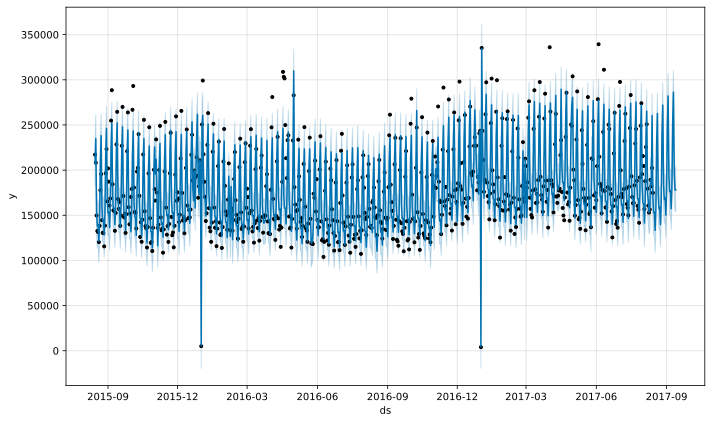

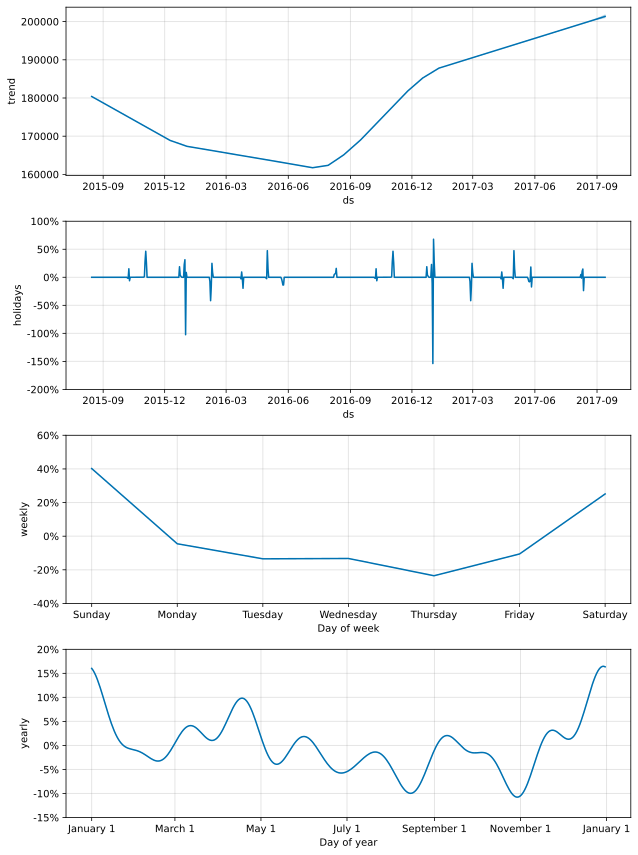

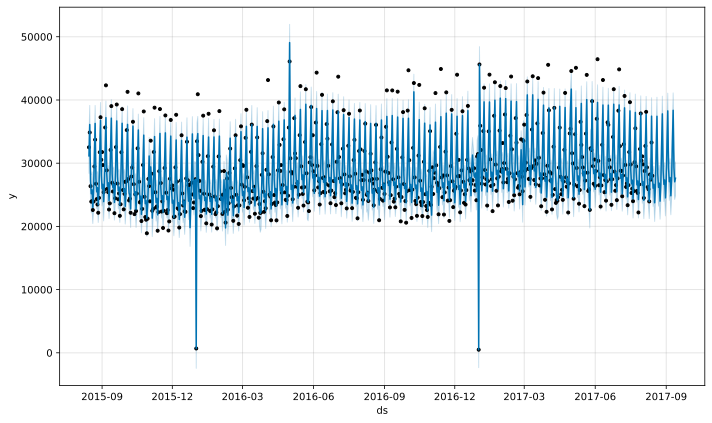

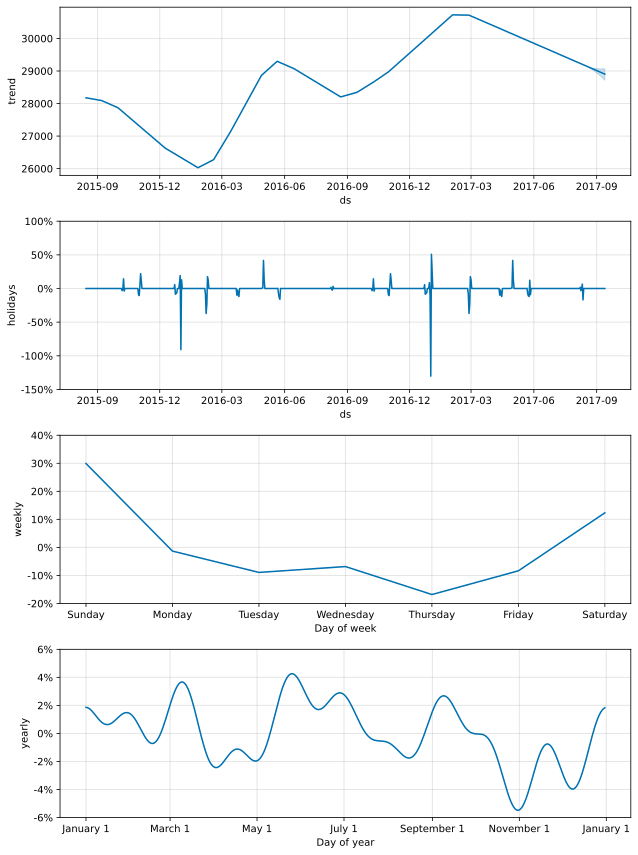

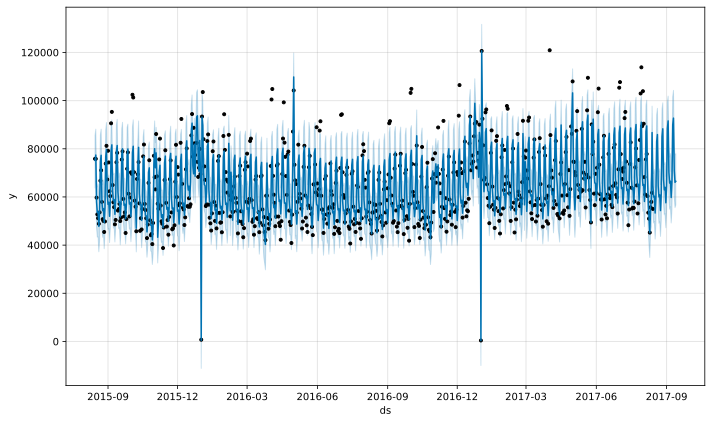

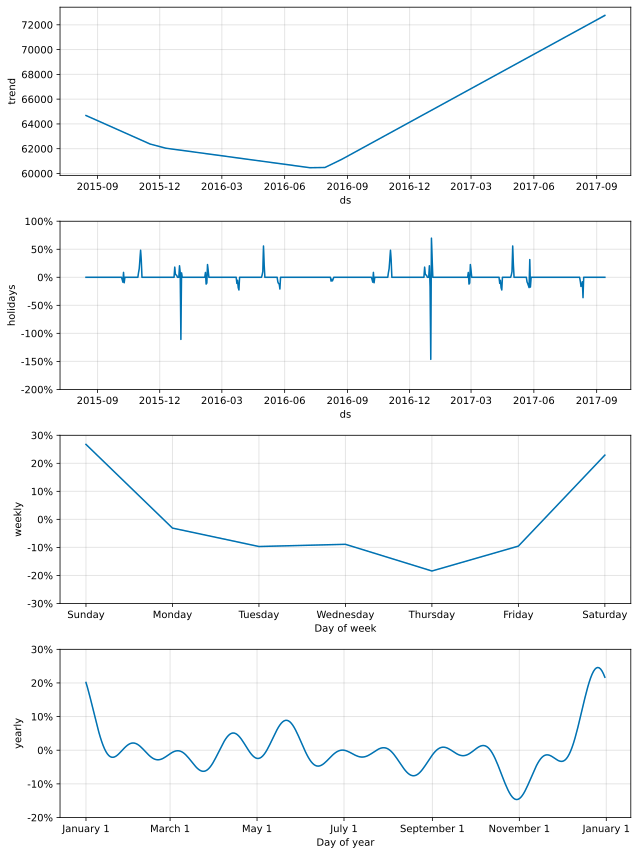

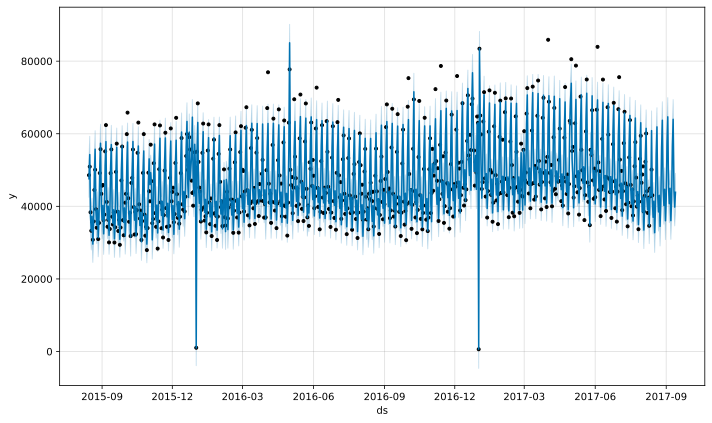

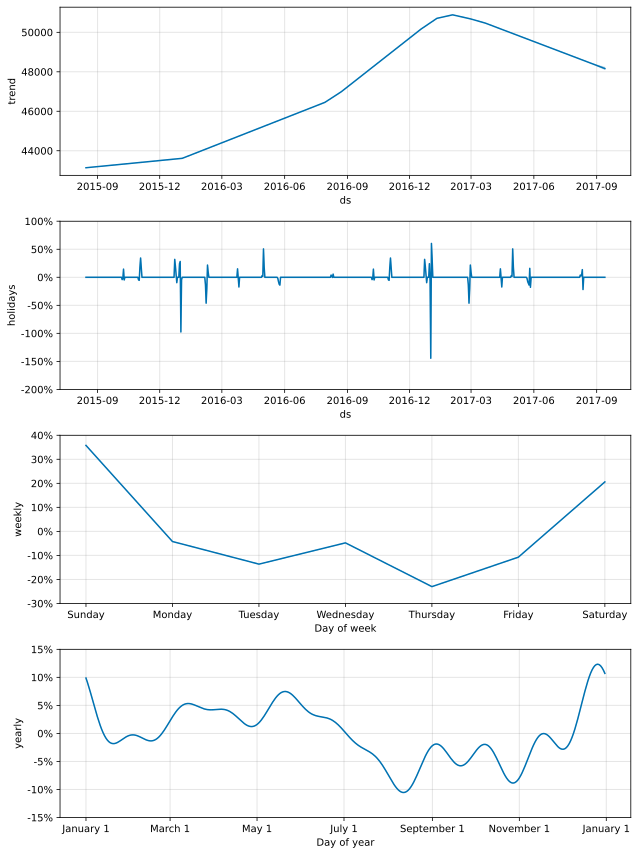

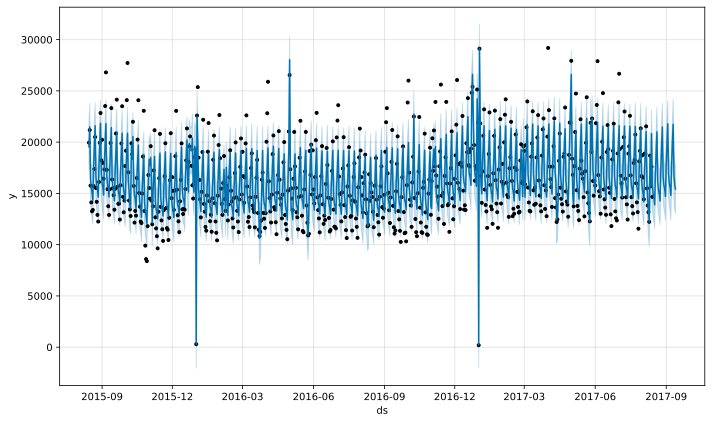

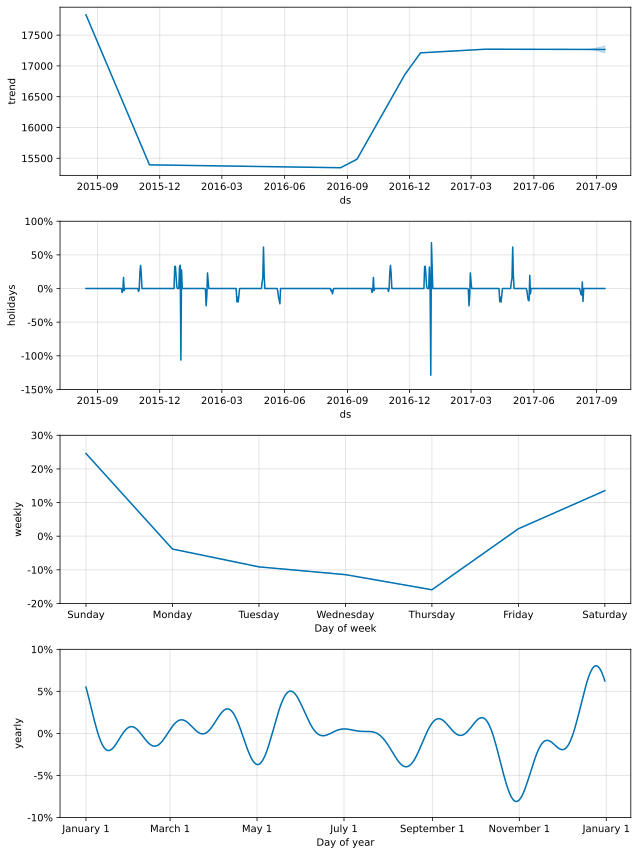

In [ ]:
prediction_days = 30
forecast_start_date = max(total_sales_df.index)
#PROPHET MODEL

forecasted_dfs = []

for feature in new_sales_df.columns[:5]:

    #formatting
    df_copy = new_sales_df[feature].copy().reset_index()
    df_copy.columns = ['ds','y']
    df_copy[['y']] = df_copy[['y']].apply(pd.to_numeric)
    df_copy['y'].replace([np.inf, -np.inf], np.nan, inplace=True)

    df_copy['ds'] = pd.to_datetime(df_copy['ds'])

    df_copy_ = df_copy[df_copy['ds'] < forecast_start_date]

    #finding the right params_dict for this category
    params_dict = dicts[feature]

    #model
    m = Prophet(changepoint_prior_scale = dicts[feature]['changepoint_prior_scale'],
                seasonality_prior_scale = dicts[feature]['seasonality_prior_scale'],
                seasonality_mode = 'multiplicative',
                holidays=holiday_df
                 )

    m.fit(df_copy_)

    future = m.make_future_dataframe(periods=prediction_days)
    fcst_prophet_train = m.predict(future)

    fig1 = m.plot(fcst_prophet_train)
    fig2 = m.plot_components(fcst_prophet_train)

    forecasted_df = fcst_prophet_train[fcst_prophet_train['ds']>=forecast_start_date]

    forecasted_dfs.append(forecasted_df)
